##**Automatic Ticket Assignment - problem statement, objective and steps involved**

# INDEX:

----

####I. Import Libraries
####II. Load and understand the data
####III. Data Cleansing
####IV. Exploratory Data Analysis
>i. Group by category   
>ii. Distribution by group   
>iii. Caller - Assignment group analysis to identify any patterns   
>iv. Short description length analysis and its relation with Assignment group   
>v. Description length analysis and its relation with assignment group   
>vi. Mean length of Description Columns   
>vii. Get the Frequency of Words in the Description Column   
####V. Text Pre-processing   
>i. Expand the contractions   
>ii. English Language Detection   
>iii. Plot the language Distribution   
>iv. Translate non-English details   
>v. Tokenization   
>vi. Converting all Characters to Lowercase   
>vii. Removing Punctuations   
>viii. Removing Stopwords   
>ix. Lemmatization   
>x. Plot the document frequency of the Description Field   
####VI. Exploratory Data Analysis on pre-processed Data   
>i.Groups with most and least frequent number of tickets   
>ii. Distribution of tickets based on ticket count   
>iii. Derive insights on ticket distribution by L1/L2 and L3 Queues   
>iv. Character and word counts in Short description by L1/L2 and L3   
>v. Number of unique words in each article   
>vi. Word clouds by assignment groups   
>vii. Hypothesis testing
>viii. Measure Readability of a ticket
####VII. Topic Modeling    
>i. Count Vectorizer   
>ii. Latent Dirichlet Allocation (LDA)  
>iii. Non-Negative Matrix Factorization (NMF) approach using TF-IDF   
>iv. TF-IDF distribution   
>v. Dimensionality Reduction using t-SNE
####VIII. Agglomerative Clustering   
>i. Get Embeddings from Glove   
>ii. Pseudo class setup   
####IX. KMeans clustering
####X. Model Building   
>i. Classification Models on Bag of Words   
>ii. Data balancing using cosine distance comparison and SMOTE techniques   
>iii. Classification Models on Glove embedding clusters   
>iv. Classification Models using KMeans clusters   
####XI. Hyperparameter Tuning   
>i. Determining the best hyperparameters using GridSearchCV   
>ii. Fit the models with tuned hyperparameters   
####XII. Prediction using Neural Network Models   
>i. Classification using BERT model   
>ii. BiDirectional LSTM for prediction   
>iii. Prediction using GRU model   
>iv. Prediction using RNN model   
>v. Text Classification With Hugging Face Transformers
####XIII. Group classification (Secondary layer)
>vi. Secondary Classification algorithm
####XIV. Final Conclusion


# Automatic Ticket Assignment





Problem Statement:

Manual assignment of incidents is time consuming and requires human efforts. There may be mistakes due to human errors and resource consumption is carried out ineffectively because of the misaddressing. On the other hand, manual assignment increases the response and resolution times which result in user satisfaction deterioration / poor customer service.

Additional effort needed for Functional teams to re-assign to right functional groups. During this process, some of the incidents are in queue and not addressed timely resulting in poor customer service. Guided by powerful AI techniques that can classify incidents to right functional groups can help organizations to reduce the resolving time of the issue and can focus on more productive tasks.

**Objective:**

The objective of the project is,

Learn how to use different classification models.
Use transfer learning to use pre-built models.
Learn to set the optimizers, loss functions, epochs, learning rate, batch size, checkpointing, early stopping etc.
Read different research papers of given domain to obtain the knowledge of advanced models for the given problem.
This capstone project intends to reduce the manual intervention of IT operations or Service desk teams by automating the ticket assignment process.The goal here is to create a text classification based ML model that can automatically classify any new tickets by analysing ticket description to one of the relevant Assignment groups, which could be later integrated to any ITSM tool like Service Now. Based on the ticket description our model will output the probability of assigning it to one of the 74 Groups.

Data:

Details about the data and dataset files are given in below link, https://drive.google.com/open?id=1OZNJm81JXucV3HmZroMq6qCT2m7ez7IJ

**Steps Involved:**

> **Pre-Processing, Data Visualization and EDA**

*   Exploring the given Data files
*   Understanding the structure of data
*   Missing points in data
*   Finding inconsistencies in the data
*   Visualizing different patterns
*   Visualizing different text features
*   Dealing with missing values
*   Text preprocessing
*   Creating word vocabulary from the corpus of report text data
*   Creating tokens as required

> **Model Building**

*   Building a model architecture which can classify.
*   Trying different model architectures by researching state of the art for similar tasks.
*   Train the model
*   To deal with large training time, save the weights so that you can use them when training the model for the second time without starting from scratch.

> **Test the Model, Fine-tuning and Repeat**

*   Test the model and report as per evaluation metrics
*   Try different models
*   Try different evaluation metrics
*   Set different hyper parameters, by trying different optimizers, loss functions, epochs, learning rate, batch size, checkpointing, early stopping etc..for these models to fine-tune them
*   Report evaluation metrics for these models along with your observation on how changing different hyper parameters leads to change in the final evaluation metric.

In [3]:
 !pip install ftfy wordcloud goslate spacy plotly cufflinks

     |████████████████████████████████| 64 kB 1.2 MB/s 
     |████████████████████████████████| 220 kB 11.7 MB/s 
     |████████████████████████████████| 13.2 MB 10.6 MB/s 
     |████████████████████████████████| 81 kB 5.9 MB/s 
  Created wheel for ftfy: filename=ftfy-5.8-py3-none-any.whl size=45612 sha256=60f532f93eb8070ec9288c120e196d4b58ba7088eec4ccb672ed3df5ecc178e3
  Stored in directory: /Users/sridharkidambi/Library/Caches/pip/wheels/49/1c/fc/8b19700f939810cd8fd9495ae34934b246279791288eda1c31
  Created wheel for wordcloud: filename=wordcloud-1.8.1-cp37-cp37m-macosx_10_7_x86_64.whl size=162120 sha256=548099d68883796d19e94ed5e4fef359e6913bb98874addda778e8ce8df13d51
  Stored in directory: /Users/sridharkidambi/Library/Caches/pip/wheels/f8/f6/55/6bd394c32a844a621ca0fe5dbf563c8d71d71edaf095656991
  Created wheel for goslate: filename=goslate-1.5.1-py3-none-any.whl size=11547 sha256=3165f23ef2232c4e503fecfdeef7b8c5e4dc74336122b93dbb42badd2d5b2bf8
  Stored in directory: /Users/sridharki

## Import Libraries

pip install tensorflow  googletrans contractions fasttext langdetect gensim imblearn bs4 pyLDAvis bert-for-tf2 sentencepiece tqdm spacy textstat scikit-learn pickle

In [2]:
!pip install ktrain==0.18.0

     |████████████████████████████████| 25.2MB 137kB/s 
     |████████████████████████████████| 516.2MB 21kB/s 
     |████████████████████████████████| 6.7MB 55.2MB/s 
     |████████████████████████████████| 983kB 48.0MB/s 
     |████████████████████████████████| 245kB 53.8MB/s 
     |████████████████████████████████| 51kB 7.7MB/s 
     |████████████████████████████████| 1.5MB 42.1MB/s 
     |████████████████████████████████| 471kB 56.5MB/s 
     |████████████████████████████████| 3.0MB 51.3MB/s 
     |████████████████████████████████| 460kB 56.3MB/s 
     |████████████████████████████████| 890kB 51.6MB/s 
     |████████████████████████████████| 2.9MB 47.0MB/s 
  Created wheel for ktrain: filename=ktrain-0.18.0-cp36-none-any.whl size=25252289 sha256=3846e52bb35787660189be8486a9abeb00c5812dee7b96ed81b7f28454548755
  Stored in directory: /root/.cache/pip/wheels/80/de/95/d74bb02fa07a9c51b8d9177cc78c2499250ac12185295d19e8
  Created wheel for keras-bert: filename=keras_bert-0.86.0-cp36-none

In [3]:
pip install tensorflow

In [4]:
# Basic python computation and visualization
import numpy as np
import pandas as pd
#pd.set_option('display.max_colwidth', None)
import matplotlib.pyplot as plt 
from matplotlib.ticker import MaxNLocator
import seaborn as sns
sns.set(style='whitegrid',palette='muted',font_scale=1.2)
HAPPY_COLORS_PALETTE = ["#01BEFE","#FFDD00","#FF7D00","#FF006D","#ADFF02","#8F00FF"]
sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

from pylab import rcParams
rcParams['figure.figsize']=12,8
import scipy
import scipy.stats as st
from statsmodels.stats.proportion import proportions_ztest
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# For handling string
import string
import random
import collections
from collections import Counter
# For performing mathematical operations
import math

# Deep Learning Libraries and models
import tensorflow as tf
import keras 
from keras.preprocessing.text import Tokenizer
from keras.models import Sequential
from keras.layers import Dense
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Input, Dense, Dropout, Embedding, LSTM, Flatten, GRU, Activation, Bidirectional, GlobalMaxPool1D, Conv1D, MaxPooling1D
from keras.models import Model
from keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import io
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorboard.plugins import projector
import bert
from bert import BertModelLayer
from bert.loader import StockBertConfig, map_stock_config_to_params, load_stock_weights
from bert.tokenization.bert_tokenization import FullTokenizer
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Model building
from time import time
from sklearn import preprocessing
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder 
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, auc, f1_score, precision_score, recall_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from xgboost.sklearn import XGBClassifier
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist
import pickle
plt.style.use('ggplot')
%matplotlib inline

# Tools & Evaluation metrics
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import roc_curve, accuracy_score, precision_recall_curve 
from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import train_test_split, cross_val_score
from imblearn.over_sampling import RandomOverSampler

# NLP text handling libraries
import re
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk import FreqDist
from nltk import pos_tag
from string import punctuation
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import spacy
import googletrans
from googletrans import Translator
from gensim.test.utils import datapath, get_tmpfile
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec
from gensim.models import Word2Vec
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import contractions
import fasttext
from langdetect import detect
import textstat

# Topic Modeling
import pyLDAvis.sklearn
from textblob import TextBlob
from sklearn.decomposition import LatentDirichletAllocation, NMF
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE


# Packaging for deploying
import pickle

# General purpose
import os
from zipfile import ZipFile
from google.colab import drive
from tqdm import tqdm
import datetime

RANDOM_SEED=42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


In [5]:
import sys,os
# Block which runs on both Google Colab and Local PC without any modification
if 'google.colab' in sys.modules:    
    project_path = "/content/drive/My Drive/"
    # Google Colab lib
    from google.colab import drive
    # Mount the drive
    drive.mount('/content/drive/', force_remount=True)
    sys.path.append(project_path)
    %cd $project_path

# Let's look at the sys path
print('Current working directory', os.getcwd())

Mounted at /content/drive/
/content/drive/My Drive
Current working directory /content/drive/My Drive


## Load and Understand the Data

In [6]:
## Read the data from EXCEL
incidents = pd.read_excel('/content/drive/My Drive/input_data.xlsx' )

## Quick View 
incidents.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [7]:
## basic info
incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [8]:
## Shape
incidents.shape

(8500, 4)

In [9]:
## List of columns
incidents.columns

Index(['Short description', 'Description', 'Caller', 'Assignment group'], dtype='object')

In [10]:

# Describe the dataset with various summary and statistics
incidents.describe()

,Short description,Description,Caller,Assignment group
count,8492,8499,8500,8500
unique,7481,7814,2950,74
top,password reset,the,bpctwhsn kzqsbmtp,GRP_0
freq,38,56,810,3976


In [11]:
## List the unique assignment groups
incidents["Assignment group"].unique()
print("Number of unique assignment groups - ", incidents["Assignment group"].nunique())

Number of unique assignment groups -  74


In [12]:

targetClassCnt=incidents['Assignment group'].value_counts()
targetClassCnt.describe()

count      74.000000
mean      114.864865
std       465.747516
min         1.000000
25%         5.250000
50%        26.000000
75%        84.000000
max      3976.000000
Name: Assignment group, dtype: float64

In [13]:
# Check the Short description of tickets having Description as only 'the'
incidents[incidents.Description == 'the'].head()

,Short description,Description,Caller,Assignment group
1049,reset passwords for soldfnbq uhnbsvqd using pa...,the,soldfnbq uhnbsvqd,GRP_17
1054,reset passwords for fygrwuna gomcekzi using pa...,the,fygrwuna gomcekzi,GRP_17
1144,reset passwords for wvdxnkhf jirecvta using pa...,the,wvdxnkhf jirecvta,GRP_17
1184,reset passwords for pxvjczdt kizsjfpq using pa...,the,pxvjczdt kizsjfpq,GRP_17
1292,reset passwords for cubdsrml znewqgop using pa...,the,cubdsrml znewqgop,GRP_17


In [14]:
## find nulls
incidents[incidents.isna().any(axis=1)]

,Short description,Description,Caller,Assignment group
2604,NaN,\n\nreceived from: ohdrnswl.rezuibdt@gmail.com...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\n-connected to the user system using teamview...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\n-connected to t...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\n-connected to t...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\n-connected to t...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\n-connected to t...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\n\nreceived from: eqmuniov.ehxkcbgj@gmail.com...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [15]:
incidents.Description.where(~(incidents.Description == 'the'), other='reset_passwrod', inplace=True)

In [16]:

# replacing na values in description
incidents["Description"].fillna("i am locked out of skype", inplace = True) 

In [17]:
sub_incidents = incidents[['Short description', 'Description', 'Caller','Assignment group']].copy()
duplicateRowsDF = sub_incidents[sub_incidents.duplicated()]
duplicateRowsDF

,Short description,Description,Caller,Assignment group
51,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,olckhmvx pcqobjnd,GRP_0
229,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,olckhmvx pcqobjnd,GRP_0
493,ticket update on inplant_872730,ticket update on inplant_872730,fumkcsji sarmtlhy,GRP_0
512,blank call //gso,blank call //gso,rbozivdq gmlhrtvp,GRP_0
667,job bkbackup_tool_powder_prod_full failed in j...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_8
...,...,...,...,...
7836,probleme mit erpgui \tmqfjard qzhgdoua,probleme mit erpgui \tmqfjard qzhgdoua,tmqfjard qzhgdoua,GRP_24
8051,issue on pricing in distributor_tool,we have agreed price with many of the distribu...,hbmwlprq ilfvyodx,GRP_21
8093,reset passwords for prgthyuulla ramdntythanjes...,reset_passwrod,boirqctx bkijgqry,GRP_17
8347,blank call // loud noise,blank call // loud noise,rbozivdq gmlhrtvp,GRP_0


In [18]:
# Remove Duplicates
incidents =incidents.drop_duplicates(['Short description', 'Description', 'Caller', 'Assignment group'])
incidents

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0
...,...,...,...,...
8495,emails not coming in from zz mail,\n\nreceived from: avglmrts.vhqmtiua@gmail.com...,avglmrts vhqmtiua,GRP_29
8496,telephony_software issue,telephony_software issue,rbozivdq gmlhrtvp,GRP_0
8497,vip2: windows password reset for tifpdchb pedx...,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0
8498,machine nÃ£o estÃ¡ funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62


**Observation:**

* There are 4 columns and all are string columns.
* There are totally 8500 rows and there seems to be missing values in Short description and Description columns, which needs to be looked into and handled.
* There are 74 unique assignment groups - GRP_0 the most frequent item with 3976 entries.
* Caller columns mainly contains the details of the user who raised the incident and is of not much use in our analysis and can be dropped.
* Assignment group is our predictor / target column with multiple classes.
This is a Multiclass Classification problem.


## Data Cleansing
Following actions were peformed - 
* Remove null columns
* Drop duplicates
* Remove special characters, trailing spaces, numbers
* Convert to lower case

In [19]:

#Fill 'Decsription' field entries that have null with blank space
incidents.fillna(value=' ', inplace=True)

In [20]:
incidents.columns

Index(['Short description', 'Description', 'Caller', 'Assignment group'], dtype='object')

In [21]:
## Duplicates 
incidents[incidents.duplicated()]

,Short description,Description,Caller,Assignment group


In [22]:
#remove spaces trailing
incidents['Short description'] = incidents['Short description'].str.strip()
incidents['Description'] = incidents['Description'].str.strip()

#remove tabs and carriage returns
incidents.replace(to_replace=[r"\\t|\\n|\\r", "\t|\n|\r"], value=[" "," "], regex=True, inplace=True)

# Removing special characters
incidents['Short description']  = incidents['Short description'].map(lambda x: re.sub(r'\W', ' ', x))
incidents['Description'] = incidents['Description'].map(lambda x: re.sub(r'\W', ' ', x))

#Getting rid of numbers & special characters etc

spec_chars = ["!",'"',"#","%","&","'","(",")",
              "*","+",",","-",".","/",":",";","<",
              "=",">","?","@","[","\\","]","^","_",
              "`","{","|","}","~","–"]
for char in spec_chars:
    incidents['Short description'] = incidents['Description'].str.replace(char, ' ')
    incidents['Description'] = incidents['Description'].str.replace(char, ' ')

#remove numbers    
incidents['Description'] = incidents['Description'].replace('\d+', '', regex=True)
incidents['Short description'] = incidents['Short description'].replace('\d+', '', regex=True)
    
#remove more than 1 space
incidents.replace('\s+', ' ', regex=True, inplace=True)

#make lower case
incidents.apply(lambda x: x.astype(str).str.lower())

incidents.head(10)

<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence \d
<input>:23: DeprecationWarning: invalid escape sequence \d
<input>:24: DeprecationWarning: invalid escape sequence 

,Short description,Description,Caller,Assignment group
0,verified user details employee manager name c...,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0
1,received from hmjdrvpb komuaywn gmail com hell...,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0
2,received from eylqgodm ybqkwiam gmail com hi i...,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0
6,event critical HostName company com the value ...,event critical HostName company com the value ...,jyoqwxhz clhxsoqy,GRP_1
7,ticket no employment status new non employee e...,ticket no employment status new non employee e...,eqzibjhw ymebpoih,GRP_0
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0
9,ticket update on inplant,ticket update on inplant,fumkcsji sarmtlhy,GRP_0


## Exploratory Data Analysis


**Exploratory Data Analysis (EDA)** is an approach/philosophy for data analysis that employs a variety of techniques (mostly graphical) to

maximize insight into a data set;

uncover underlying structure;

extract important variables;

detect outliers and anomalies;

test underlying assumptions;

develop parsimonious models; and

determine optimal factor settings

### Group by Category

In [23]:
## Group by Categories
df_grp = incidents.groupby(['Assignment group']).size().reset_index(name='counts')
df_grp

,Assignment group,counts
0,GRP_0,3933
1,GRP_1,31
2,GRP_10,140
3,GRP_11,30
4,GRP_12,257
...,...,...
69,GRP_71,2
70,GRP_72,2
71,GRP_73,1
72,GRP_8,645


In [24]:
df_grp.describe()

,counts
count,74.000000
mean,113.729730
std,460.617492
min,1.000000
25%,5.250000
50%,26.000000
75%,81.000000
max,3933.000000


In [25]:
from ftfy import fix_encoding, fix_text, badness

In [26]:
# Write a function to apply to the dataset to detect Mojibakes
def is_mojibake_impacted(text):
    if not badness.sequence_weirdness(text):
        # nothing weird, should be okay
        return True
    try:
        text.encode('sloppy-windows-1252')
    except UnicodeEncodeError:
        # Not CP-1252 encodable, probably fine
        return True
    else:
        # Encodable as CP-1252, Mojibake alert level high
        return False
    
# Check the dataset for mojibake impact
incidents[~incidents.iloc[:,:-1].applymap(is_mojibake_impacted).all(1)]

,Short description,Description,Caller,Assignment group
124,from tvcdfqgp nrbcqwgj sent friday october pm ...,from tvcdfqgp nrbcqwgj sent friday october pm ...,tvcdfqgp nrbcqwgj,GRP_0
162,received from yfqoaepn xnezhsit gmail com hell...,received from yfqoaepn xnezhsit gmail com hell...,yfqoaepn xnezhsit,GRP_0
164,received from abcdri company com windy shi å æ...,received from abcdri company com windy shi å æ...,tycludks cjofwigv,GRP_0
186,from sent friday october am to nwfodmhc exurcw...,from sent friday october am to nwfodmhc exurcw...,yafxlpwi lhxvatkb,GRP_18
222,support fÃ¼r fa konnica arexjftu ohxdwngl,support fÃ¼r fa konnica arexjftu ohxdwngl,arexjftu ohxdwngl,GRP_24
...,...,...,...,...
8436,error message laufzeitfehler ungÃ¼ltige verwen...,error message laufzeitfehler ungÃ¼ltige verwen...,xsjqhdgp ymstzudl,GRP_25
8457,æ ¾ç ºjavaæ ä æ æ³ åŠ è½½ï¼Œæ éœ ç ˆæœ æˆ æ é ...,æ ¾ç ºjavaæ ä æ æ³ åŠ è½½ï¼Œæ éœ ç ˆæœ æˆ æ é ...,kyagjxdh dmtjpbnz,GRP_30
8465,vpnè žä ä Šï¼Œè è½ ç è ºæ å¹³ atcbvglq bdvmusz...,vpnè žä ä Šï¼Œè è½ ç è ºæ å¹³ atcbvglq bdvmusz...,fcvqezmn frzyjknu,GRP_30
8467,from ntydihzo aeptfbgs sent friday august am t...,from ntydihzo aeptfbgs sent friday august am t...,ntydihzo aeptfbgs,GRP_0


In [27]:
# Sanitize the dataset from Mojibakes
incidents['Short description'] =incidents['Short description'].apply(fix_text)
incidents['Description'] = incidents['Description'].apply(fix_text)


### Distribution by group

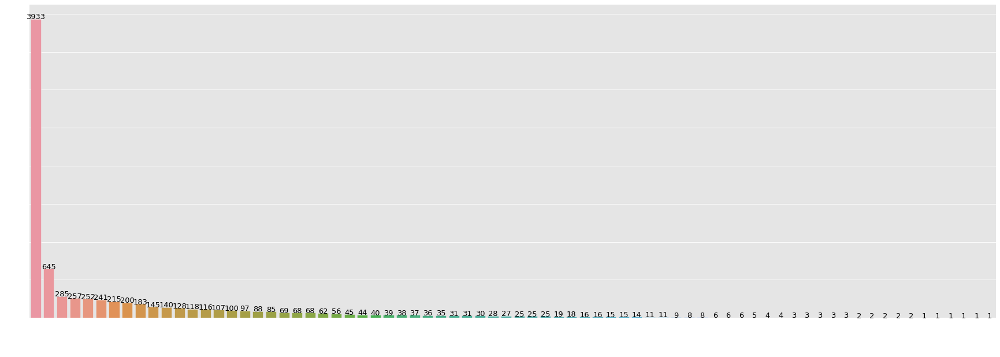

In [28]:
assgn = incidents['Assignment group'].value_counts()
plt.figure(figsize=(30,10))
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'
cntplot = sns.barplot(x=assgn.index,y=assgn.values)
cntplot.set_xticklabels(cntplot.get_xticklabels(), rotation=90, ha="right")
for i in range(len(assgn)):
  cntplot.text(i, assgn.values[i], assgn.values[i], color='black', ha='center', fontsize=13)
plt.show()

**Observation:**

* The Target class distrubtion is extremely skewed
* Large no of entries for GRP_0 (amounting to 3926) which account for ~50% of the data
* GRP_0 and GRP_8 together amount to around 55% of the available data.
* There are groups with 1 entry also. 
* We have to resolve the imbalance before modelling.

### Caller - Assignment group analysis to identify any patterns

In [29]:
incidents['Caller'].describe()

count                  8416
unique                 2950
top       bpctwhsn kzqsbmtp
freq                    788
Name: Caller, dtype: object

**Observation:**
*   There are 2948 unique callers who have submitted tickets.
*   'bpctwhsn kzqsbmtp' is the most frequent caller with 788 records  

Let us try to explore any relation between the caller and assignment groups.

In [30]:
incidents_freqgrp = incidents[incidents['Assignment group'].isin(list(incidents['Assignment group'].value_counts()[incidents['Assignment group'].value_counts()>10].index))]
freq_grp = (np.max(pd.crosstab(incidents_freqgrp['Caller'],incidents_freqgrp['Assignment group'])) /
            np.sum(pd.crosstab(incidents_freqgrp['Caller'],incidents_freqgrp['Assignment group']))).sort_values(ascending=False)
grp_df = incidents_freqgrp[incidents_freqgrp['Assignment group'].isin(list(freq_grp[freq_grp>0.4].index))].groupby(by='Assignment group').agg(lambda x:x.value_counts().index[0])
grp_df.loc[freq_grp[freq_grp>0.4].index,'Percentage tickets by most frequent caller'] = freq_grp[freq_grp>0.4].round(3).values
grp_df.loc[freq_grp[freq_grp>0.4].index,'Total records for group'] = incidents[incidents['Assignment group'].isin(list(freq_grp[freq_grp>0.4].index))]['Assignment group'].value_counts()
grp_df.drop(columns=['Short description','Description'])

,Caller,Percentage tickets by most frequent caller,Total records for group
Assignment group,,,
GRP_10,bpctwhsn kzqsbmtp,0.429,140
GRP_41,entuakhp xrnhtdmk,0.550,40
GRP_5,bpctwhsn kzqsbmtp,0.742,128
GRP_6,bpctwhsn kzqsbmtp,0.481,183
GRP_60,bpctwhsn kzqsbmtp,0.750,16
GRP_8,bpctwhsn kzqsbmtp,0.536,645
GRP_9,bpctwhsn kzqsbmtp,0.607,252


**Observation:**

* We have listed the assignment groups where most of the records are submitted by 
single caller.
* 'bpctwhsn kzqsbmtp' is the most frequent caller for groups 5, 6, 8, 9, 10 and 60. 
* There is some correlation between these groups and caller names, but this is not significant enough finding to set as a rule.








In [31]:
incidents_freqcall = incidents[incidents['Caller'].isin(list(incidents['Caller'].value_counts()[incidents['Caller'].value_counts()>20].index))]
freq_call = (np.max(pd.crosstab(incidents_freqcall['Assignment group'],incidents_freqcall['Caller'])) /
            np.sum(pd.crosstab(incidents_freqcall['Assignment group'],incidents_freqcall['Caller']))).sort_values(ascending=False)
call_df = incidents_freqcall[incidents_freqcall['Caller'].isin(list(freq_call[freq_call>0.7].index))].groupby(by='Caller').agg(lambda x:x.value_counts().index[0])
call_df.loc[freq_call[freq_call>0.7].index,'Percentage tickets by most frequent group'] = freq_call[freq_call>0.7].round(3).values
call_df.loc[freq_call[freq_call>0.7].index,'Total records for caller'] = incidents[incidents['Caller'].isin(list(freq_call[freq_call>0.7].index))]['Caller'].value_counts()
call_df.drop(columns=['Short description','Description'])

,Assignment group,Percentage tickets by most frequent group,Total records for caller
Caller,,,
efbwiadp dicafxhv,GRP_0,1.000,45
entuakhp xrnhtdmk,GRP_41,0.880,25
fumkcsji sarmtlhy,GRP_0,0.984,128
jionmpsf wnkpzcmv,GRP_24,0.958,24
olckhmvx pcqobjnd,GRP_0,1.000,47
rbozivdq gmlhrtvp,GRP_0,0.986,72


**Observation:**

*   We have plotted the caller based analysis where most of the records submitted by the caller are to a single group.
* All the records from callers 'efbwiadp dicafxhv' and 'olckhmvx pcqobjnd' are assigned to group 0. Again, we can't consider this significant because group 0 records account for half of all input data.
* Consider the volume of total records, we conclude there is no significant correlation between caller and assignment group.



### Short description length analysis and its relation with Assignment group

In [32]:
incidents['sdesc_len'] = incidents['Short description'].str.len()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of length of short descriptions')

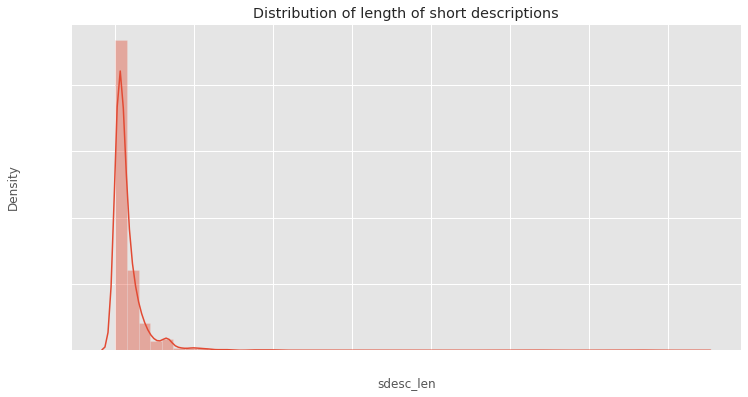

In [33]:
plt.figure(figsize=(12,6))
sns.distplot(incidents['sdesc_len']).set_title('Distribution of length of short descriptions')

**Observation:**

Above plot shows the distribution of short description lengths.
We observe two peaks - most of the records are 20-30 words long but there is also a peak around 60. There is a possibility that this peak maybe characteristic of particular groups. Let us look at the groupwise analysis.

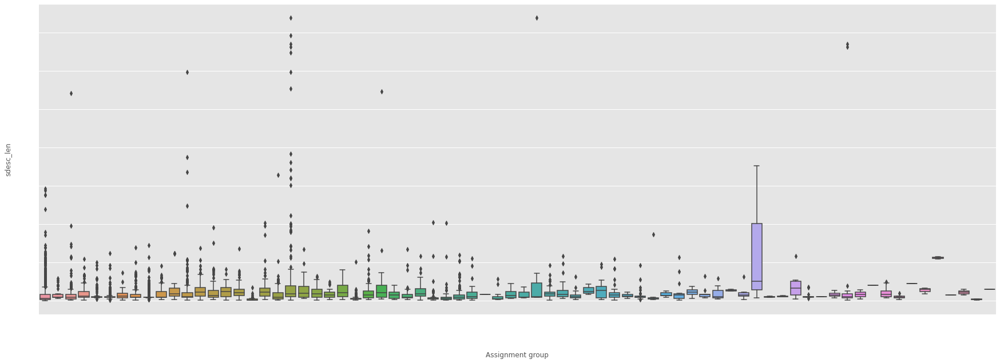

In [34]:
plt.figure(figsize=(30,10))
lengths = sns.boxplot(data=incidents, x='Assignment group', y='sdesc_len')
lengths.set_xticklabels(lengths.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

We can see most of the short description are around 30 to 80 characters long with mean length around 50. However, we can see data for certain groups are on the upper range (GRP_20, GRP_1, GRP_56), while some have a characteristic to have lower lengths (GRP_0, GRP_48, GRP_19).

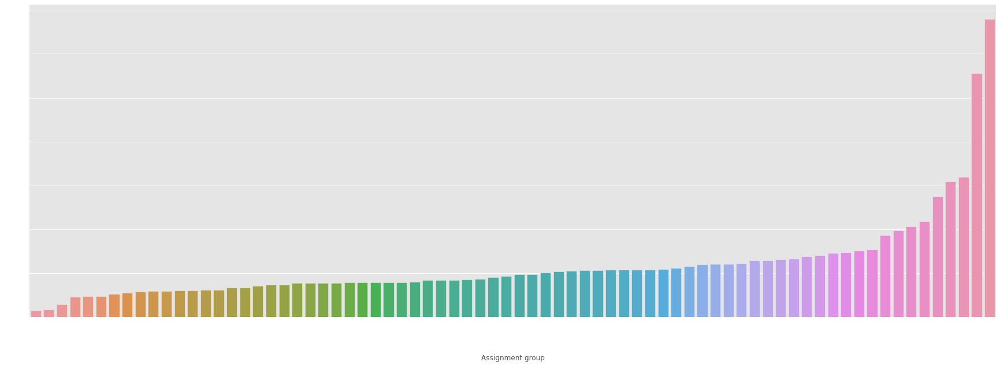

In [35]:
plt.figure(figsize=(30,10))
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'
plot_meansdesc_len=sns.barplot(x=incidents.groupby(['Assignment group']).mean()['sdesc_len'].sort_values().index,
                               y=incidents.groupby(['Assignment group']).mean()['sdesc_len'].sort_values().values)
plot_meansdesc_len.set_xticklabels(plot_meansdesc_len.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

We are seeing a pattern with records for groups 17, 57 and 61 typically having longer mean word lengths in contrast to most other groups having lengths below 60 words.


### Description length analysis and its relation with assignment group

In [36]:
incidents['desc_len'] = incidents['Description'].str.len()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of length of descriptions')

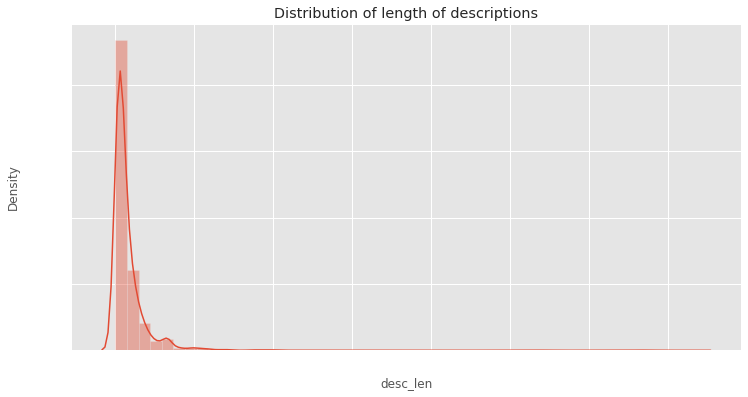

In [37]:
plt.figure(figsize=(12,6))
sns.distplot(incidents['desc_len']).set_title('Distribution of length of descriptions')

**Observation:**

The distribution of description lengths is extremely skewed, let us try to omit the tail and focus the major portion from the right skewed graph.

In [38]:
incidents['desc_len'].describe(percentiles=[0.25,0.5,0.75,0.9,0.95])

count    8416.000000
mean      167.116920
std       343.998589
min         0.000000
25%        39.000000
50%        81.000000
75%       184.000000
90%       352.000000
95%       585.250000
max      7376.000000
Name: desc_len, dtype: float64

In [39]:
len(incidents[incidents['desc_len'] > 680])

230

**Observation:**

* Half of the records have less than 100 words.
* 90% of descriptions have less than 400 words.
* The remaining 10% records are very long and extremely skewed in comparison with the remaining portion.

Let us consider till the 95th percentile for further visualization.

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of length of descriptions')

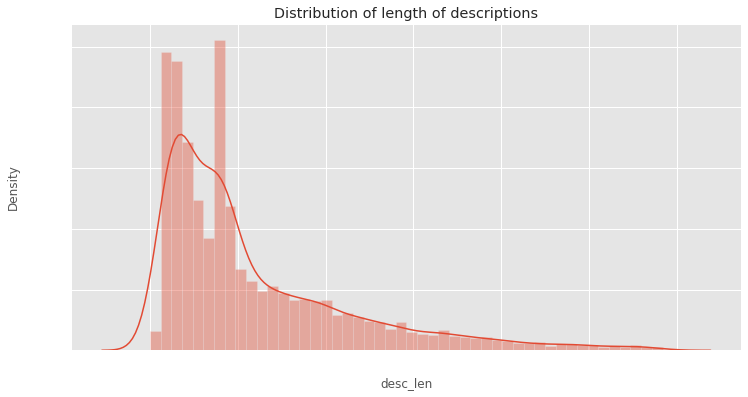

In [40]:
incidents_95 = incidents[incidents['desc_len'] < incidents['desc_len'].quantile(0.95)]
plt.figure(figsize=(12,6))
sns.distplot(incidents_95['desc_len']).set_title('Distribution of length of descriptions')

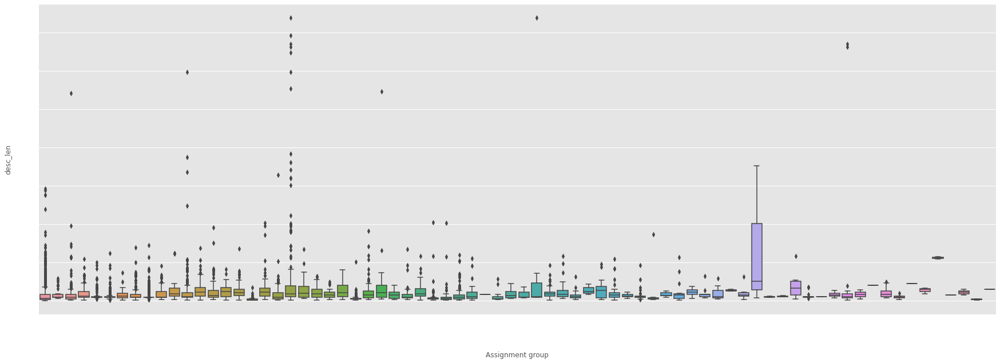

In [41]:
plt.figure(figsize=(30,10))
lengths = sns.boxplot(data=incidents, x='Assignment group', y='desc_len')
lengths.set_xticklabels(lengths.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

From the above graph, most of the group 56 records have long descriptions.
Let us bring the focus to records which have limited length. 


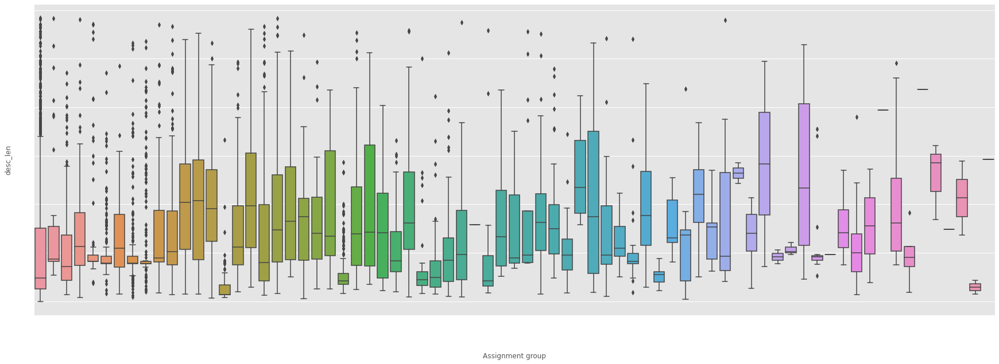

In [42]:
plt.figure(figsize=(30,10))
lengths = sns.boxplot(data=incidents_95, x='Assignment group', y='desc_len')
lengths.set_xticklabels(lengths.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

There is no clear pattern visible to describe the relation between group and description lengths. It is however visible that for most of the groups, there are less outliers and some groups fall in the lower range while most of them have lengths in the range of 100 to 350.

### Mean length of Description Columns

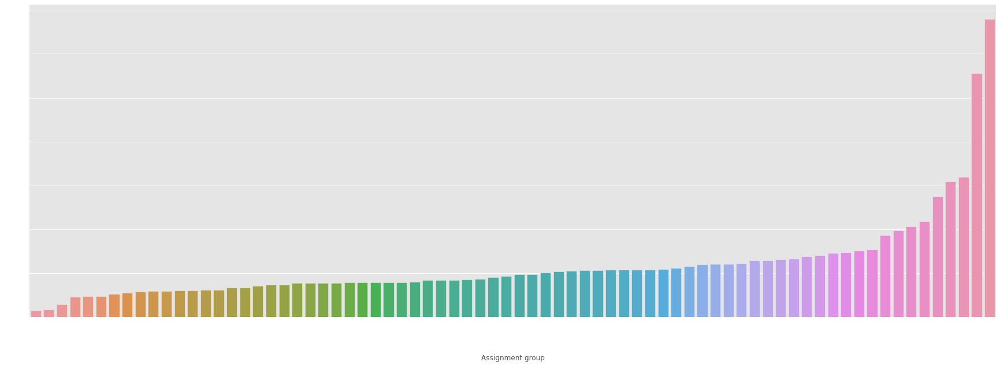

In [43]:
plt.figure(figsize=(30,10))
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'
plot_meandesc_len=sns.barplot(x=incidents.groupby(['Assignment group']).mean()['desc_len'].sort_values().index,
                               y=incidents.groupby(['Assignment group']).mean()['desc_len'].sort_values().values)
plot_meandesc_len.set_xticklabels(plot_meandesc_len.get_xticklabels(),rotation=90)
plt.show()

**Observation:**

There is a clear distinction between the data of five groups which have very long description data. Other group records have mean length lesser than 500 words.

In [44]:
#Check if short description is present in Description field, else merge both the fields into Description field
incidents['isSubstr'] = incidents.apply(lambda x: x['Short description'] not in x['Description'], axis=1)
incidents.loc[incidents['isSubstr']==True, 'Description'] = incidents['Short description'] + ' ' + incidents['Description']

In [45]:
incidents.drop(columns=['Short description','sdesc_len','desc_len','isSubstr'],inplace=True)
incidents.head()

,Description,Caller,Assignment group
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,owlgqjme qhcozdfx,GRP_0


### Get the Frequency of Words in the Description Column

---



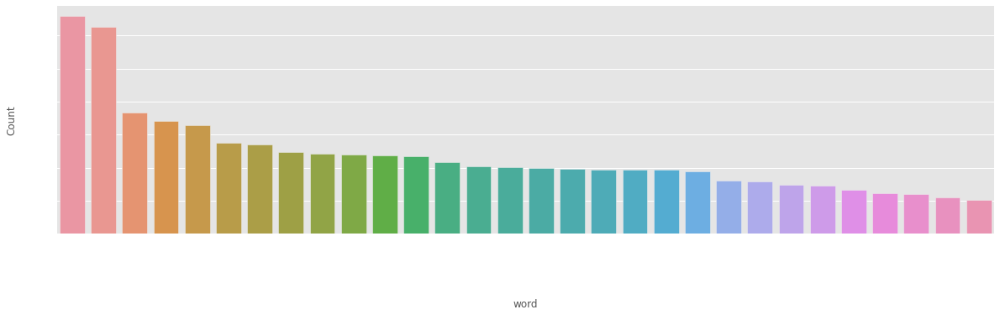

In [46]:
def freq_words(x, terms = 30):
  all_words = ' '.join([text for text in x])
  all_words = all_words.split()

  fdist = FreqDist(all_words)
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})

  # selecting top n most frequent words
  d = words_df.nlargest(columns="count", n = terms) 
  plt.figure(figsize=(20,5))
  plt.rcParams['xtick.color'] = 'white'
  plt.rcParams['ytick.color'] = 'white'
  ax = sns.barplot(data=d, x= "word", y = "count")
  ax.set(ylabel = 'Count')
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
  plt.show()

freq_words(list(incidents['Description']))

**Observation:**

The above plot shows most frequent words in the dataset.
We can see that most of the words are common English words (known as 'stopwords') and doesn't contribute to any inference. We can only try to do inference after we remove stopwords.

#### Generate a wordcloud for the Description column 

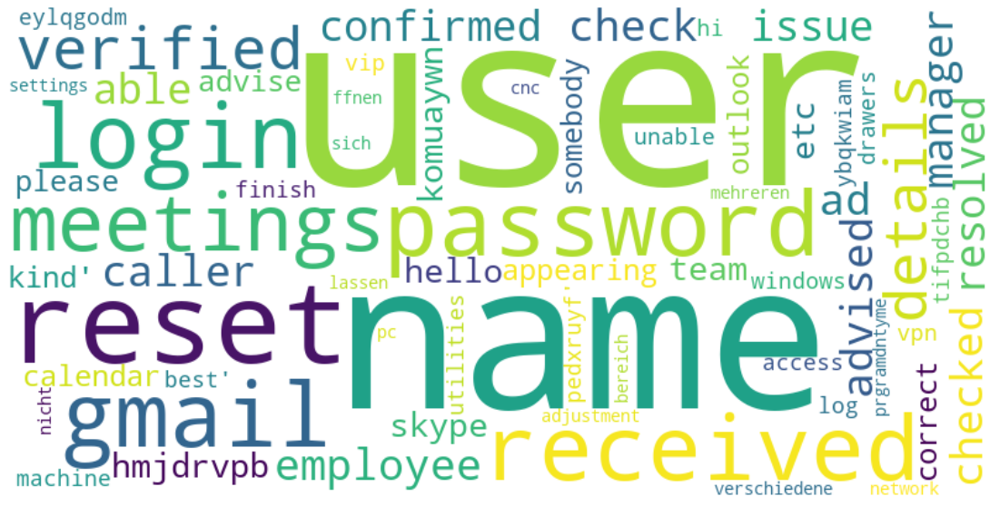

In [47]:
#word cloud for overall data
stopwords = STOPWORDS

wordcloud = WordCloud(stopwords = stopwords, max_words=500, background_color="white",width=800, height=400).generate(str(incidents['Description'].values))

plt.figure( figsize=(20,10) )
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()

**Observation:** 

The word cloud shows the top reasons for raising a ticket but it needs to be pre-processed so that we can identify any patterns.

## Text Pre-processing

#### Expand the contractions

In [48]:
incidents['Description_Expanded'] = incidents['Description'].apply(lambda x: [contractions.fix(word) for word in x.split()])

#Convert the expanded column to string
incidents['Description_Expanded_Str'] = [' '.join(map(str, l)) for l in incidents['Description_Expanded']]
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error


#### English Language Detection

In [49]:
pretrained_model = project_path + "lid.176.bin" 
model = fasttext.load_model(pretrained_model)
langs = []
for sent in incidents['Description_Expanded_Str']:
    lang = model.predict(sent)[0]
    langs.append(str(lang)[11:13])
incidents['langs'] = langs

incidents.head(10)

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja
5,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,"[unable, to, log, in, to, engineering, tool, a...",unable to log in to engineering tool and skype,en
6,event critical HostName company com the value ...,jyoqwxhz clhxsoqy,GRP_1,"[event, critical, HostName, company, com, the,...",event critical HostName company com the value ...,en
7,ticket no employment status new non employee e...,eqzibjhw ymebpoih,GRP_0,"[ticket, no, employment, status, new, non, emp...",ticket no employment status new non employee e...,en
8,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0,"[unable, to, disable, add, ins, on, outlook]",unable to disable add ins on outlook,en
9,ticket update on inplant,fumkcsji sarmtlhy,GRP_0,"[ticket, update, on, inplant]",ticket update on inplant,en


#### Plot the language Distribution

In [50]:
#checking detected languages
x=incidents['langs'].value_counts()

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


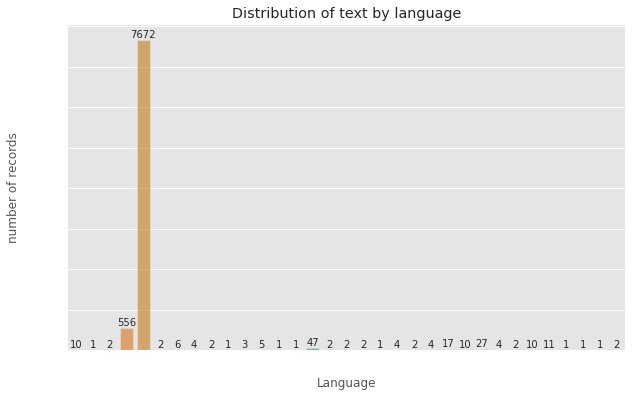

In [51]:
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Distribution of text by language")
plt.ylabel('number of records')
plt.xlabel('Language')
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show();

**Observation:**

The plot shows that there is sizeable amount of German (de) text in many records (~500) apart from English. It is of importance to gain knowledge from this records so we will proceed with translate.

#### Translate non-English details

In [52]:
germanwordlist = ['bitte','nicht','konto','probleme','berechtigung','defekt','mehr','ausgetauscht','rechner', 'drucker','teilweise','freigegeben','genannten','anmeldeaccount',
                  'besprochen','werden','durchwahl','oben','einrichten','zeitwirtschaft','seit','morgens','beheben','keine','zeitbuchungen','vorhanden','dringend','fehler',
                  'werk','anmelde','auftrag','kein','skannen','freundlichen','werkzeuge,','hartstoffe','maste','schutzw','fertigung','immer','sehr','zugriff','freundliche',
                  'geehrter','souzarft','noch','verbindungsherstellung','meldung','erneuten','glich','proben','beilageproben','beilage','auswerten','sinterleitstand','reparar',
                  'reparo','rechner','koenigsee','entregar','atualiza','declara','programdntya','funcionando','preciso','hitacni','grergtger','zugriffsrechte','teamleiter',
                  'abholen','wegen','weit','absender','wenn','abrechnung']
pattern = '|'.join(germanwordlist)

pattern

'bitte|nicht|konto|probleme|berechtigung|defekt|mehr|ausgetauscht|rechner|drucker|teilweise|freigegeben|genannten|anmeldeaccount|besprochen|werden|durchwahl|oben|einrichten|zeitwirtschaft|seit|morgens|beheben|keine|zeitbuchungen|vorhanden|dringend|fehler|werk|anmelde|auftrag|kein|skannen|freundlichen|werkzeuge,|hartstoffe|maste|schutzw|fertigung|immer|sehr|zugriff|freundliche|geehrter|souzarft|noch|verbindungsherstellung|meldung|erneuten|glich|proben|beilageproben|beilage|auswerten|sinterleitstand|reparar|reparo|rechner|koenigsee|entregar|atualiza|declara|programdntya|funcionando|preciso|hitacni|grergtger|zugriffsrechte|teamleiter|abholen|wegen|weit|absender|wenn|abrechnung'

In [53]:
germanDescIndex = incidents[incidents['Description_Expanded_Str'].str.contains(pattern)].index
germanDescIndex

Int64Index([ 223,  238,  251,  255,  265,  270,  272,  302,  304,  305,
            ...
            8414, 8417, 8419, 8420, 8425, 8427, 8436, 8439, 8467, 8499],
           dtype='int64', length=584)

In [54]:
!pip install google_trans_new

In [55]:

#Install google translator by pip if not installed
from google_trans_new import google_translator  
  
def request(text):
    lang = "en"
    t = google_translator(timeout=5)
    translate_text = t.translate(text.strip(), lang)
    return translate_text


In [56]:
for rowId in germanDescIndex:
  incidents['Description_Expanded_Str'][rowId] = request(incidents['Description_Expanded_Str'][rowId])

In [57]:
germanDescIndex_new = incidents[incidents['Description_Expanded_Str'].str.contains(pattern)].index
germanDescIndex_new

Int64Index([ 238,  305,  446,  874,  914,  932,  995, 1233, 1234, 1532, 1572,
            1576, 1737, 1968, 2076, 2080, 2081, 2084, 2384, 2445, 2541, 2721,
            2938, 2952, 2954, 2968, 2991, 3088, 3110, 3139, 3257, 3275, 3431,
            3433, 3438, 3571, 3585, 3633, 3660, 3703, 3834, 3907, 4027, 4147,
            4167, 4302, 4335, 4342, 4461, 4473, 4573, 4674, 4695, 4736, 4965,
            4970, 4980, 5110, 5209, 5448, 5471, 5506, 5693, 6017, 6052, 6213,
            6232, 6336, 6368, 6505, 6750, 6777, 6780, 6829, 6931, 6994, 7015,
            7028, 7240, 7243, 7361, 7386, 7429, 7565, 7711, 7723, 7782, 7809,
            7832, 7912, 8214, 8216, 8237, 8427, 8436],
           dtype='int64')

In [58]:
incidents['Description_Expanded_Str'][8232]

"stepfhryhan needs access to below collaboration platform links vacation planning file efdl users linnes collaboration platform company inc fy team folder linnemann vacation planning p plÃ ne file efdl users linnes collaboration platform company inc fy team folder linnemann p pl ene general file efdl users linnes collaboration platform company inc fy team folder linnemann general reporting area north file efdl users linnes collaboration platform company inc fy team folder linnemann berirtchtwesen area north crm team folder file efdl users linnes collaboration platform company inc fy team folder linnemann crm team folder teamcall teammeeting file efdl users linnes collaboration platform company inc fy team folder linnemann teamcall file efdl users linnes collaboration platform company inc fy team folder linnemann top projects hello sabrthy how far are we in this topic haven't received a ticket yetâ with best regards, nizholae bjnqikym application tec hniker i application engineer nizhol

#### Tokenization

In [59]:
incidents['tokenized'] = incidents['Description_Expanded_Str'].apply(word_tokenize)
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,tokenized
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,"[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,"[received, from, hmjdrvpb, komuaywn, gmail, co..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,"[received, from, eylqgodm, ybqkwiam, gmail, co..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,"[unable, to, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,"[skype, error]"


#### Converting all Characters to Lowercase

In [60]:
incidents['lower'] = incidents['tokenized'].apply(lambda x: [word.lower() for word in x])
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,tokenized,lower
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,"[skype, error]","[skype, error]"


#### Removing Punctuations

In [61]:
punc = string.punctuation
incidents['no_punc'] = incidents['lower'].apply(lambda x: [word for word in x if word not in punc])
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,tokenized,lower,no_punc
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,"[skype, error]","[skype, error]","[skype, error]"


#### Removing Stopwords

In [62]:
stop_words = set(nltk.corpus.stopwords.words("english"))
incidents['stopwords_removed'] = incidents['no_punc'].apply(lambda x: [word for word in x if word not in stop_words])
incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,tokenized,lower,no_punc,stopwords_removed
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, hmjdrvpb, komuaywn, gmail, com, hel..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, eylqgodm, ybqkwiam, gmail, com, hi,..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, access, hr, tool, page]"
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,"[skype, error]","[skype, error]","[skype, error]","[skype, error]"


#### Lemmatization

The idea of stemming is to reduce different forms of word usage into its root word. For example, “drive”, “drove”, “driving”, “driven”, “driver” are derivatives of the word “drive” and very often researchers want to remove this variability from their corpus. Compared to lemmatization, stemming is certainly the less complicated method but it often does not produce a dictionary-specific morphological root of the word. In other words, stemming the word “pies” will often produce a root of “pi” whereas lemmatization will find the morphological root of “pie”.
Instead of taking the easy way out with stemming, let’s apply lemmatization to our data but it requires some additional steps compared to stemming.
1. First, we have to apply parts of speech tags, in other words, determine the part of speech (ie. noun, verb, adverb, etc.) for each word. 
2. We will use spacy's library to convert the words to their lemma.

In [63]:
nlp = spacy.load('en', disable=['parser', 'ner'])
allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']
def lemmatize_text(text):
    doc = nlp(text)
    return ' '.join([token.lemma_ for token in doc])

incidents['lemma_str'] = [' '.join(map(str,l)) for l in incidents['stopwords_removed']]
incidents['lemma_str'] = incidents['lemma_str'].apply(lemmatize_text)

##### Create 2 new attributes - length and word count of the lemmatized description field

In [64]:
incidents['desc_len'] = incidents['lemma_str'].astype(str).apply(len)
incidents['desc_word_cnt'] = incidents['lemma_str'].apply(lambda x: len(str(x).split()))

incidents.head()

,Description,Caller,Assignment group,Description_Expanded,Description_Expanded_Str,langs,tokenized,lower,no_punc,stopwords_removed,lemma_str,desc_len,desc_word_cnt
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,"[verified, user, details, employee, manager, n...",verified user details employee manager name ch...,en,"[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...","[verified, user, details, employee, manager, n...",verify user detail employee manager name check...,138,22
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,"[received, from, hmjdrvpb, komuaywn, gmail, co...",received from hmjdrvpb komuaywn gmail com hell...,en,"[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, from, hmjdrvpb, komuaywn, gmail, co...","[received, hmjdrvpb, komuaywn, gmail, com, hel...",receive hmjdrvpb komuaywn gmail com hello team...,132,19
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,"[received, from, eylqgodm, ybqkwiam, gmail, co...",received from eylqgodm ybqkwiam gmail com hi i...,en,"[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, from, eylqgodm, ybqkwiam, gmail, co...","[received, eylqgodm, ybqkwiam, gmail, com, hi,...",receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,"[unable, to, access, hr, tool, page]",unable to access hr tool page,en,"[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, to, access, hr, tool, page]","[unable, access, hr, tool, page]",unable access hr tool page,26,5
4,skype error,owlgqjme qhcozdfx,GRP_0,"[skype, error]",skype error,ja,"[skype, error]","[skype, error]","[skype, error]","[skype, error]",skype error,11,2


### Plot the document frequency of the Description Field

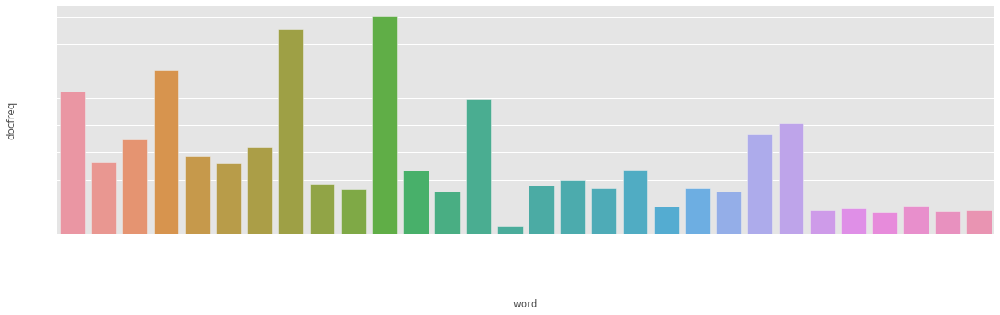

In [65]:
def docfreq_words(x, terms = 30):
  all_words = ' '.join([text for text in x])
  all_words = all_words.split()

  fdist = FreqDist(all_words)
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})
  
  d = words_df.nlargest(columns="count", n = terms)
  d['docfreq'] = [incidents.Description.str.contains(i).sum() for i in d['word']]
  plt.figure(figsize=(20,5))
  plt.rcParams['xtick.color'] = 'white'
  plt.rcParams['ytick.color'] = 'white'
  ax = sns.barplot(data=d, x= "word", y = "docfreq")
  ax.set(ylabel = 'docfreq')
  ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
  plt.show()


docfreq_words(list(incidents['Description']))

**Observation:**

The motive behind plotting the frequency of words is to check whether they add value to our prediction data. None of the words have a document frequency that qualify it to be omitted as a stop word from the dataset, so we will proceed further.

## Exploratory Data Analysis on pre-processed Data

In [66]:
incidents.rename(columns = {'lemma_str':'tokens'}, inplace = True)
incidents.drop(columns=['Description_Expanded','Description_Expanded_Str','langs','tokenized','lower','no_punc','stopwords_removed'],inplace=True)
incidents.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138,22
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132,19
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26,5
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11,2


In [67]:
df_inc = incidents['Assignment group'].value_counts().reset_index()
df_inc['percentage'] = (df_inc['Assignment group']/df_inc['Assignment group'].sum())*100
df_inc.head()

,index,Assignment group,percentage
0,GRP_0,3933,46.732414
1,GRP_8,645,7.663973
2,GRP_24,285,3.386407
3,GRP_12,257,3.053707
4,GRP_9,252,2.994297


##### Lets visualize the percentage of incidents per assignment group

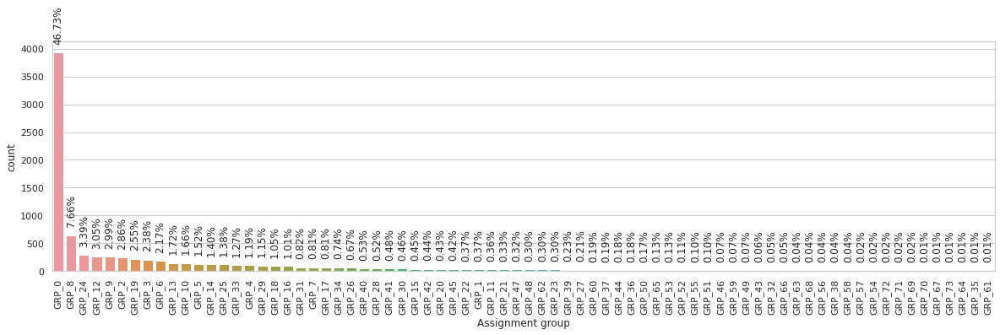

In [68]:
# Plot to visualize the percentage data distribution across different groups
sns.set(style="whitegrid")
plt.figure(figsize=(20,5))
ax = sns.countplot(x="Assignment group", data=incidents, order=incidents["Assignment group"].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
  ax.annotate(str(format(p.get_height()/len(incidents.index)*100, '.2f')+"%"), (p.get_x() + p.get_width() / 2., p.get_height()), \
              ha = 'center', va = 'bottom', rotation=90, xytext = (0, 10), textcoords = 'offset points')

**Observation:**

Around three quarters of groups don't even contribute 1% each to the data. This imbalance need to be resolved by detailed data analysis.

##### Lets view the top 20 Assignment groups with highest number of tickets

In [69]:
df_top_20 = incidents['Assignment group'].value_counts().nlargest(20).reset_index()
df_top_20

,index,Assignment group
0,GRP_0,3933
1,GRP_8,645
2,GRP_24,285
3,GRP_12,257
4,GRP_9,252
5,GRP_2,241
6,GRP_19,215
7,GRP_3,200
8,GRP_6,183
9,GRP_13,145


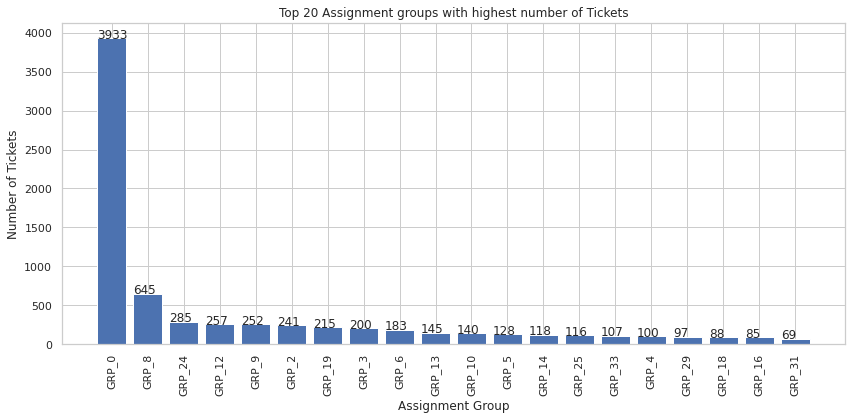

In [70]:
plt.figure(figsize=(12,6))
bars = plt.bar(df_top_20['index'],df_top_20['Assignment group'])
plt.title('Top 20 Assignment groups with highest number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

##### Lets view the bottom 20 Assignment groups with less number of tickets

In [71]:
df_bottom_20 = incidents['Assignment group'].value_counts().nsmallest(20).reset_index()
df_bottom_20

,index,Assignment group
0,GRP_70,1
1,GRP_67,1
2,GRP_73,1
3,GRP_64,1
4,GRP_35,1
5,GRP_61,1
6,GRP_57,2
7,GRP_54,2
8,GRP_72,2
9,GRP_71,2


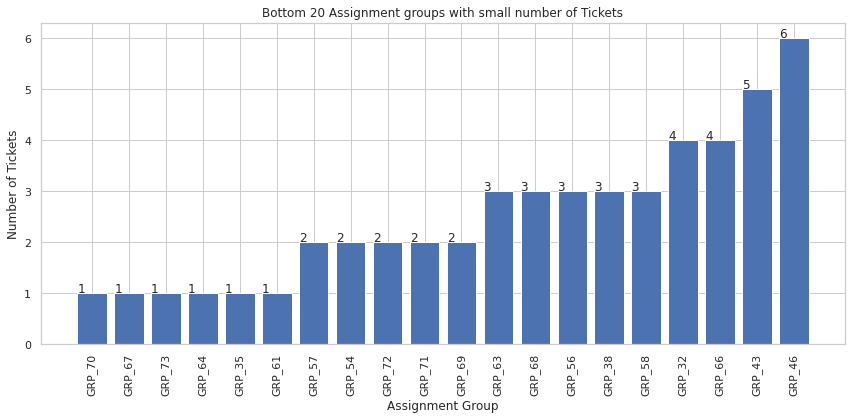

In [72]:
plt.figure(figsize=(12,6))
bars = plt.bar(df_bottom_20['index'],df_bottom_20['Assignment group'])
plt.title('Bottom 20 Assignment groups with small number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

##### Distribution of tickets based on ticket count

In [73]:
df_bins = pd.DataFrame(columns=['Description','Ticket Count'])
one_ticket = {'Description':'1 ticket','Ticket Count':len(df_inc[df_inc['Assignment group'] < 2])}
_2_5_ticket = {'Description':'2-5 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 1)& (df_inc['Assignment group'] < 6) ])}
_10_ticket = {'Description':' 6-10 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 5)& (df_inc['Assignment group'] < 11)])}
_10_20_ticket = {'Description':' 11-20 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 10)& (df_inc['Assignment group'] < 21)])}
_20_50_ticket = {'Description':' 21-50 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 20)& (df_inc['Assignment group'] < 51)])}
_51_100_ticket = {'Description':' 51-100 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 50)& (df_inc['Assignment group'] < 101)])}
_100_ticket = {'Description':' >100 ticket',
              'Ticket Count':len(df_inc[(df_inc['Assignment group'] > 100)])}
#append row to the dataframe
df_bins = df_bins.append([one_ticket,_2_5_ticket,_10_ticket,
                          _10_20_ticket,_20_50_ticket,_51_100_ticket,_100_ticket], ignore_index=True)

df_bins

,Description,Ticket Count
0,1 ticket,6
1,2-5 ticket,13
2,6-10 ticket,6
3,11-20 ticket,9
4,21-50 ticket,16
5,51-100 ticket,9
6,>100 ticket,15


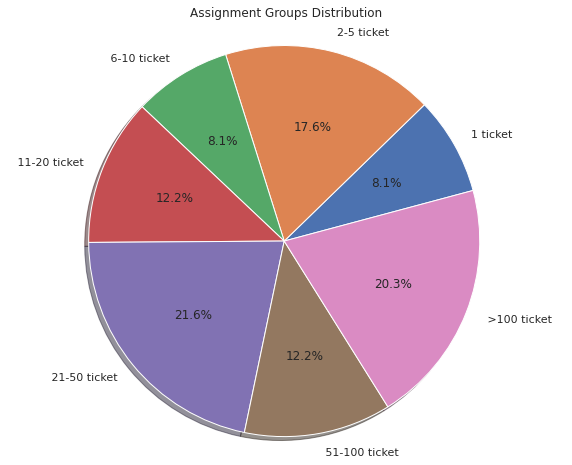

In [74]:
plt.figure(figsize=(10, 8))
plt.pie(df_bins['Ticket Count'],labels=df_bins['Description'],autopct='%1.1f%%', startangle=15, shadow = True);
plt.title('Assignment Groups Distribution')
plt.axis('equal');

**Observation:**
* There are 15 Assignment group’s which have more than 100 tickets.
* Around 20% of the Assignment groups have greater than 100 tickets.

##### Derive insights on ticket distribution by L1/L2 and L3 Queues

In [75]:
df_incidents_level = incidents.copy()
df_incidents_level['Target'] = np.where(df_incidents_level['Assignment group']=='GRP_0','L1/L2',np.where(df_incidents_level['Assignment group'] =='GRP_8','L1/L2','L3'))

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'samples')

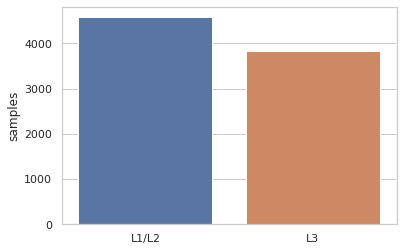

In [76]:
x=df_incidents_level.Target.value_counts()
sns.barplot(x.index,x)
plt.gca().set_ylabel('samples')

**Observation:**

Given majority records are L1/L2, we assume group 0 and 8 records as L1/L2 tickets and try to observe how they stack up with respect to L3 tickets. L1/L2 records make up more than half of the total data.

#### Characters in Short description by L1/L2 and L3

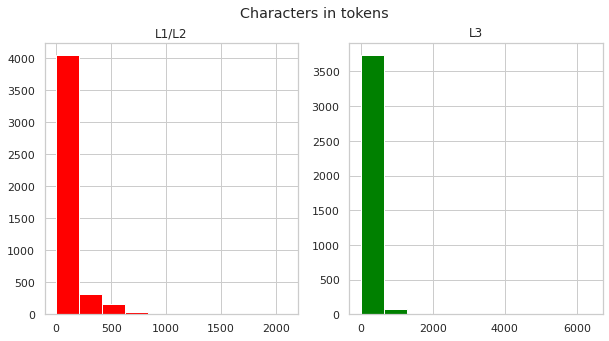

In [77]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
text_len=df_incidents_level[df_incidents_level['Target']=='L1/L2']['tokens'].str.len()
ax1.hist(text_len.dropna(),color='red')
ax1.set_title('L1/L2')
text_len=df_incidents_level[df_incidents_level['Target']=='L3']['tokens'].str.len()
ax2.hist(text_len.dropna(),color='green')
ax2.set_title('L3')
fig.suptitle('Characters in tokens')
plt.show()

#### Words in Short description by L1/L2 and L3

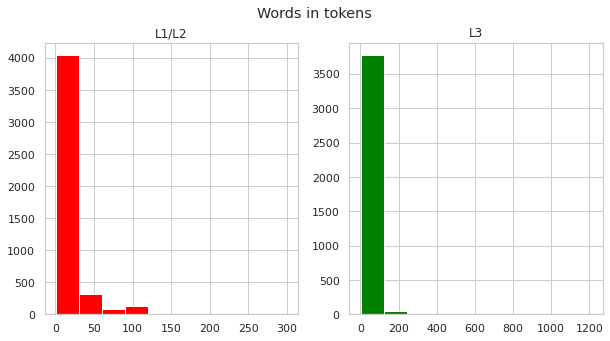

In [78]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
text_len=df_incidents_level[df_incidents_level['Target']=='L1/L2']['tokens'].str.split().map(lambda x: len(str(x).split(" ")))
ax1.hist(text_len.dropna(),color='red')
ax1.set_title('L1/L2')
text_len=df_incidents_level[df_incidents_level['Target']=='L3']['tokens'].str.split().map(lambda x: len(str(x).split(" ")))
ax2.hist(text_len.dropna(),color='green')
ax2.set_title('L3')
fig.suptitle('Words in tokens')
plt.show()

**Observation:**

From the above graphs, we observe how the character and word count stack up for records for different support levels.

##### Take a look at the average (mean) number of words in each ticket, and the longest and shortest description in our data set

In [79]:
incidents['desc_word_cnt'].mean()

19.758317490494296

In [80]:
print(incidents['desc_word_cnt'].max())
print(incidents['desc_word_cnt'].min())

1210
0


In [81]:
len(incidents[incidents['desc_word_cnt']==0])

4

**Average Word Count**

In [82]:
def avg_word(sentence):
  words = sentence.split()
  if len(words) > 0:
    avg_cnt = sum(len(word) for word in words)/len(words)
  else:
    avg_cnt = 0
  return (avg_cnt)

df_incidents = incidents.copy()
df_incidents['avg_word'] = df_incidents['tokens'].apply(lambda x: avg_word(str(x)))
df_incidents.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt,avg_word
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138,22,5.318182
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132,19,6.000000
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9,4.777778
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26,5,4.400000
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11,2,5.000000


##### Visualize a distribution of the description word counts to see how skewed our average might be by outliers. 

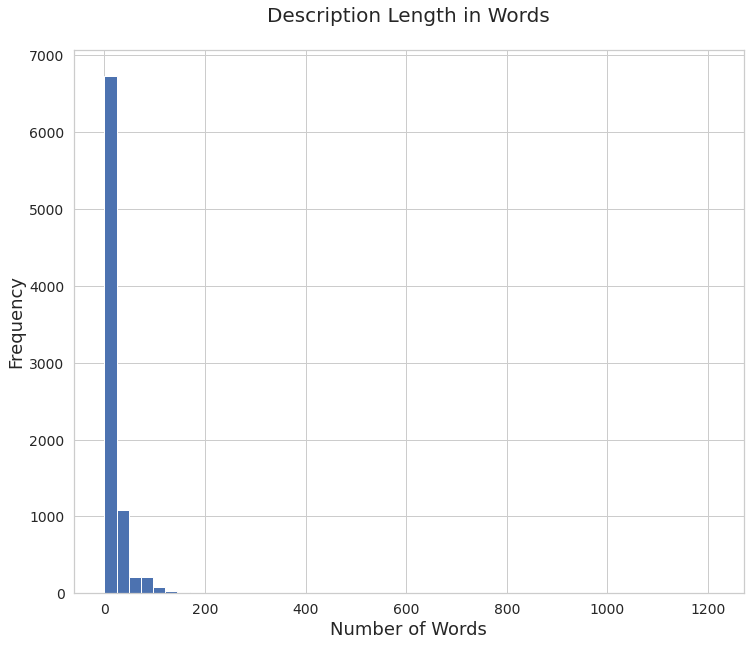

In [83]:
ax=df_incidents['desc_word_cnt'].plot(kind='hist', bins=50, fontsize=14, figsize=(12,10))
ax.set_title('Description Length in Words\n', fontsize=20)
ax.set_ylabel('Frequency', fontsize=18)
ax.set_xlabel('Number of Words', fontsize=18);

**Observation:**

Though most records have length in the lower range, there is significant amount of data with longer sentences.

#### Number of unique words in each article

In [84]:
df_incidents['uniq_wds'] = df_incidents['tokens'].str.split().apply(lambda x: len(set(x)))
df_incidents['uniq_wds'].head()

0    17
1    18
2     9
3     5
4     2
Name: uniq_wds, dtype: int64

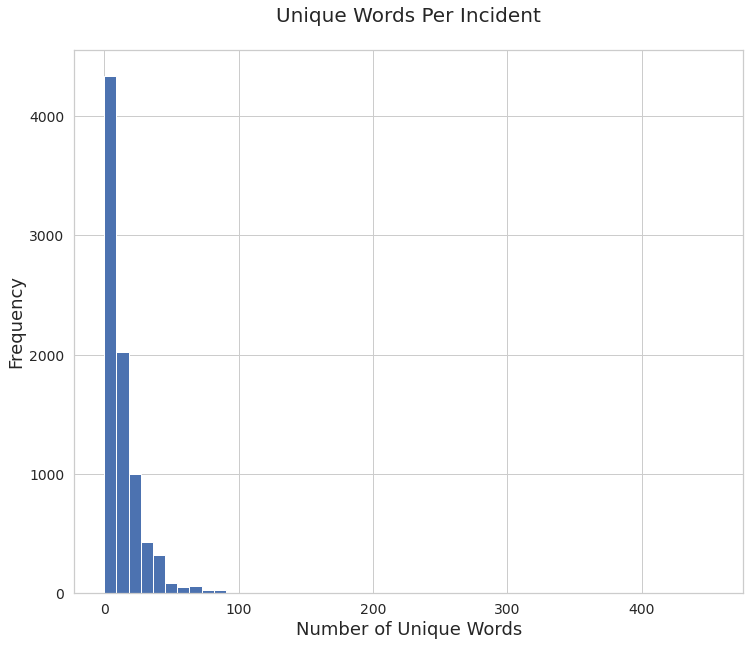

In [85]:
ax=df_incidents['uniq_wds'].plot(kind='hist', bins=50, fontsize=14, figsize=(12,10))
ax.set_title('Unique Words Per Incident\n', fontsize=20)
ax.set_ylabel('Frequency', fontsize=18)
ax.set_xlabel('Number of Unique Words', fontsize=18);

When we plot this into a chart, we can see that while the distribution of unique words is still skewed, it looks a bit similar to the distribution based on total word counts we generated earlier.

##### Mean Number of Words in tickets per Assignment Group

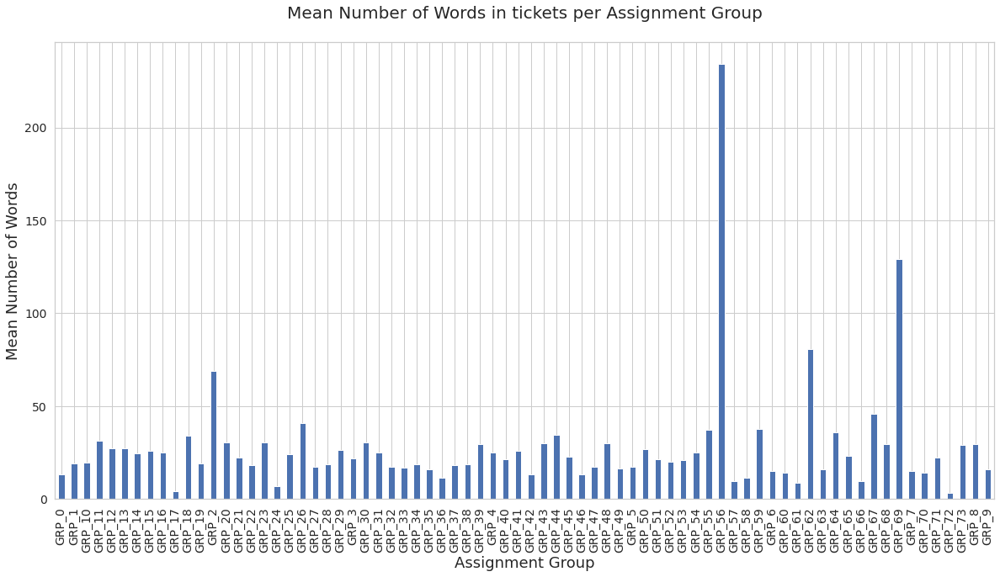

In [86]:
assign_grps = df_incidents.groupby('Assignment group')
ax=assign_grps['desc_word_cnt'].aggregate(np.mean).plot(kind='bar', fontsize=14, figsize=(20,10))
ax.set_title('Mean Number of Words in tickets per Assignment Group\n', fontsize=20)
ax.set_ylabel('Mean Number of Words', fontsize=18)
ax.set_xlabel('Assignment Group', fontsize=18);

##### Mean Number of Unique Words in tickets per Assignment Group

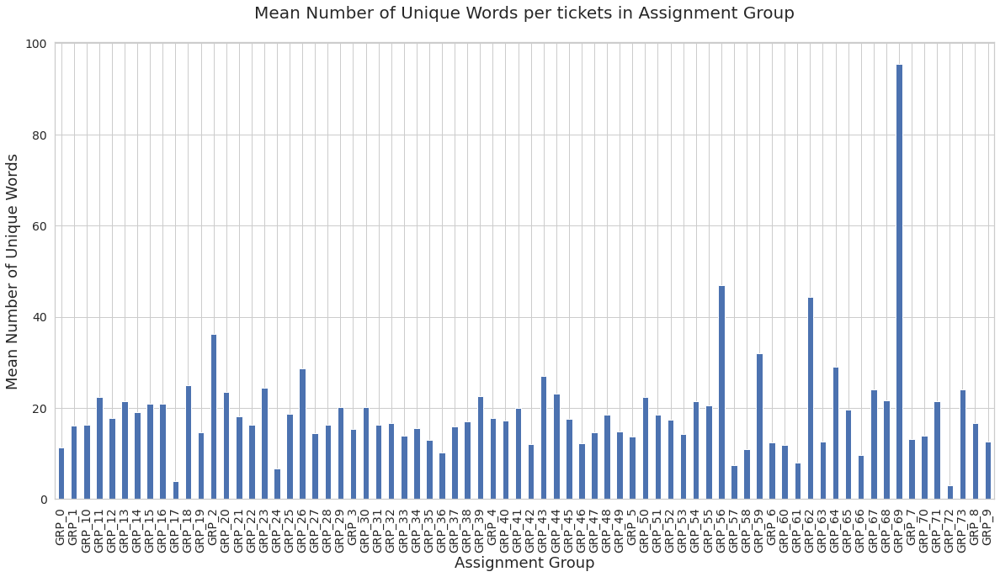

In [87]:
ax=assign_grps['uniq_wds'].aggregate(np.mean).plot(kind='bar', fontsize=14, figsize=(20,10))
ax.set_title('Mean Number of Unique Words per tickets in Assignment Group\n', fontsize=20)
ax.set_ylabel('Mean Number of Unique Words', fontsize=18)
ax.set_xlabel('Assignment Group', fontsize=18);

##### The most common words over the entire corpus.



In [88]:
wd_counts = Counter()
for i, row in df_incidents.iterrows():
    wd_counts.update(row['tokens'].split())
    
wd_counts.most_common(20)

[('com', 3641),
 ('job', 2523),
 ('receive', 2485),
 ('company', 2406),
 ('gmail', 2147),
 ('please', 2104),
 ('tool', 2050),
 ('yes', 2026),
 ('na', 1939),
 ('password', 1440),
 ('user', 1385),
 ('erp', 1208),
 ('sid', 1099),
 ('access', 1032),
 ('monitor', 1028),
 ('ticket', 1000),
 ('issue', 965),
 ('scheduler', 949),
 ('fail', 935),
 ('reset', 907)]

##### WordCloud

A word cloud is a collection, or cluster, of words depicted in different sizes. The bigger and bolder the word appears, the more often it’s mentioned within a given text and the more important it is.

Also known as tag clouds or text clouds, these are ideal ways to pull out the most pertinent parts of textual data, often also help business users compare and contrast two different pieces of text to find the wording similarities between the two.

Let's write a generic method to generate Word Clouds for both Description column.

In [89]:
def f_word_cloud(column):
    
    comment_words = ' '
    stopwords = set(STOPWORDS)

    # iterate through the csv file 
    for val in column: 

        # typecaste each val to string 
        val = str(val) 

        # split the value 
        tokens = val.split() 

        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 

        for words in tokens: 
            comment_words = comment_words + words + ' '


    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(comment_words) 
    
    return wordcloud

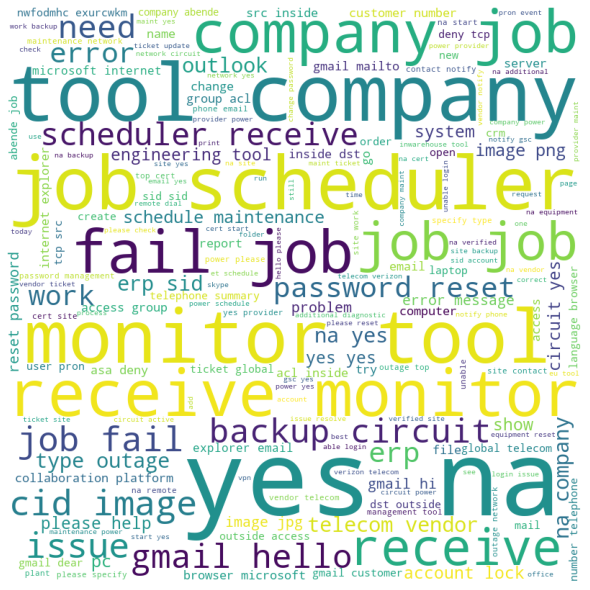

In [90]:
wordcloud = f_word_cloud(incidents.tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

Word Cloud for tickets with Assignment group 'GRP_0'

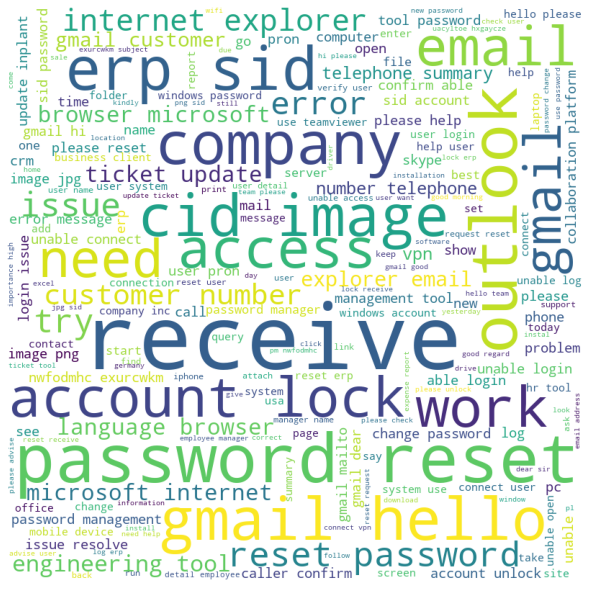

In [91]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_0'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** 
* Analysis on GRP_0 which is the most frequent group to assign a ticket to reveals that this group deals with mostly the maintenance problems such as password reset, account lock, login issue, connectivity issue, ticket update etc.
* Maximum of the tickets from GRP_0 can be reduced by self correcting itself by putting automation scripts/mechanisms to help resolve these common maintenance issues. This will help in lowering the inflow of service tickets thereby saving the person/hour efforts spend and increasing the business revenue.

The word 'password' seems to be prominent for group 0 data, let us try a hypothesis testing procedure to conclude better.

In [92]:
inc_hypo = incidents.copy()
inc_hypo['count_password']=inc_hypo.tokens.str.count("password")

In [93]:
inc_hypo = inc_hypo[['Assignment group','count_password', 'desc_word_cnt']]
inc_hypo=inc_hypo.rename(columns={"Assignment group":"Assign_group"})
inc_hypo.head()

,Assign_group,count_password,desc_word_cnt
0,GRP_0,1,22
1,GRP_0,0,19
2,GRP_0,0,9
3,GRP_0,0,5
4,GRP_0,0,2


In [94]:
inc_hypo.groupby(by=['Assign_group']).mean().sort_values(by='count_password',ascending=False)['count_password']

Assign_group
GRP_17    0.514706
GRP_53    0.454545
GRP_38    0.333333
GRP_0     0.333079
GRP_7     0.323529
            ...   
GRP_5     0.000000
GRP_26    0.000000
GRP_51    0.000000
GRP_52    0.000000
GRP_9     0.000000
Name: count_password, Length: 74, dtype: float64

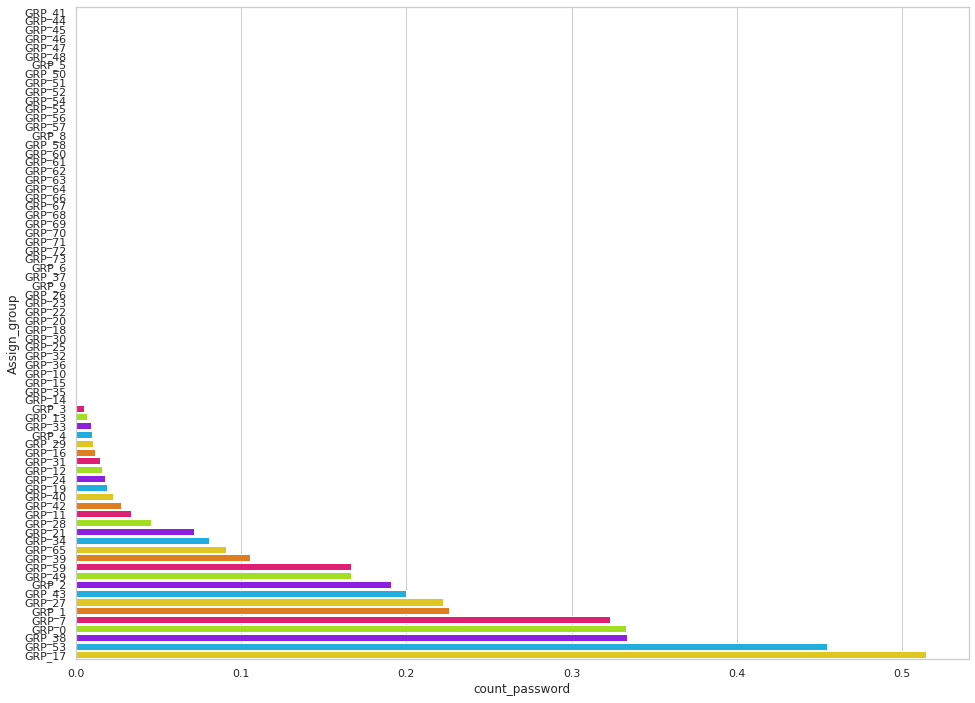

In [95]:
rcParams['figure.figsize']=16,12
chart = sns.barplot(x = inc_hypo.groupby(by=['Assign_group']).mean().sort_values(by='count_password')['count_password'], 
                    y = inc_hypo.groupby(by=['Assign_group']).mean().sort_values(by='count_password').index, palette=HAPPY_COLORS_PALETTE)

### Step 1: State the null and alternative hypothesis:

* $H_0$: The word 'password' is equally probable to be present in tickets to all groups
* $H_A$: At least one group has close relevance to password related tickets


### Step 2: Decide the significance level

Here we select α = 0.05

### Step 3: Identify the test statistic

There are 38 groups as part of our analysis. Analysis of variance can determine the characteristic of the group (relevance with password related tickets). ANOVA uses F-tests to statistically test the equality of means.

### Step 4: Calculate p value using ANOVA table

* statsmodels.formula.api.ols creates a model from a formula and dataframe
* statsmodels.api.sm.stats.anova_lm gives an Anova table for one or more fitted linear models

In [96]:
mod = ols('count_password ~ Assign_group', data = inc_hypo).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                   sum_sq      df         F        PR(>F)
Assign_group   221.105428    73.0  8.347539  5.086695e-82
Residual      3026.831835  8342.0       NaN           NaN


### Step 5:  Decide to reject or accept null hypothesis

In this example, p value is very close to 0 and it is less than our chosen level of signifance at 5%
So the statistical decision is to reject the null hypothesis at 5% level of significance.

### So there is sufficient evidence that the password related tickets are more specific to particular group.

### Determine which mean(s) is / are different

* An ANOVA test will test that at least one mean is different. 
* You have rejected the null hypothesis but do not know which mean(s) is / are different.
We use Tukey-krammer HSD test to detect which mean(s) is / are different.

In [97]:
print(pairwise_tukeyhsd(inc_hypo['count_password'], inc_hypo['Assign_group']))

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
 GRP_0  GRP_1  -0.1073    0.9 -0.5604  0.3459  False
 GRP_0 GRP_10  -0.3331  0.001 -0.5492 -0.1169   True
 GRP_0 GRP_11  -0.2997    0.9 -0.7603  0.1608  False
 GRP_0 GRP_12  -0.3175  0.001 -0.4793 -0.1557   True
 GRP_0 GRP_13  -0.3262  0.001 -0.5387 -0.1137   True
 GRP_0 GRP_14  -0.3331  0.001 -0.5679 -0.0983   True
 GRP_0 GRP_15  -0.3331 0.4738 -0.7427  0.0766  False
 GRP_0 GRP_16  -0.3213 0.0026 -0.5968 -0.0458   True
 GRP_0 GRP_17   0.1816    0.9 -0.1257   0.489  False
 GRP_0 GRP_18  -0.3331  0.001  -0.604 -0.0622   True
 GRP_0 GRP_19  -0.3145  0.001 -0.4905 -0.1385   True
 GRP_0  GRP_2  -0.1422 0.3284  -0.309  0.0246  False
 GRP_0 GRP_20  -0.3331 0.5397 -0.7538  0.0877  False
 GRP_0 GRP_21  -0.2617    0.9 -0.7383   0.215  False
 GRP_0 GRP_22  -0.3331 0.7117 -0.7862  0.1201  False
 GRP_0 GRP_23  -0.3331    0.9 -0.8373  0.1711 

Word Cloud for tickets with Assignment group 'GRP_8'

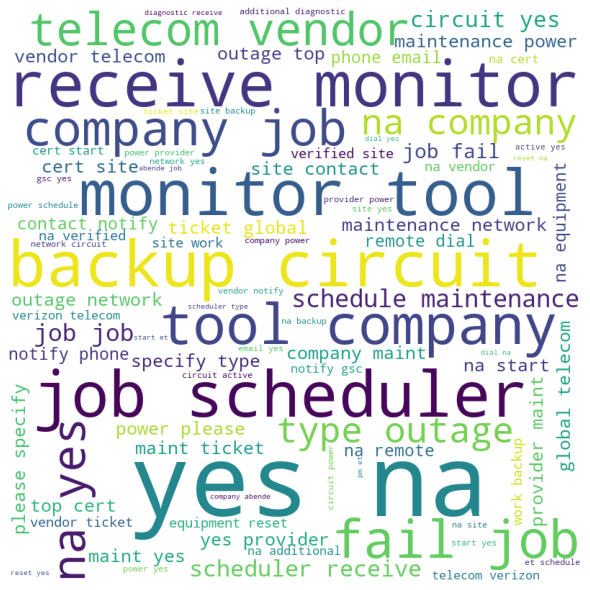

In [98]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_8'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** GRP_8 seems to have tickets related to outage, job failures, monitoring tool etc

Word Cloud for tickets with Assignment group 'GRP_12'

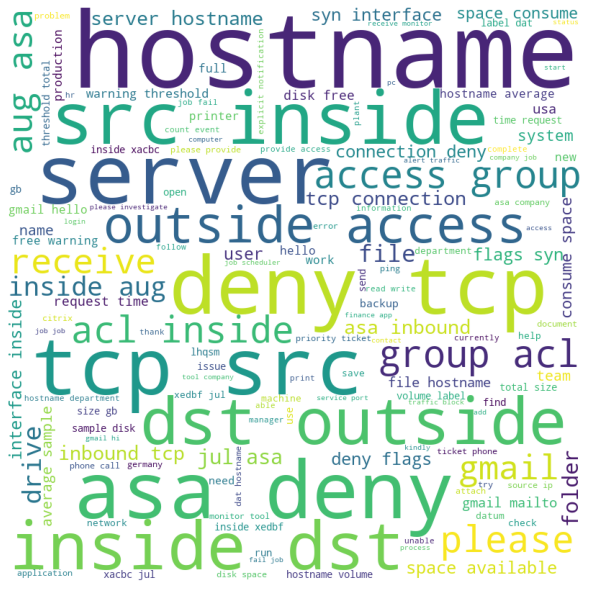

In [99]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_12'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** GRP_12 contains tickets related to systems like disk space issues, network issues like tie out, citrix issue, connectivity timeout etc.

Word Cloud for tickets with Assignment group 'GRP_24'

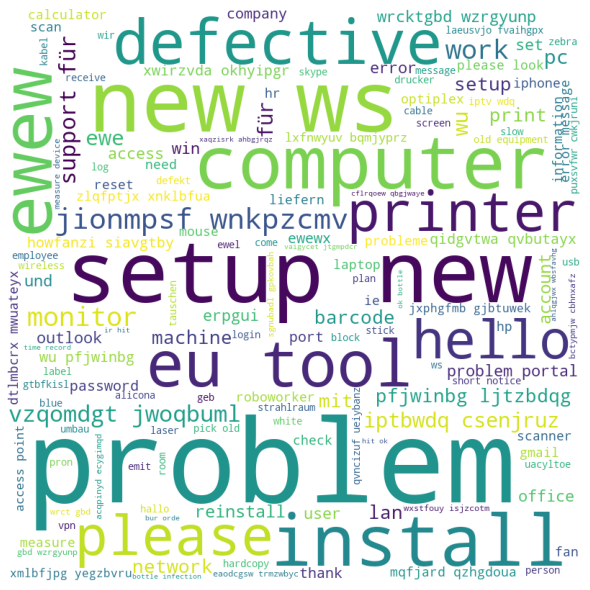

In [100]:
wordcloud = f_word_cloud(incidents[incidents['Assignment group']=='GRP_24'].tokens)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

**Observation:** GRP_24 - Tickets are mainly in german, these tickets were translated to english before passing it to our model.

#### Measure Readability of a ticket
The readability of a document says about the level of ease of understanding and interpretation .The readability of a text document can be checked using various readability indices like Flesch Reading Ease, Dale Chall Readability Score, and Gunning Fog Index.

For this, we can use the **textstat** library in Python. Textstat is typically used for determining readability, complexity, and grade level of a particular corpus. Each of these indices works on a different methodology for determining the readability level of a document.

In [101]:
df_incidents['dale_chall_score']=df_incidents['tokens'].apply(lambda x: textstat.dale_chall_readability_score(x))
df_incidents['flesh_reading_ease']=df_incidents['tokens'].apply(lambda x: textstat.flesch_reading_ease(x))
df_incidents['gunning_fog']=df_incidents['tokens'].apply(lambda x: textstat.gunning_fog(x))

print('Dale Chall Score     =>',df_incidents['dale_chall_score'].mean())
print('Flesch Reading Score =>',df_incidents['flesh_reading_ease'].mean())
print('Gunning Fog Index    =>',df_incidents['gunning_fog'].mean())

Dale Chall Score     => 10.299264496197559
Flesch Reading Score => 43.6925499049427
Gunning Fog Index    => 11.84224928707218


**Observation:**
There is very little difference in the Dale Chall Score and the Gunning Fog Index. But there is a considerable amount of variation in the Flesch Reading Score.

Still, we cannot tell the difference in the readability of the two. The textstat library has a solution for this as well. It provides the text_standard() function. that uses various readability checking formulas, combines the result and returns the grade of education required to understand a particular document completel

In [102]:
df_incidents['text_standard']=df_incidents['tokens'].apply(lambda x: textstat.text_standard(x))
print('Text Standard of Tickets =>',df_incidents['text_standard'].mode())

Text Standard of Tickets => 0    7th and 8th grade
dtype: object


**Observation:** 
The tickets are easily understandable by anyone who has completed the 9th or 10th grade in school.

Let’s take a look at the reading time of tickets. An average adult reads about 250 words per minute. We can also calculate the reading time of a document using the textstat library. It provides the reading_time() function, which takes a piece of text as an argument and returns the reading time for it in seconds.

In [103]:
df_incidents['reading_time']=df_incidents['tokens'].apply(lambda x: textstat.reading_time(x))
print('Reading Time of =>',df_incidents['reading_time'].mean())

Reading Time of => 1.5978029942965708


**Observation:** On looking at the reading time, people usually find longer descriptions helpful (around 400-500 words).

#### Pickling the data post language translation for reuse, further preprocessing to be performed

In [104]:
with open('incidents_trans.pickle', 'wb') as output:
    pickle.dump(incidents, output)

In [105]:
with open('incidents_trans.pickle', 'rb') as data:
    incidents = pickle.load(data)

## Topic Modeling
We need to convert our text into numbers or vectors. So following methods are used

### Count Vectorizer
The CountVectorizer method of vectorizing tokens transposes all the words/tokens into features and then provides a count of occurrence of each word. The result is called a document term matrix

In [106]:
tf_vectorizer = CountVectorizer(max_df=0.9, min_df=25, max_features=5000)
tf = tf_vectorizer.fit_transform(incidents['tokens'].values.astype('U'))
tf_feature_names = tf_vectorizer.get_feature_names()
doc_term_matrix = pd.DataFrame(tf.toarray(), columns=list(tf_feature_names))
doc_term_matrix

,abende,able,accept,access,account,action,activate,activation,active,activity,ad,add,additional,address,admin,administrator,advise,aerp,affect,agent,alert,allow,already,also,alternate,always,amar,analysis,another,anymore,anything,ap,apac,app,appear,application,approval,approve,area,asa,...,vip,visitor,volume,vpn,want,warehouse,warm,warning,way,web,website,wednesday,week,welcome,well,wifi,win,window,windows,wireless,within,without,word,work,workflow,working,would,write,wrong,ws,www,yes,yesterday,yet,µè,ºæ,å¼,æ³,æœ,çš
0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8411,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8412,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8413,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8414,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### LDA Topic Modelling
Now that we have prepared our data for topic modeling, we’ll be using the Latent Dirichlet Allocation (LDA) approach to determine the topics present in our corpus. In our model, we are going to produce 10 individual topics (ie. n_components). Once the model is created let’s create a function to display the identified topics. Each topic will consist of 10 words. The function will have three required parameters; the LDA model, feature names from the document term matrix, and the number of words per topic.

In [107]:
lda_model = LatentDirichletAllocation(n_components=10, learning_method='online', max_iter=500, random_state=0).fit(tf)
no_top_words = 10
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic %d:" % (topic_idx))
        print(" ".join([feature_names[i]
                          for i in topic.argsort()[:-no_top_words - 1:-1]]))
              
display_topics(lda_model, tf_feature_names, no_top_words)

Topic 0:
erp pron sid would user problem printer system usa call
Topic 1:
please send need order pc plant create subject pm help
Topic 2:
password user reset login unable outlook issue account request windows
Topic 3:
work agent laptop available alert uacyltoe germany hxgaycze total disk
Topic 4:
job tool company monitor com receive scheduler fail abende sid
Topic 5:
com image cid receive gmail company png jpg hello sid
Topic 6:
ticket hostname event account lock device tcp update ip asa
Topic 7:
error tool get try issue please change message unable report
Topic 8:
com gmail receive please email company hello name microsoft skype
Topic 9:
yes na site power circuit backup vendor telecom network company


Topics produced via LDA are - 
* Topic 0 - Printer 
* Topic 1 - Job Scheduler
* Topic 2 - Power Outage 
* Topic 3 - Login Issues
* Topic 4 - Collaboration
* Topic 5 - Gmail
* Topic 6 - Password Reset
* Topic 7 - Outlook
* Topic 8 - ?
* Topic 9 - ?


In [110]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(lda_model, tf, tf_vectorizer, mds='tsne')
panel

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
7       60.302765  109.516022       1        1  14.329039
8     -124.005386   59.197720       2        1  12.960893
1      -18.189613   34.313122       3        1  12.562980
9      -73.561409 -125.567406       4        1  12.193224
0       30.829712 -145.228943       5        1  12.144821
4      -44.087914  129.178131       6        1   8.790021
6       88.538315   17.956705       7        1   8.721129
2     -101.800240  -34.008518       8        1   7.594717
5      110.746559  -75.248215       9        1   5.497132
3        4.928925  -50.364487      10        1   5.206045, topic_info=            Term         Freq        Total Category  logprob  loglift
319          job  2456.000000  2456.000000  Default  30.0000  30.0000
95           com  3605.000000  3605.000000  Default  29.0000  29.0000
702          yes  2086.000000  2086.000000  Default  28.0000  28.0000
390           na  1996.000000  1996.000000  Default  27.0000  27.0000
257        gmail  2135.000000  2135.000000  Default  26.0000  26.0000
..           ...          ...          ...      ...      ...      ...
209           eu    65.064930   143.366055  Topic10  -4.5687   2.1653
394         need    93.078823   674.652766  Topic10  -4.2106   0.9746
23          also    68.312660   232.247169  Topic10  -4.5200   1.7316
300  information    70.114386   292.681760  Topic10  -4.4940   1.5264
635         time    68.050671   423.605985  Topic10  -4.5238   1.1268

[493 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
0         6  0.995945  abende
1         1  0.475487    able
1         2  0.031876    able
1         5  0.108910    able
1         8  0.382515    able
...     ...       ...     ...
701       9  0.981876     www
702       4  0.989778     yes
702       7  0.010066     yes
708      10  0.983162      æ³
709      10  0.983698      æœ

[611 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 9, 2, 10, 1, 5, 7, 3, 6, 4])

### NMF using TF-IDF 
LDA isn’t the only approach to topic modeling. Let’s try another method named the Non-Negative Matrix Factorization (NMF) approach and see if our topics can be slightly more defined. Instead of using the simple CountVectorizer method to vectorize our words/tokens, we’ll use the TF-IDF (Term Frequency — Inverse Document Frequency) method. The TF-IDF method helps to bring down the weight/impact of high-frequency words.

In [108]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.90, min_df =25, max_features=5000, use_idf=True)
tfidf1 = tfidf_vectorizer.fit_transform(incidents['tokens'])
tfidf_feature_names = tfidf_vectorizer.get_feature_names()
doc_term_matrix_tfidf = pd.DataFrame(tfidf1.toarray(), columns=list(tfidf_feature_names))
doc_term_matrix_tfidf

,abende,able,accept,access,account,action,activate,activation,active,activity,ad,add,additional,address,admin,administrator,advise,aerp,affect,agent,alert,allow,already,also,alternate,always,amar,analysis,another,anymore,anything,ap,apac,app,appear,application,approval,approve,area,asa,...,vip,visitor,volume,vpn,want,warehouse,warm,warning,way,web,website,wednesday,week,welcome,well,wifi,win,window,windows,wireless,within,without,word,work,workflow,working,would,write,wrong,ws,www,yes,yesterday,yet,µè,ºæ,å¼,æ³,æœ,çš
0,0.0,0.172409,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.219104,0.0,0.0,0.0,0.0,0.0,0.210871,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.245484,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.274328,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.474731,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.000000,0.0,0.379990,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8411,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.432062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8412,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8413,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.706034,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.501136,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8414,0.0,0.000000,0.0,0.333936,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0

In [109]:
len(tfidf1.todense())

8416

In [110]:
nmf = NMF(n_components=10, random_state=0, alpha=.1, init='nndsvd').fit(tfidf1)
display_topics(nmf, tfidf_feature_names, no_top_words)

Topic 0:
job scheduler monitor fail tool company receive com abende sid
Topic 1:
password reset windows management request change passwrod tool manager please
Topic 2:
gmail com receive please image cid hello png help mailto
Topic 3:
account lock windows unlock ad get please window expire unlocked
Topic 4:
yes na circuit power site telecom backup vendor outage cert
Topic 5:
unable outlook login connect skype open vpn launch log engineering
Topic 6:
ticket update inplant inc driver printer query call information need
Topic 7:
erp sid unlock log reset production system account hana logon
Topic 8:
internet email explorer browser summary number telephone microsoft customer language
Topic 9:
user issue login error pron please would system work access


Topics produced via NMF are - 
* Topic 0 - Scheduler 
* Topic 1 - Password Reset
* Topic 2 - Gmail
* Topic 3 - Account Lock
* Topic 4 - Printer
* Topic 5 - Power Outage
* Topic 6 - Login Issue
* Topic 7 - User account
* Topic 8 - Browser
* Topic 9 - Outlook

The topics produced via NMF seem to be much more distinct compared to LDA.

Let’s add both the LDA and NMF topics into our dataframe for further analysis. Let’s also remap the integer topics into our subjectively derived topic labels.

In [111]:
nmf_topic_values = nmf.transform(tfidf1)
df_incidents_level['nmf_topics'] = nmf_topic_values.argmax(axis=1)
lda_topic_values = lda_model.transform(tf)
df_incidents_level['lda_topics'] = lda_topic_values.argmax(axis=1)
lda_remap = {0: 'Printer', 1: 'Job Scheduler', 2: 'Power Outage', 3: 'Login Issues', 
             4: 'Collaboration', 5: 'Gmail', 6: 'Passowrd Reset', 
             7: 'Outlook', 8: 'Unknown1', 9: 'Unknown2'}
df_incidents_level['lda_topics'] = df_incidents_level['lda_topics'].map(lda_remap)
nmf_remap = {0: 'Scheduler', 1: 'Password Reset', 2: 'Gmail', 3: 'Account Lock', 
             4: 'Printer', 5: 'Power Outage', 6: 'Login Issue', 7: 'User Account', 
             8: 'Browser', 9: 'Outlook'}
df_incidents_level['nmf_topics'] = df_incidents_level['nmf_topics'].map(nmf_remap)

##### Plot the top most reasons for raising a ticket

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([   0.,  500., 1000., 1500., 2000., 2500., 3000.]),
 <a list of 7 Text major ticklabel objects>)

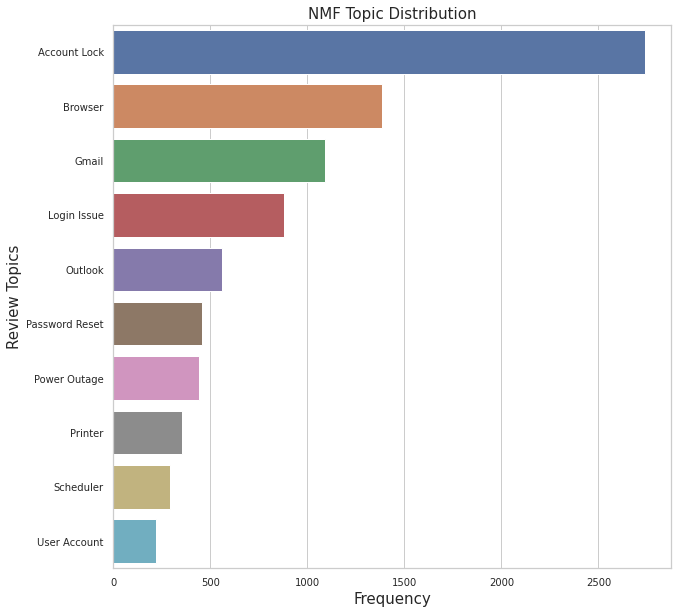

In [112]:
nmf_x = df_incidents_level['nmf_topics'].value_counts()
nmf_y = nmf_x.sort_index()
plt.figure(figsize=(10,10))
sns.barplot(nmf_x, nmf_y.index)
plt.title("NMF Topic Distribution", fontsize=15)
plt.ylabel('Review Topics', fontsize=15)
plt.yticks(fontsize=10)
plt.xlabel('Frequency', fontsize=15)
plt.xticks(fontsize=10)

#### Try and see if the data could be clustered

**N-Grams**
N-gram is a contiguous sequence of N items from a given sample of text or speech, in the fields of computational linguistics and probability. The items can be phonemes, syllables, letters, words or base pairs according to the application. N-grams are used to describe the number of words used as observation points, e.g., unigram means singly-worded, bigram means 2-worded phrase, and trigram means 3-worded phrase.

We'll be using scikit-learn’s CountVectorizer function to derive n-grams and compare them before and after removing stop words. Stop words are a set of commonly used words in any language. We'll be using english corpus stopwords and extend it to include some business specific common words considered to be stop words in our case.

But before that let's merge the Short descrition and Description column texts and write a generic method to derive the n-grams.

In [113]:
def create_bag_of_words(X):
    vectorizer = CountVectorizer(analyzer = "word", tokenizer = None, preprocessor = None, stop_words = 'english', ngram_range = (1,3), max_features = 10000) 
    train_data_features = vectorizer.fit_transform(X)
    train_data_features = train_data_features.toarray()
    
    # tfidf transform
    tfidf = TfidfTransformer()
    tfidf_features = tfidf.fit_transform(train_data_features).toarray()

    # Get words in the vocabulary
    vocab = vectorizer.get_feature_names()
      
    return vectorizer, vocab, train_data_features, tfidf_features, tfidf

In [114]:
# word level tf-idf for ticket
vectorizer, vocab, train_data_features, tfidf_features, tfidf  =  create_bag_of_words(incidents['Description'])

In [115]:
#  create a dictionary mapping the tokens to their tfidf values
bag_dictionary = pd.DataFrame()
bag_dictionary['ngram'] = vocab
bag_dictionary['count'] = train_data_features[0]
bag_dictionary['tfidf_features'] = tfidf_features[0]

# Sort by raw count
bag_dictionary.sort_values(by=['count'], ascending=False, inplace=True)
# Show top 10
print(bag_dictionary.head(10))

                     ngram  count  tfidf_features
9152                  user      3        0.232638
5272                 login      2        0.178570
1058          checked user      1        0.146257
1059       checked user ad      1        0.147777
5442               manager      1        0.098165
5443       manager checked      1        0.148579
5444  manager checked user      1        0.148579
5292           login issue      1        0.123831
5293  login issue resolved      1        0.128224
5273           login check      1        0.145534


In [116]:
sorted_by_idf = np.argsort(tfidf.idf_)
feature_names = np.array(vectorizer.get_feature_names())
print("Features with lowest idf:\n{}".format(feature_names[sorted_by_idf[:10]]))
print("\nFeatures with highest idf:\n{}".format(feature_names[sorted_by_idf[-10:]]))

Features with lowest idf:
['com' 'received' 'company' 'tool' 'gmail' 'gmail com' 'company com' 'job'
 'monitoring' 'monitoring tool']

Features with highest idf:
['platform company fy' 'plugins' 'plugins inboundio'
 'plugins inboundio markhtyeting' 'pm mhfjudahdyue'
 'pm mhfjudahdyue rfgrhtdy' 'dotnet' 'png ead' 'efjzbtcm mdpviqbf'
 'efdl users']


Below is the 10 tokens with the lowest tfidf score, which is unsurprisingly, very generic words that we could not use to distinguish one description from another.

In [117]:
bag_dictionary.sort_values(by=['count'], ascending=True).head(10)

,ngram,count,tfidf_features
8322,start,0,0.0
33,aborted media,0,0.0
34,aborted media agents,0,0.0
35,aborting,0,0.0
36,absender,0,0.0
37,absender und,0,0.0
38,absender und làschen,0,0.0
39,absender und lã,0,0.0
22,able login ess,0,0.0
20,able log,0,0.0


Below is the 10 tokens with the highest tfidf score, which includes words that are a lot specific that by looking at them, we could guess the categories that they belong to:

In [118]:
bag_dictionary.sort_values(by=['count'], ascending=False).head(10)

,ngram,count,tfidf_features
9152,user,3,0.232638
5272,login,2,0.178570
176,ad reset,1,0.166450
2121,details employee manager,1,0.138324
2120,details employee,1,0.138324
1046,check caller,1,0.145534
2117,details,1,0.108292
7540,resolved,1,0.114285
1556,confirmed able,1,0.124919
9167,user details employee,1,0.138324


### TF-IDF Distribution

In [119]:
# word level tf-idf for ticket
tfidf3 = TfidfVectorizer(max_features=250, analyzer = 'word', min_df=2, max_df=0.95, ngram_range=(1, 2))
inc_tfidf = tfidf3.fit_transform(incidents['tokens'])

In [120]:
#  create a dictionary mapping the tokens to their tfidf values
tfidf4 = dict(zip(tfidf3.get_feature_names(), tfidf3.idf_))
tfidf4 = pd.DataFrame(columns=['tfidf']).from_dict(
                    dict(tfidf4), orient='index')
tfidf4.columns = ['tfidf']

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


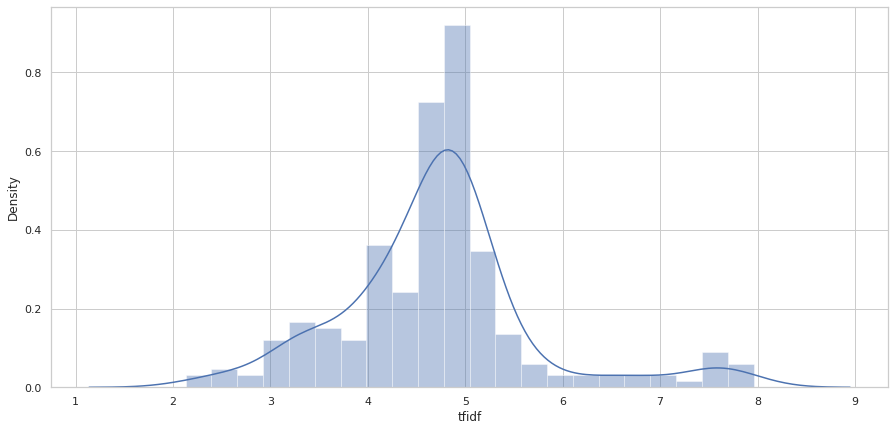

In [121]:
plt.figure(figsize=(15,7))
sns.distplot(tfidf4['tfidf'])

Given the high dimension of our tfidf matrix, we need to reduce their dimension using the Singular Value Decomposition (SVD) technique. And to visualize our vocabulary, we could next use t-SNE to reduce the dimension to 2. t-SNE is more suitable for dimensionality reduction to 2 or 3.

### Dimensionality Reduction using t-SNE

In [122]:
n_comp=10
svd = TruncatedSVD(n_components=n_comp, random_state=42)
svd_tfidf = svd.fit_transform(tfidf1)

In [123]:
tsne_model = TSNE(n_components=2, verbose=1, random_state=42, n_iter=500)
tsne_tfidf = tsne_model.fit_transform(svd_tfidf)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8416 samples in 0.013s...
[t-SNE] Computed neighbors for 8416 samples in 0.664s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8416
[t-SNE] Computed conditional probabilities for sample 2000 / 8416
[t-SNE] Computed conditional probabilities for sample 3000 / 8416
[t-SNE] Computed conditional probabilities for sample 4000 / 8416
[t-SNE] Computed conditional probabilities for sample 5000 / 8416
[t-SNE] Computed conditional probabilities for sample 6000 / 8416
[t-SNE] Computed conditional probabilities for sample 7000 / 8416
[t-SNE] Computed conditional probabilities for sample 8000 / 8416
[t-SNE] Computed conditional probabilities for sample 8416 / 8416
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.821159
[t-SNE] KL divergence after 500 iterations: 1.083248


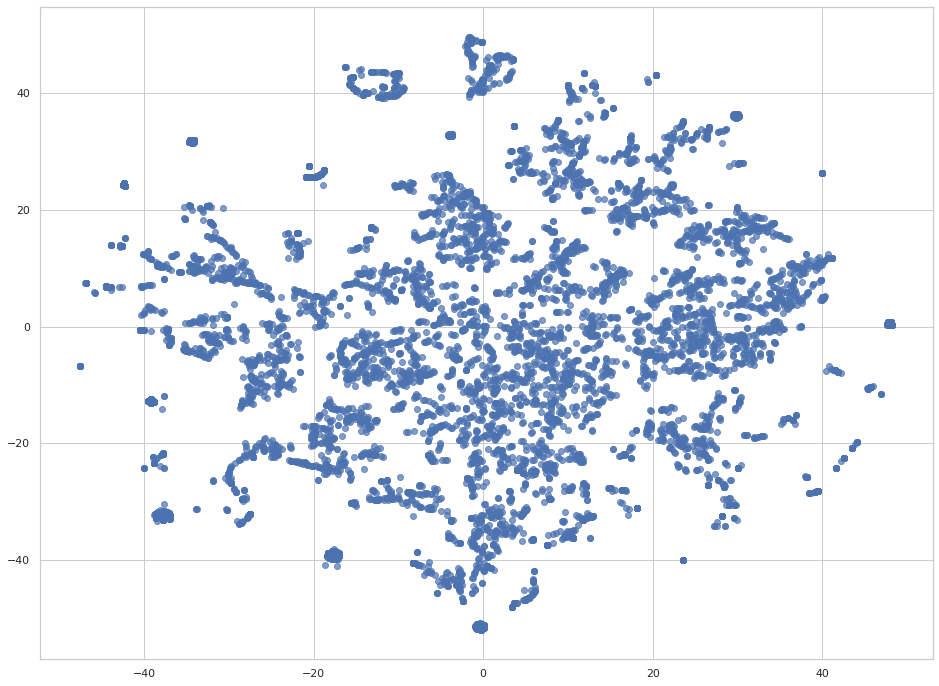

In [124]:
tfidf_df = pd.DataFrame(tsne_tfidf, columns=['x', 'y'])
plt.scatter(tfidf_df.x, tfidf_df.y, alpha=0.7)

**Observation:**
We can see there are multiple smaller clusters here, each cluster could be the type of tickets that we have in the dataset.

## Agglomerative Clustering


In [125]:
incidents['Group id'] = incidents['Assignment group'].factorize()[0]
incidents.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt,Group id
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138,22,0
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132,19,0
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9,0
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26,5,0
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11,2,0


In [126]:
group_id_df = incidents[['Assignment group', 'Group id']].drop_duplicates().sort_values('Group id')

In [127]:
group_to_id = dict(group_id_df.values)
id_to_group = dict(group_id_df[['Group id', 'Assignment group']].values)

### Get Embeddings from Glove

In [128]:
EMBEDDING_FILE = './glove.6B.300d.txt'

embeddings = {}
for o in open(EMBEDDING_FILE):
    word = o.split(" ")[0]
    embd = o.split(" ")[1:]
    embd = np.asarray(embd, dtype='float32')
    embeddings[word] = embd

In [129]:
def get_sentence_embedding(tokens, vector):
  if len(tokens)<1:
    return np.zeros(300)
  sentvec = [vector[word] if word in vector else np.zeros(300) for word in tokens]
  length = len(sentvec)
  sum = np.sum(sentvec, axis=0)
  avg = np.divide(sum,length)
  return(avg)

In [130]:
incidents['embedding'] = incidents['tokens'].apply(lambda x: get_sentence_embedding(x, embeddings))

In [131]:
incidents.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt,Group id,embedding
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138,22,0,"[-0.24095591107059433, 0.06928248098794965, -0..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132,19,0,"[-0.25078766922480566, 0.07879859299370737, -0..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9,0,"[-0.18236102760020717, 0.1377793746251686, -0...."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26,5,0,"[-0.20744724489318636, 0.03561946491782482, -0..."
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11,2,0,"[-0.31042483377016405, -0.13657435978000815, -..."


In [132]:
inc_clus = pd.DataFrame(incidents['Assignment group'].unique(),columns=['Assignment group'])

In [133]:
for i in incidents['Assignment group'].unique():
  inc_clus.loc[inc_clus['Assignment group']==i,'embedding'] = pd.Series([np.mean(incidents[incidents['Assignment group']==i]['embedding'])],
                                                                        index=inc_clus.loc[inc_clus['Assignment group']==i].index,dtype='object')
  inc_clus.loc[inc_clus['Assignment group']==i,'frequency'] = pd.Series(incidents[incidents['Assignment group']==i].shape[0],
                                                                        index=inc_clus.loc[inc_clus['Assignment group']==i].index,dtype='object')

In [134]:
#Agglomerative Clustering
model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='average')
model.fit(inc_clus['embedding'].values.tolist())

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='average', memory=None, n_clusters=5)

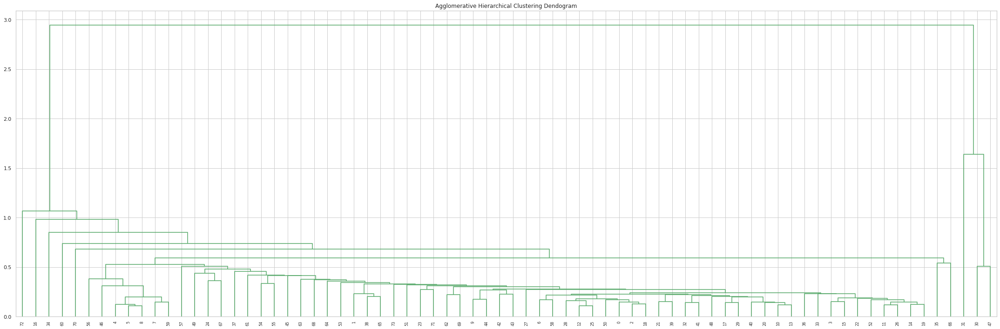

In [135]:
plt.figure(figsize=(30, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
Z = linkage(inc_clus['embedding'].values.tolist(), metric='euclidean', method='average')
dendrogram(Z, leaf_rotation=90, color_threshold=40, leaf_font_size=8)
plt.tight_layout()

**Observation:**

From the above graph, records for specific groups are largely different from most other groups which seem to be similar. The motive behind performing clustering is to counter the class imbalance in our data. When we choose to form clusters, it needs to satisfy the below condition:
* The clusters must restore some class balance in our data so that our classification model can predict precisely
* The clusters must not be a combination of large number of assignment groups each, if so then we will not be able to infer properly from the classification

Going by this logic, we go with 45 clusters

In [136]:
model = AgglomerativeClustering(n_clusters=45, affinity='euclidean',  linkage='average')
model.fit(inc_clus['embedding'].values.tolist())

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='average', memory=None, n_clusters=45)

In [137]:
inc_clus['class'] = model.labels_
inc_clus['class'].value_counts()

0     9
2     8
7     7
3     5
8     2
10    2
4     2
1     2
5     1
6     1
9     1
21    1
11    1
12    1
13    1
14    1
15    1
16    1
17    1
18    1
19    1
20    1
44    1
43    1
23    1
42    1
41    1
40    1
39    1
38    1
37    1
36    1
35    1
34    1
33    1
32    1
31    1
30    1
29    1
28    1
27    1
26    1
25    1
24    1
22    1
Name: class, dtype: int64

We can see that most of the clusters have only one group each. This is not an ideal scenario since then there are lot of labels to classify.

###Pseudo class setup

In [138]:
for i in incidents['Assignment group'].unique():
  incidents.loc[incidents['Assignment group']==i,'class'] = inc_clus[inc_clus['Assignment group']==i]['class'].values[0]

In [139]:
clus_arrngmt = pd.DataFrame([(i,inc_clus[inc_clus['class']==i]['Assignment group'].values) for i in inc_clus['class'].unique()],columns=['cluster id','cluster groups'])
clus_arrngmt.set_index('cluster id',inplace=True)
clus_arrngmt['ticket_counts'] = incidents['class'].value_counts()
clus_arrngmt['class_counts'] = inc_clus['class'].value_counts()
clus_arrngmt.reset_index(inplace=True)
clus_arrngmt.head()

,cluster id,cluster groups,ticket_counts,class_counts
0,7,"[GRP_0, GRP_3, GRP_13, GRP_19, GRP_25, GRP_28,...",4661,7
1,39,[GRP_1],31,1
2,2,"[GRP_4, GRP_12, GRP_15, GRP_16, GRP_2, GRP_22,...",819,8
3,3,"[GRP_5, GRP_6, GRP_8, GRP_9, GRP_60]",1224,5
4,4,"[GRP_7, GRP_59]",74,2


In [140]:
clus_arrngmt = clus_arrngmt.sort_values(by='ticket_counts',ascending=False).head(10)
clus_arrngmt.sum()

cluster id        121
ticket_counts    8007
class_counts       38
dtype: int64

**Observation:**

We have tried to counter the challenges by filtering those clusters which are associated with more records. We have arrived at 10 clusters, the class balance has been improved slightly.

In [141]:
clus_arrngmt

,cluster id,cluster groups,ticket_counts,class_counts
0,7,"[GRP_0, GRP_3, GRP_13, GRP_19, GRP_25, GRP_28,...",4661,7
3,3,"[GRP_5, GRP_6, GRP_8, GRP_9, GRP_60]",1224,5
2,2,"[GRP_4, GRP_12, GRP_15, GRP_16, GRP_2, GRP_22,...",819,8
6,0,"[GRP_11, GRP_14, GRP_18, GRP_20, GRP_29, GRP_3...",559,9
10,22,[GRP_24],285,1
5,8,"[GRP_10, GRP_45]",175,2
4,4,"[GRP_7, GRP_59]",74,2
8,10,"[GRP_21, GRP_40]",73,2
13,25,[GRP_31],69,1
7,40,[GRP_17],68,1


In [142]:

clus_arrngmt['cluster id'].values

array([ 7,  3,  2,  0, 22,  8,  4, 10, 25, 40])

In [144]:
incidents_clust = incidents[incidents['class'].isin(clus_arrngmt['cluster id'].values)]
incidents_clust.shape

(8007, 9)

In [143]:
clus_arrngmt

,cluster id,cluster groups,ticket_counts,class_counts
0,7,"[GRP_0, GRP_3, GRP_13, GRP_19, GRP_25, GRP_28,...",4661,7
3,3,"[GRP_5, GRP_6, GRP_8, GRP_9, GRP_60]",1224,5
2,2,"[GRP_4, GRP_12, GRP_15, GRP_16, GRP_2, GRP_22,...",819,8
6,0,"[GRP_11, GRP_14, GRP_18, GRP_20, GRP_29, GRP_3...",559,9
10,22,[GRP_24],285,1
5,8,"[GRP_10, GRP_45]",175,2
4,4,"[GRP_7, GRP_59]",74,2
8,10,"[GRP_21, GRP_40]",73,2
13,25,[GRP_31],69,1
7,40,[GRP_17],68,1


In [146]:
  
clus_arrngmt['cluster id'] = clus_arrngmt['cluster id'].map({0:0, 7:0, 3:1, 2:2, 0:3,22:4, 8:5, 4:6, 10:7,25:8, 40:9})
incidents_clust['class'] = incidents_clust['class'].map({0:0, 7:0, 3:1, 2:2, 0:3,22:4, 8:5, 4:6, 10:7,25:8, 40:9})

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [147]:
incidents_clust['class'].value_counts()

0    4661
1    1224
2     819
3     559
4     285
5     175
6      74
7      73
8      69
9      68
Name: class, dtype: int64

Based on the above deductions, we will only focus on the 36 groups above clustered into 8 classes for building various supervised machine learning models. Other clusters/classes have very less number of records for our model to understand and predict.

## KMeans clustering

In [148]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.90, min_df =25, max_features=10000, use_idf=True)
tfidf_matrix = tfidf_vectorizer.fit_transform(incidents['tokens'])
incidents['tfidf'] =  list(tfidf_vectorizer.fit_transform(incidents['tokens']).toarray())
tfidf_matrix_arr = tfidf_matrix.toarray()
tfidf_feature_names = tfidf_vectorizer.get_feature_names()
doc_term_matrix_tfidf = pd.DataFrame(tfidf_matrix.todense(), columns=list(tfidf_feature_names))
doc_term_matrix_tfidf

,abende,able,accept,access,account,action,activate,activation,active,activity,ad,add,additional,address,admin,administrator,advise,aerp,affect,agent,alert,allow,already,also,alternate,always,amar,analysis,another,anymore,anything,ap,apac,app,appear,application,approval,approve,area,asa,...,vip,visitor,volume,vpn,want,warehouse,warm,warning,way,web,website,wednesday,week,welcome,well,wifi,win,window,windows,wireless,within,without,word,work,workflow,working,would,write,wrong,ws,www,yes,yesterday,yet,µè,ºæ,å¼,æ³,æœ,çš
0,0.0,0.172409,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.219104,0.0,0.0,0.0,0.0,0.0,0.210871,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.245484,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.274328,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.474731,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.000000,0.0,0.379990,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8411,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.432062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8412,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8413,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.706034,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.501136,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8414,0.0,0.000000,0.0,0.333936,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0

In [149]:
incidents.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt,Group id,embedding,class,tfidf
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138,22,0,"[-0.24095591107059433, 0.06928248098794965, -0...",7.0,"[0.0, 0.17240877003381774, 0.0, 0.0, 0.0, 0.0,..."
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132,19,0,"[-0.25078766922480566, 0.07879859299370737, -0...",7.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51,9,0,"[-0.18236102760020717, 0.1377793746251686, -0....",7.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26,5,0,"[-0.20744724489318636, 0.03561946491782482, -0...",7.0,"[0.0, 0.0, 0.0, 0.3799904567992676, 0.0, 0.0, ..."
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11,2,0,"[-0.31042483377016405, -0.13657435978000815, -...",7.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [150]:
tfidf_matrix

<8416x711 sparse matrix of type '<class 'numpy.float64'>'
	with 89336 stored elements in Compressed Sparse Row format>

In [151]:
#save the sparse matrix
from scipy.sparse import csr_matrix

def save_sparse_csr(filename,array):
    np.savez(filename,data = array.data ,indices=array.indices,
             indptr =array.indptr, shape=array.shape )

def load_sparse_csr(filename):
    loader = np.load(filename)
    return csr_matrix((loader['data'], loader['indices'], loader['indptr']),
                         shape = loader['shape'])

save_sparse_csr(project_path + 'tf_idf.npz', tfidf_matrix)

In [152]:
len(tfidf_matrix.todense())

8416

Fit 2 clusters
Fit 4 clusters
Fit 6 clusters
Fit 8 clusters
Fit 10 clusters
Fit 12 clusters
Fit 14 clusters
Fit 16 clusters
Fit 18 clusters
Fit 20 clusters


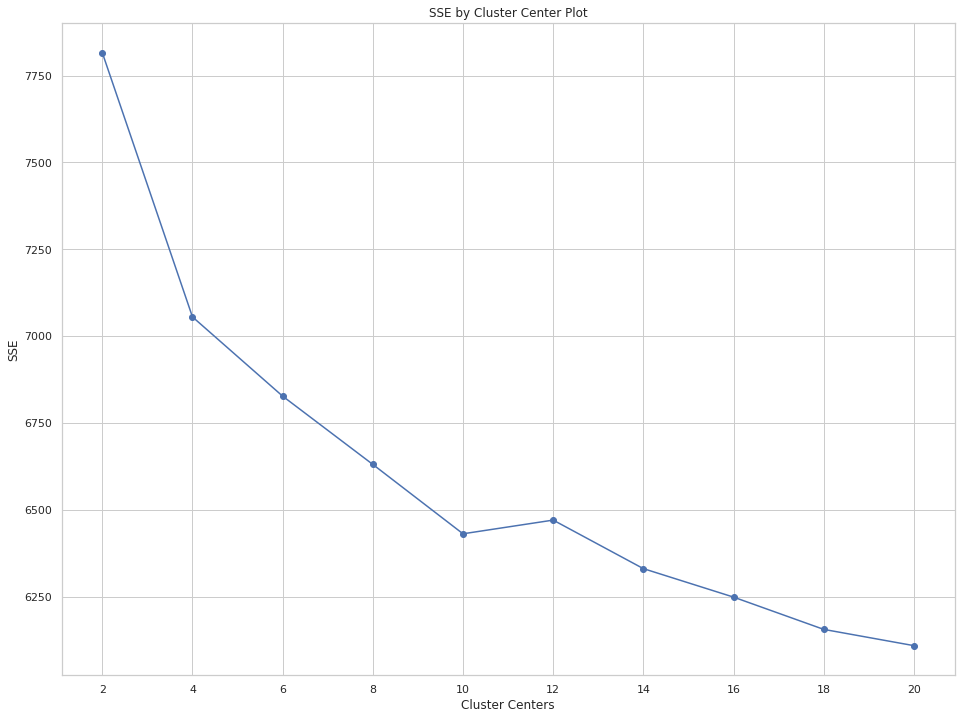

In [153]:
#Find optimal clusters

from sklearn.cluster import MiniBatchKMeans

def find_optimal_clusters(data, max_k):
    iters = range(2, max_k+1, 2)
    
    sse = []
    for k in iters:
        sse.append(MiniBatchKMeans(n_clusters=k, init_size=1024, batch_size=2048, random_state=20).fit(data).inertia_)
        print('Fit {} clusters'.format(k))
        
    f, ax = plt.subplots(1, 1)
    ax.plot(iters, sse, marker='o')
    ax.set_xlabel('Cluster Centers')
    ax.set_xticks(iters)
    ax.set_xticklabels(iters)
    ax.set_ylabel('SSE')
    ax.set_title('SSE by Cluster Center Plot')
    
find_optimal_clusters(tfidf_matrix, 20)

In [154]:
#Get the clusters

clusters = MiniBatchKMeans(n_clusters=14, init_size=1024, batch_size=2048, random_state=20).fit_predict(tfidf_matrix)

In [155]:
#Get the top key words from the clusters

def get_top_keywords(data, clusters, labels, n_terms):
    df = pd.DataFrame(data.todense()).groupby(clusters).mean()
    
    for i,r in df.iterrows():
        print('\nCluster {}'.format(i))
        print(','.join([labels[t] for t in np.argsort(r)[-n_terms:]]))
            
get_top_keywords(tfidf_matrix, clusters, tfidf_vectorizer.get_feature_names(), 10)


Cluster 0
tool,user,new,pc,erp,access,printer,need,problem,please

Cluster 1
browser,internet,explorer,name,email,hello,please,receive,com,gmail

Cluster 2
sid,abende,com,receive,company,tool,fail,monitor,scheduler,job

Cluster 3
get,reset,password,ad,windows,sid,unlock,erp,lock,account

Cluster 4
name,would,pron,sid,issue,login,user,inplant,update,ticket

Cluster 5
cert,maint,vendor,backup,telecom,site,power,circuit,na,yes

Cluster 6
hello,please,sid,receive,jpg,com,png,gmail,image,cid

Cluster 7
please,user,request,management,windows,passwrod,sid,erp,reset,password

Cluster 8
access,tool,engineering,erp,log,vpn,skype,connect,login,unable

Cluster 9
order,log,erp,please,see,try,attach,get,message,error

Cluster 10
respond,password,work,email,issue,launch,open,crm,unable,outlook

Cluster 11
gb,label,exe,disk,available,volume,consume,server,space,hostname

Cluster 12
please,tool,subject,company,usa,send,since,pm,issue,work

Cluster 13
issue,make,hear,disconnect,phone,gso,skype,user,bla

In [156]:
# get clusters from k-means
from sklearn.cluster import KMeans

k = 14
km = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=5,
                verbose=1)
%time km.fit(tfidf_matrix)

clusters = km.labels_.tolist()
clusters = pd.DataFrame(clusters, columns=['Clusters'])
incidents_tfidf = pd.concat([incidents, clusters], axis=1)


Initialization complete
Iteration  0, inertia 11709.333
Iteration  1, inertia 6649.873
Iteration  2, inertia 6433.827
Iteration  3, inertia 6361.989
Iteration  4, inertia 6329.101
Iteration  5, inertia 6302.630
Iteration  6, inertia 6298.419
Iteration  7, inertia 6297.078
Iteration  8, inertia 6296.473
Iteration  9, inertia 6296.212
Iteration 10, inertia 6296.069
Iteration 11, inertia 6295.961
Iteration 12, inertia 6295.899
Iteration 13, inertia 6295.837
Iteration 14, inertia 6295.737
Iteration 15, inertia 6295.649
Iteration 16, inertia 6295.550
Iteration 17, inertia 6295.381
Iteration 18, inertia 6295.119
Iteration 19, inertia 6295.021
Iteration 20, inertia 6294.974
Iteration 21, inertia 6294.961
Iteration 22, inertia 6294.950
Converged at iteration 22: center shift 0.000000e+00 within tolerance 1.340551e-07
Initialization complete
Iteration  0, inertia 7202.928
Iteration  1, inertia 6695.475
Iteration  2, inertia 6629.848
Iteration  3, inertia 6607.300
Iteration  4, inertia 6601.372


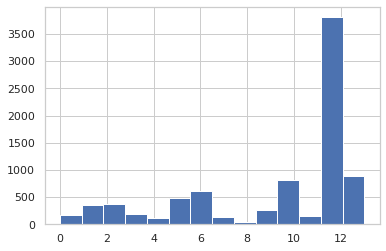

In [157]:
#Plot the clusters
import matplotlib.pyplot as plt
%matplotlib inline

plt.hist(km.labels_, bins=k)
plt.show()

In [158]:
group_id_tfidf = incidents_tfidf[['Assignment group', 'Clusters']].drop_duplicates().sort_values('Clusters')

In [159]:
group_id_tfidf.dropna(inplace=True)

In [160]:
for i in incidents['Assignment group'].unique():
  incidents.loc[incidents['Assignment group']==i,'Clusters'] = group_id_tfidf[group_id_tfidf['Assignment group']==i]['Clusters'].values[0]

In [161]:
Kclus_arrngmt = pd.DataFrame([(i,incidents[incidents['Clusters']==i]['Assignment group'].unique()) for i in group_id_tfidf['Clusters'].unique()],columns=['cluster id','cluster groups'])
Kclus_arrngmt.set_index('cluster id',inplace=True)
Kclus_arrngmt['ticket_counts'] = incidents['Clusters'].value_counts()
Kclus_arrngmt.reset_index(inplace=True)
Kclus_arrngmt.dropna(inplace=True)
Kclus_arrngmt.head(8)

,cluster id,cluster groups,ticket_counts
0,0.0,"[GRP_0, GRP_1, GRP_3, GRP_4, GRP_5, GRP_6, GRP...",7791.0
1,1.0,"[GRP_7, GRP_16, GRP_23, GRP_30, GRP_36, GRP_37...",431.0
2,2.0,"[GRP_11, GRP_27, GRP_42, GRP_46, GRP_47, GRP_6...",138.0
5,5.0,"[GRP_38, GRP_50, GRP_56]",20.0
6,6.0,"[GRP_54, GRP_32, GRP_67, GRP_71]",9.0
9,9.0,"[GRP_49, GRP_73]",7.0
10,10.0,[GRP_43],5.0
12,12.0,"[GRP_35, GRP_57, GRP_63, GRP_66, GRP_69, GRP_7...",15.0


In [162]:
incidents_tfidf.dropna(inplace=True)

In [163]:
incidents_tfidf.head()

,Description,Caller,Assignment group,tokens,desc_len,desc_word_cnt,Group id,embedding,class,tfidf,Clusters
0,verified user details employee manager name c...,spxjnwir pjlcoqds,GRP_0,verify user detail employee manager name check...,138.0,22.0,0.0,"[-0.24095591107059433, 0.06928248098794965, -0...",7.0,"[0.0, 0.17240877003381774, 0.0, 0.0, 0.0, 0.0,...",12.0
1,received from hmjdrvpb komuaywn gmail com hell...,hmjdrvpb komuaywn,GRP_0,receive hmjdrvpb komuaywn gmail com hello team...,132.0,19.0,0.0,"[-0.25078766922480566, 0.07879859299370737, -0...",7.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",10.0
2,received from eylqgodm ybqkwiam gmail com hi i...,eylqgodm ybqkwiam,GRP_0,receive eylqgodm ybqkwiam gmail com hi log vpn...,51.0,9.0,0.0,"[-0.18236102760020717, 0.1377793746251686, -0....",7.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",10.0
3,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable access hr tool page,26.0,5.0,0.0,"[-0.20744724489318636, 0.03561946491782482, -0...",7.0,"[0.0, 0.0, 0.0, 0.3799904567992676, 0.0, 0.0, ...",5.0
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,11.0,2.0,0.0,"[-0.31042483377016405, -0.13657435978000815, -...",7.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",12.0


In [164]:
incidents_tfidf.shape

(8332, 11)

In [165]:
incidents_tfidf['Clusters'].unique()

array([12., 10.,  5.,  3.,  9., 11.,  6.,  2.,  1., 13.,  4.,  7.,  8.,
        0.])

In [166]:
incidents_tfidf['Clusters'] = incidents_tfidf['Clusters'].map({12:0,10:1,5:2,3:3,9:4,11:5,6:6,2:7,1:8,13:9,4:10,7:11,8:12,0:13})

## Model Building

Let's proceed towards trying different model architectures mentioned below to classify the problem and validate which one is outperforming.

* Multinomial Naive Bayes
* K Nearest neighbor
* Support Vector Machine
* Decision Tree
* Random Forest
* Logistic Regression
* SGD Classifier

Let's write some generic methods for utilities and to plot evaluation metrics.

In [167]:
#Create a dataframe to capture the accuracy and f1-score of various models   
log_cols=["Classifier", "Precision", "Recall", "Accuracy", "f1_score", "Latency"]
log = pd.DataFrame(columns=log_cols)


##### Create a function for various classification models

In [168]:
# A class that logs the time
class Timer():
    '''
    A generic class to log the time
    '''
    def __init__(self):
        self.start_ts = None
    def start(self):
        self.start_ts = time()
    def stop(self):
        return 'Time taken: %2fs' % (time()-self.start_ts)
    
timer = Timer()

# A method that plots the Precision-Recall curve
def plot_prec_recall_vs_thresh(precisions, recalls, thresholds):
    plt.figure(figsize=(10,5))
    plt.plot(thresholds, precisions[:-1], 'b--', label='precision')
    plt.plot(thresholds, recalls[:-1], 'g--', label = 'recall')
    plt.xlabel('Threshold')
    plt.legend()

# A method to train and test the model
def run_classification(estimator, X_train, X_test, y_train, y_test, clfname, arch_name=None, pipelineRequired=False, isDeepModel=False):
    global log
    timer.start()
    # train the model
    clf = estimator
    modelname = clfname
   
    if pipelineRequired :
        clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
        clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=10, batch_size=128,verbose=1,callbacks=call_backs(arch_name))
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)
    else :
        clf.fit(X_train, y_train)
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
    
    print('Estimator:', clf)
    print('='*80)
    print('Training accuracy: %.2f%%' % (accuracy_score(y_train,y_train_pred) * 100))
    print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, y_pred) * 100))
    print('='*80)

    try:
      classes = y_train.unique().tolist()
    except:
      classes = np.unique(y_train).tolist()
    print('Confusion matrix:\n')
    hmap = sns.heatmap(pd.DataFrame(confusion_matrix(y_test, y_pred), index=classes, columns=classes), annot=True, fmt="d")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    print('='*80)
    print('Classification report:\n %s' % (classification_report(y_test, y_pred)))

    print(timer.stop(), 'to run the model')
    time_taken=timer.stop()
    log_entry = pd.DataFrame([[modelname,precision_score(y_pred, y_test,average='weighted'),recall_score(y_pred, y_test,average='weighted'),
                               accuracy_score(y_pred, y_test),f1_score(y_pred, y_test,average='weighted'),time_taken]], columns=log_cols)
    log = log.append(log_entry)


### Classification Models on Bag of Words

In [169]:
vectorizer, vocab, train_data_features, tfidf_features, tfidf  =  create_bag_of_words(incidents_clust['Description'])

In [170]:
tfidf

TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True)

In [171]:
X = tfidf_features
y = incidents_clust['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20)

**Multinomial Naive Bayes**

Estimator: MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)
Training accuracy: 78.78%
Testing accuracy: 76.90%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.75      0.97      0.85       947
           1       0.88      0.86      0.87       235
           2       0.73      0.22      0.34       170
           3       0.50      0.15      0.23       109
           4       1.00      0.76      0.86        50
           5       0.00      0.00      0.00        32
           6       0.00      0.00      0.00         5
           7       0.00      0.00      0.00        16
           8       1.00      0.06      0.12        16
           9       1.00      0.59      0.74        22

    accuracy                           0.77      1602
   macro avg       0.59      0.36      0.40      1602
weighted avg       0.74      0.77      0.72      1602

Time taken: 0.650502s to run the model


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


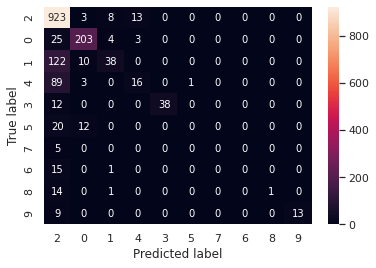

In [172]:
run_classification(MultinomialNB(), X_train, X_test, y_train, y_test,"MultinomialNB-BOW & Hierarchical")

In [173]:
import warnings
warnings.filterwarnings('ignore') 

**Linear SVC**

Estimator: OneVsRestClassifier(estimator=LinearSVC(C=1.0, class_weight='balanced',
                                        dual=True, fit_intercept=True,
                                        intercept_scaling=1, loss='hinge',
                                        max_iter=1000, multi_class='ovr',
                                        penalty='l2', random_state=42,
                                        tol=0.0001, verbose=0),
                    n_jobs=None)
Training accuracy: 94.50%
Testing accuracy: 80.02%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.88      0.88      0.88       947
           1       0.90      0.91      0.90       235
           2       0.51      0.55      0.53       170
           3       0.48      0.51      0.50       109
           4       0.82      0.94      0.88        50
           5       0.59      0.41      0.48        32
           6       0.20      0.20      0.20         5
  

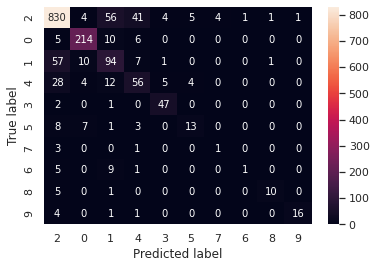

In [174]:
run_classification(OneVsRestClassifier(LinearSVC(loss='hinge',random_state=42,class_weight='balanced')), X_train, X_test, y_train, y_test, "LinearSVC-BOW & Hierarchical")

**SGD Classifier**

Estimator: SGDClassifier(alpha=0.001, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=100, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=42, shuffle=True, tol=None,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 85.28%
Testing accuracy: 73.41%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.90      0.78      0.83       947
           1       0.88      0.88      0.88       235
           2       0.62      0.44      0.52       170
           3       0.55      0.43      0.48       109
           4       0.61      1.00      0.76        50
           5       0.31      0.53      0.39        32
           6       0.10      0.80      0.17         5
           7       0.14      0.81    

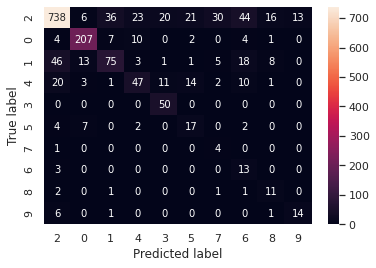

In [175]:
run_classification(SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=100, tol=None,class_weight='balanced'), 
                   X_train, X_test, y_train, y_test, "SGDClassifier-BOW & Hierarchical")

**Logistic Regression**

Estimator: LogisticRegression(C=100000.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='auto', n_jobs=1, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 97.44%
Testing accuracy: 77.22%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.84      0.87      0.85       947
           1       0.92      0.90      0.91       235
           2       0.53      0.47      0.50       170
           3       0.49      0.33      0.39       109
           4       0.86      0.88      0.87        50
           5       0.75      0.38      0.50        32
           6       0.40      0.40      0.40         5
           7       0.08      0.25      0.12        16
           8       0.43      0.56      0.49        16
           9       0

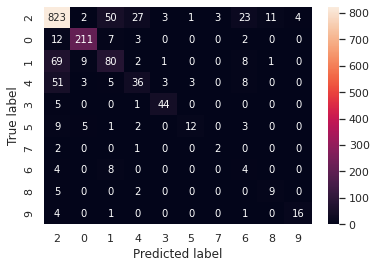

In [176]:
run_classification(LogisticRegression(n_jobs=1, C=1e5,class_weight='balanced'), X_train, X_test, y_train, y_test, "LogisticRegression-BOW & Hierarchical")

**Random Forest Classifier**

In [177]:
le = LabelEncoder()
tokenizer = Tokenizer(num_words= 10000)
tokenizer.fit_on_texts(incidents_clust['Description'])
maxlen = 300

In [178]:
X_M1 = tokenizer.texts_to_sequences(incidents_clust['Description'])
X_M1 = pad_sequences(X_M1, maxlen = maxlen)
y_M1 = np.asarray(incidents_clust['class'])

In [179]:
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_M1, y_M1, test_size = 0.3)

Estimator: RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)
Training accuracy: 98.82%
Testing accuracy: 75.36%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.73      0.98      0.83      1409
           1       0.94      0.79      0.86       365
           2       0.64      0.15      0.24       240
           3       0.44      0.04      0.08       162
           4       0.79      0.76      0.77        88
           5       0.8

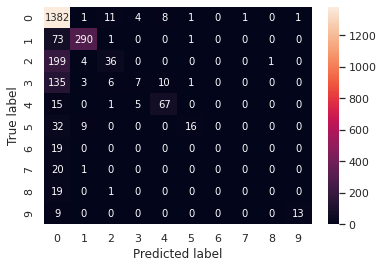

In [180]:
run_classification(RandomForestClassifier(max_depth=15, random_state=0, class_weight="balanced"), X_train_2, X_test_2, y_train_2, y_test_2, "RandomForest-BOW & Hierarchical")

**Decision Tree Classifier**

Estimator: DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')
Training accuracy: 99.16%
Testing accuracy: 65.46%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.77      0.76      0.77      1409
           1       0.78      0.82      0.80       365
           2       0.31      0.31      0.31       240
           3       0.20      0.20      0.20       162
           4       0.63      0.73      0.68        88
           5       0.40      0.28      0.33        57
           6       0.00      0.00      0.00        19
           7       0.11      0.10  

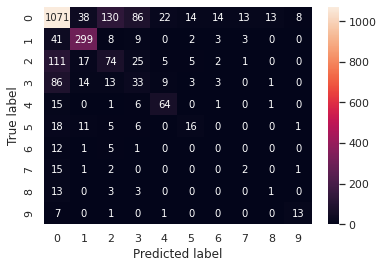

In [181]:
run_classification(DecisionTreeClassifier(), X_train_2, X_test_2, y_train_2, y_test_2, "DecisionTree-BOW & Hierarchical")

**K-Nearest Neighbours**

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='distance')
Training accuracy: 99.16%
Testing accuracy: 69.12%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.73      0.88      0.80      1409
           1       0.74      0.81      0.77       365
           2       0.30      0.14      0.19       240
           3       0.09      0.03      0.05       162
           4       0.66      0.69      0.68        88
           5       0.76      0.28      0.41        57
           6       0.00      0.00      0.00        19
           7       0.00      0.00      0.00        21
           8       0.00      0.00      0.00        20
           9       0.87      0.59      0.70        22

    accuracy                           0.69      2403
   macro avg       0.41      0.34      0.36      2403
wei

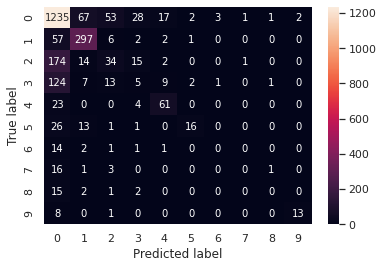

In [182]:
run_classification(KNeighborsClassifier(n_neighbors= 5 , weights = 'distance'), X_train_2, X_test_2, y_train_2, y_test_2, "KNN-BOW & Hierarchical")

In [183]:
log.set_index(["Classifier"]).sort_values(by=['f1_score'])

,Precision,Recall,Accuracy,f1_score,Latency
Classifier,,,,,
DecisionTree-BOW & Hierarchical,0.656608,0.654598,0.654598,0.655197,Time taken: 0.381346s
SGDClassifier-BOW & Hierarchical,0.750896,0.734082,0.734082,0.712586,Time taken: 105.452227s
KNN-BOW & Hierarchical,0.793717,0.691219,0.691219,0.734631,Time taken: 14.460155s
LogisticRegression-BOW & Hierarchical,0.779728,0.772160,0.772160,0.772824,Time taken: 38.331480s
LinearSVC-BOW & Hierarchical,0.807141,0.800250,0.800250,0.802703,Time taken: 4.282841s
RandomForest-BOW & Hierarchical,0.914964,0.753641,0.753641,0.812484,Time taken: 1.474106s
MultinomialNB-BOW & Hierarchical,0.908375,0.769039,0.769039,0.819833,Time taken: 0.650558s


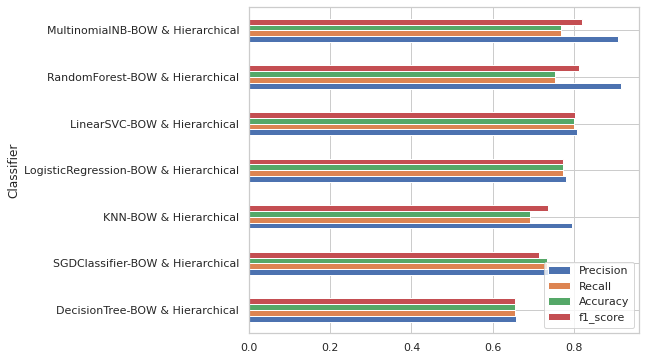

In [184]:
log.set_index(["Classifier"]).sort_values(by=['f1_score']).plot(kind='barh',figsize=[7,6])

**Observation:** 
* Multinomial NB and Linear SVC have better performance but still are overfitted since the training accuracy is around 90% for most of the models and the testing accuracies, f1-scores are plotted above 
* We would be fine tuning the models and reduce the overfitting in next iteration.

### Data balancing using cosine distance comparison and SMOTE techniques

In [185]:
inc_grp0 = incidents_clust[incidents_clust['Assignment group']=='GRP_0']
incidents_nongrp0 = incidents_clust[incidents_clust['Assignment group']!='GRP_0']
inc_grp0.reset_index(drop=True,inplace=True)

In [186]:
print(inc_grp0.shape)
print(incidents_nongrp0.shape)

(3933, 9)
(4074, 9)


In [187]:
for i in range(100000):  #randomly choosing 100k iterations of comparison
  a=random.randint(0,inc_grp0.shape[0]-1)
  b=random.randint(0,inc_grp0.shape[0]-1)
  if (a!=b):
    if ((1-scipy.spatial.distance.cosine(inc_grp0.iloc[a]['embedding'],inc_grp0.iloc[b]['embedding'])) > 0.97):
      inc_grp0.drop(b, inplace=True)
      inc_grp0.reset_index(drop=True, inplace=True)

incidents_cosine = pd.concat([inc_grp0, incidents_nongrp0])
print(incidents_cosine.shape)

(4260, 9)


In [188]:
#with open('incidents_cosine.pickle', 'wb') as output:
#    pickle.dump(incidents_cosine, output)

#with open('incidents_cosine.pickle', 'rb') as data:
#    incidents_cosine = pickle.load(data)

In [189]:
X1 = incidents_cosine['embedding'].values.tolist()
y1 = incidents_cosine['class']
X1 = np.array(X1)
y1 = np.array(y1)

In [190]:
np.unique(y1)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [191]:
oversample = SMOTE(k_neighbors=10)
X1, y1 = oversample.fit_resample(X1, y1)

undersample = RandomUnderSampler(random_state=42)
incidents_smote_data, incidents_smote_label = undersample.fit_resample(X1, y1)

In [192]:
counter = Counter(incidents_smote_label)
print(counter)

Counter({0: 1224, 1: 1224, 2: 1224, 3: 1224, 4: 1224, 5: 1224, 6: 1224, 7: 1224, 8: 1224, 9: 1224})


In [193]:
#with open('incidents_smote_data.pickle', 'wb') as output:
#    pickle.dump(incidents_smote_data, output)
    
#with open('incidents_smote_label.pickle', 'wb') as output:
#    pickle.dump(incidents_smote_label, output)
    
#with open('incidents_smote_data.pickle', 'rb') as data:
#    incidents_smote_data = pickle.load(data)

#with open('incidents_smote_label.pickle', 'rb') as data:
#    incidents_smote_label = pickle.load(data)

#### Create training and test datasets

In [194]:
X_train, X_test, y_train, y_test = train_test_split(incidents_smote_data, incidents_smote_label, test_size=0.15, random_state=10)

### Classification Models on Glove embedding clusters

**Linear SVC**

Estimator: OneVsRestClassifier(estimator=LinearSVC(C=1.0, class_weight='balanced',
                                        dual=True, fit_intercept=True,
                                        intercept_scaling=1, loss='hinge',
                                        max_iter=1000, multi_class='ovr',
                                        penalty='l2', random_state=42,
                                        tol=0.0001, verbose=0),
                    n_jobs=None)
Training accuracy: 57.52%
Testing accuracy: 59.42%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.27      0.16      0.20       185
           1       0.77      0.76      0.77       186
           2       0.35      0.39      0.37       184
           3       0.38      0.35      0.37       189
           4       0.81      0.75      0.78       187
           5       0.53      0.38      0.44       185
           6       0.55      0.78      0.65       205
  

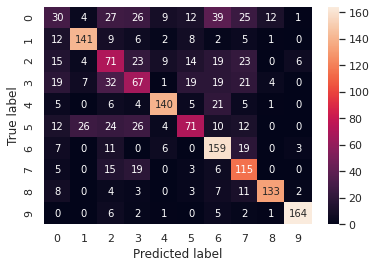

In [195]:
run_classification(OneVsRestClassifier(LinearSVC(loss='hinge',random_state=42,class_weight='balanced')), X_train, X_test, y_train, y_test, "LinearSVC-Glove & Hierarchical")

**SGD Classifier**

Estimator: SGDClassifier(alpha=0.001, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=100, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=42, shuffle=True, tol=None,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 50.44%
Testing accuracy: 50.65%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.15      0.23      0.18       185
           1       0.50      0.68      0.58       186
           2       0.47      0.08      0.13       184
           3       0.00      0.00      0.00       189
           4       0.64      0.87      0.74       187
           5       0.00      0.00      0.00       185
           6       0.56      0.73      0.63       205
           7       0.35      0.75    

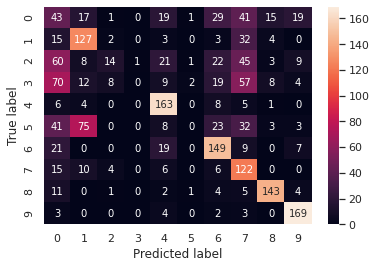

In [196]:
run_classification(SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=100, tol=None,class_weight='balanced'), 
                   X_train, X_test, y_train, y_test, "SGDClassifier-Glove & Hierarchical")

**Logistic Regression**

Estimator: LogisticRegression(C=100000.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='auto', n_jobs=1, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 56.74%
Testing accuracy: 58.55%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.25      0.20      0.22       185
           1       0.69      0.70      0.69       186
           2       0.33      0.40      0.37       184
           3       0.46      0.33      0.38       189
           4       0.74      0.76      0.75       187
           5       0.47      0.30      0.37       185
           6       0.65      0.75      0.70       205
           7       0.46      0.70      0.56       163
           8       0.86      0.83      0.84       171
           9       0

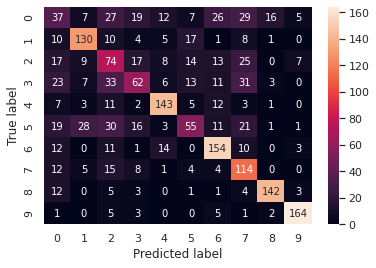

In [197]:
run_classification(LogisticRegression(n_jobs=1, C=1e5,class_weight='balanced'), X_train, X_test, y_train, y_test, "LogisticRegression-Glove & Hierarchical")

**Random Forest Classifier**

Estimator: RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)
Training accuracy: 97.27%
Testing accuracy: 84.91%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.79      0.54      0.64       185
           1       0.85      0.80      0.82       186
           2       0.65      0.70      0.67       184
           3       0.69      0.79      0.74       189
           4       0.94      0.94      0.94       187
           5       0.9

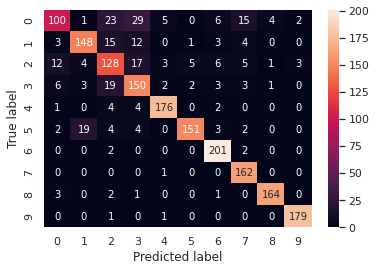

In [198]:
run_classification(RandomForestClassifier(max_depth=15, random_state=0, class_weight="balanced"), X_train, X_test, y_train, y_test, "RandomForest-Glove & Hierarchical")

**Decision Tree Classifier**

Estimator: DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')
Training accuracy: 98.24%
Testing accuracy: 73.20%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.44      0.36      0.39       185
           1       0.73      0.78      0.76       186
           2       0.45      0.51      0.48       184
           3       0.55      0.58      0.56       189
           4       0.83      0.82      0.82       187
           5       0.74      0.77      0.75       185
           6       0.90      0.88      0.89       205
           7       0.86      0.82  

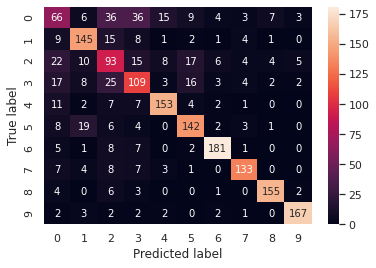

In [199]:
run_classification(DecisionTreeClassifier(), X_train, X_test, y_train, y_test, "DecisionTree-Glove & Hierarchical")

**K-Nearest Neighbours**

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='distance')
Training accuracy: 98.24%
Testing accuracy: 86.60%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.88      0.50      0.64       185
           1       0.84      0.81      0.82       186
           2       0.82      0.71      0.76       184
           3       0.78      0.82      0.80       189
           4       0.94      0.99      0.96       187
           5       0.84      0.90      0.87       185
           6       0.89      1.00      0.94       205
           7       0.82      1.00      0.90       163
           8       0.89      0.96      0.92       171
           9       0.97      0.99      0.98       181

    accuracy                           0.87      1836
   macro avg       0.87      0.87      0.86      1836
wei

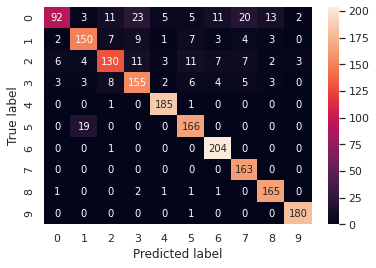

In [200]:
run_classification(KNeighborsClassifier(n_neighbors= 5 , weights = 'distance'), X_train, X_test, y_train, y_test, "KNN-Glove & Hierarchical")

In [201]:
log.set_index(["Classifier"]).sort_values(by=['f1_score'])

,Precision,Recall,Accuracy,f1_score,Latency
Classifier,,,,,
SGDClassifier-Glove & Hierarchical,0.689956,0.506536,0.506536,0.573987,Time taken: 5.459641s
LogisticRegression-Glove & Hierarchical,0.616052,0.585512,0.585512,0.594379,Time taken: 2.405214s
LinearSVC-Glove & Hierarchical,0.624495,0.594227,0.594227,0.601640,Time taken: 9.030653s
DecisionTree-BOW & Hierarchical,0.656608,0.654598,0.654598,0.655197,Time taken: 0.381346s
SGDClassifier-BOW & Hierarchical,0.750896,0.734082,0.734082,0.712586,Time taken: 105.452227s
DecisionTree-Glove & Hierarchical,0.734910,0.732026,0.732026,0.732747,Time taken: 4.941877s
KNN-BOW & Hierarchical,0.793717,0.691219,0.691219,0.734631,Time taken: 14.460155s
LogisticRegression-BOW & Hierarchical,0.779728,0.772160,0.772160,0.772824,Time taken: 38.331480s
LinearSVC-BOW & Hierarchical,0.807141,0.800250,0.800250,0.802703,Time taken: 4.282841s


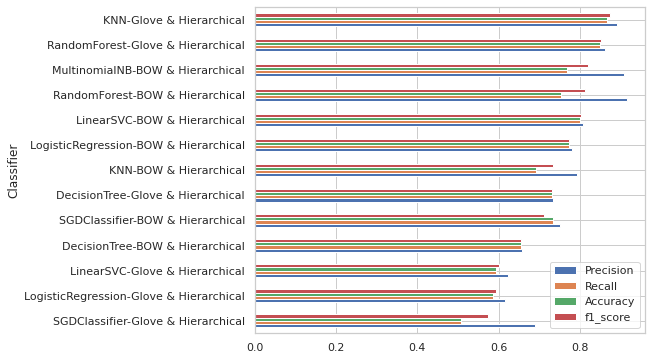

In [202]:
log.set_index(["Classifier"]).sort_values(by=['f1_score']).plot(kind='barh',figsize=[7,6])

**Observation:** 
* Random Forest and KNN have better performance but still are overfitted since the training accuracy is around 90% for most of the models and the f1-scores are plotted above 
* We would be fine tuning the models and reduce the overfitting in next iteration.


### Classification Models using KMeans clusters

In [203]:
X = incidents_tfidf['tfidf'].values.tolist()
y = incidents_tfidf['Clusters']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=10)

In [204]:
y_train.value_counts()

0     3226
9      747
1      688
6      523
2      406
7      306
8      301
4      209
3      161
13     142
5      135
11     112
10      97
12      29
Name: Clusters, dtype: int64

**Multinomial Naive Bayes**

Estimator: MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)
Training accuracy: 45.52%
Testing accuracy: 44.16%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.44      1.00      0.61       553
           1       0.00      0.00      0.00       123
           2       0.00      0.00      0.00        76
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00        47
           5       0.00      0.00      0.00        23
           6       0.00      0.00      0.00        85
           7       0.00      0.00      0.00        56
           8       0.00      0.00      0.00        43
           9       0.00      0.00      0.00       136
          10       0.00      0.00      0.00        22
          11       0.00      0.00      0.00        29
          12       0.00      0.00      0.00         7
          13       0.00      0.00      0.00        29

    accuracy            

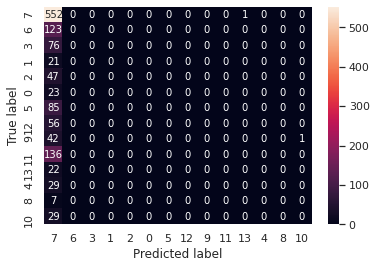

In [205]:
run_classification(MultinomialNB(), X_train, X_test, y_train, y_test,"TFIDF & K-Means", "MultinomialNB")

**LinearSVC**

Estimator: OneVsRestClassifier(estimator=LinearSVC(C=1.0, class_weight=None, dual=True,
                                        fit_intercept=True, intercept_scaling=1,
                                        loss='squared_hinge', max_iter=1000,
                                        multi_class='ovr', penalty='l2',
                                        random_state=None, tol=0.0001,
                                        verbose=0),
                    n_jobs=None)
Training accuracy: 48.77%
Testing accuracy: 41.60%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.44      0.93      0.60       553
           1       0.17      0.03      0.05       123
           2       0.00      0.00      0.00        76
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00        47
           5       0.00      0.00      0.00        23
           6       0.00      0.00      0.00        8

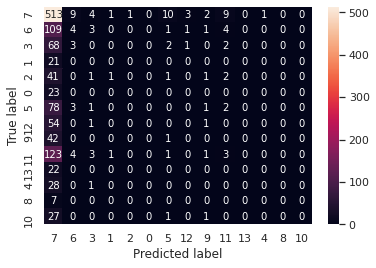

In [206]:
run_classification(OneVsRestClassifier(LinearSVC()), X_train, X_test, y_train, y_test, "LinearSVC-TFIDF & K-Means")

**SGD Classifier**

Estimator: SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 44.72%
Testing accuracy: 34.72%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.45      0.75      0.57       553
           1       0.12      0.05      0.07       123
           2       0.08      0.04      0.05        76
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00        47
           5       0.00      0.00      0.00        23
           6       0.04      0.01      0.02        85
           7       0.00      0.00     

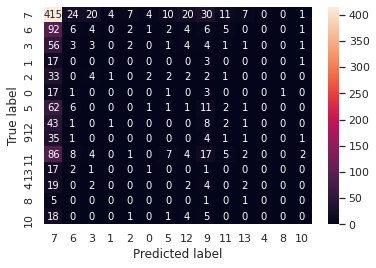

In [207]:
run_classification(SGDClassifier(), X_train, X_test, y_train, y_test, "SGDClassifier-TFIDF & K-Means")

**Logistic Regression**

Estimator: LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 45.78%
Testing accuracy: 43.92%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.44      0.99      0.61       553
           1       0.00      0.00      0.00       123
           2       0.00      0.00      0.00        76
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00        47
           5       0.00      0.00      0.00        23
           6       0.00      0.00      0.00        85
           7       0.00      0.00      0.00        56
           8       0.00      0.00      0.00        43
           9       0.00     

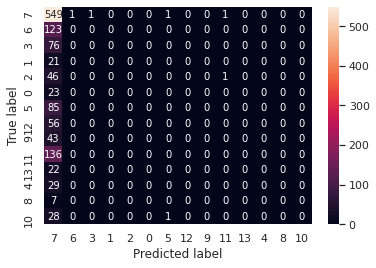

In [208]:
run_classification(LogisticRegression(), X_train, X_test, y_train, y_test, "LogisticRegression-TFIDF & K-Means")

**Random Forest Classifier**

Estimator: RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Training accuracy: 83.17%
Testing accuracy: 40.56%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.44      0.90      0.59       553
           1       0.08      0.02      0.03       123
           2       0.11      0.03      0.04        76
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00        47
           5       0.00

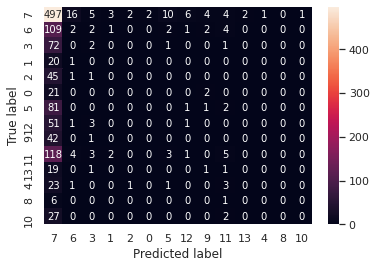

In [209]:
le = LabelEncoder()
tokenizer = Tokenizer(num_words= 10000)
tokenizer.fit_on_texts(incidents_tfidf['tokens'])
maxlen = 720

X_M1 = tokenizer.texts_to_sequences(incidents_clust['tokens'])
X_M1 = pad_sequences(X_M1, maxlen = maxlen)
y_M1 = np.asarray(incidents_clust['class'])

X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_M1, y_M1, test_size = 0.3)

run_classification(RandomForestClassifier(), X_train, X_test, y_train, y_test, "RandomForest-TFIDF & K-Means")

**Decision Tree Classifier**

Estimator: DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')
Training accuracy: 83.17%
Testing accuracy: 31.52%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.44      0.65      0.53       553
           1       0.12      0.07      0.09       123
           2       0.09      0.05      0.07        76
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00        47
           5       0.00      0.00      0.00        23
           6       0.12      0.08      0.10        85
           7       0.06      0.04  

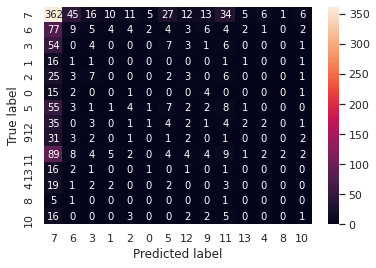

In [210]:
run_classification(DecisionTreeClassifier(), X_train, X_test, y_train, y_test, "DecisionTree-TFIDF & K-Means")

**K-Nearest Neighbours**

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')
Training accuracy: 48.42%
Testing accuracy: 38.08%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.44      0.84      0.58       553
           1       0.07      0.02      0.04       123
           2       0.07      0.01      0.02        76
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00        47
           5       0.00      0.00      0.00        23
           6       0.03      0.01      0.02        85
           7       0.00      0.00      0.00        56
           8       0.00      0.00      0.00        43
           9       0.06      0.04      0.05       136
          10       0.00      0.00      0.00        22
          11       0.00      0.00      0.00        29
     

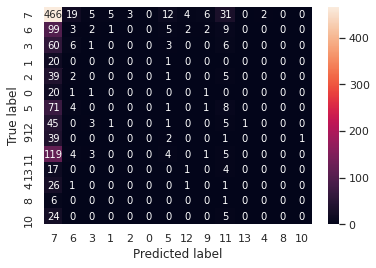

In [211]:
run_classification(KNeighborsClassifier(), X_train, X_test, y_train, y_test, "KNN-TFIDF & K-Means")

In [212]:
log.set_index(["Classifier"]).sort_values(by=['f1_score', 'Latency'])

,Precision,Recall,Accuracy,f1_score,Latency
Classifier,,,,,
DecisionTree-TFIDF & K-Means,0.442992,0.315200,0.315200,0.364887,Time taken: 5.420702s
SGDClassifier-TFIDF & K-Means,0.560986,0.347200,0.347200,0.424513,Time taken: 2.609753s
KNN-TFIDF & K-Means,0.712125,0.380800,0.380800,0.493390,Time taken: 58.277513s
RandomForest-TFIDF & K-Means,0.814711,0.405600,0.405600,0.536639,Time taken: 14.429143s
LinearSVC-TFIDF & K-Means,0.858893,0.416000,0.416000,0.556881,Time taken: 1.469286s
SGDClassifier-Glove & Hierarchical,0.689956,0.506536,0.506536,0.573987,Time taken: 5.459641s
LogisticRegression-Glove & Hierarchical,0.616052,0.585512,0.585512,0.594379,Time taken: 2.405214s
LinearSVC-Glove & Hierarchical,0.624495,0.594227,0.594227,0.601640,Time taken: 9.030653s
LogisticRegression-TFIDF & K-Means,0.988001,0.439200,0.439200,0.608085,Time taken: 3.955781s


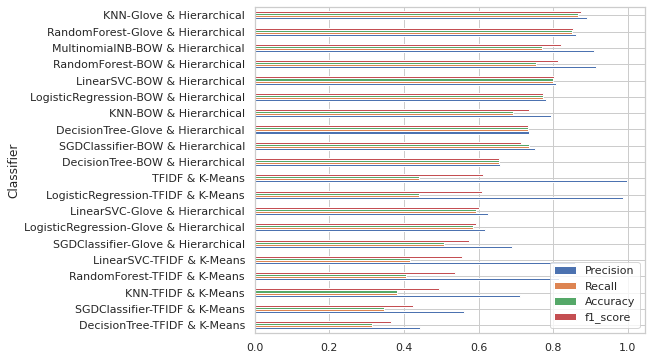

In [213]:
log.set_index(["Classifier"]).sort_values(by=['f1_score','Latency']).plot(kind='barh',figsize=[7,6])

Observation:

* SGD Classifier and Logistic Regression models are performing better but fade in comparison to kNN glove model.
* As a next step, we will fine tune the GLOVE models and reduce the overfitting.

## Hyperparameter Tuning

### Determining the best hyperparameters using GridSearchCV

**Linear SVC**

In [ ]:
# define model and parameters
model = LinearSVC()
penalty = ['l1', 'l2']
loss = ['hinge', 'squared_hinge']
class_weight = ['dict', 'balanced']
C = [50, 10, 1.0]

# define grid search
grid = dict(penalty=penalty,loss=loss,class_weight=class_weight,C=C)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.603474 using {'C': 10, 'class_weight': 'balanced', 'loss': 'squared_hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l1'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'l1'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'hinge', 'penalty': 'l1'}
0.526457 (0.033149) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'squared_hinge', 'penalty': 'l1'}
0.482512 (0.075971) with: {'C': 50, 'class_weight': 'balanced', 'loss': 'squared_hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'C': 10, 'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l1'}
0.000

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


**SGD Classifier**

In [ ]:
# define model and parameters
model = SGDClassifier()
penalty = ['l1', 'l2','elasticnet']
loss = ['hinge', 'squared_hinge', 'modified_huber']
class_weight = ['dict', 'balanced']

# define grid search
grid = dict(penalty=penalty,loss=loss,class_weight=class_weight)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
f1_samples = make_scorer(f1_score, average='macro')
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.540179 using {'class_weight': 'balanced', 'loss': 'modified_huber', 'penalty': 'l1'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l1'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'hinge', 'penalty': 'elasticnet'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'l1'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'l2'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'squared_hinge', 'penalty': 'elasticnet'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'modified_huber', 'penalty': 'l1'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'modified_huber', 'penalty': 'l2'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'loss': 'modified_huber', 'penalty': 'elasticnet'}
0.499768 (0.031567) with: {'class_weight': 'balanced', 'loss': 'hin

**Logistic Regression**

In [ ]:
# define models and parameters
model = LogisticRegression()
f1_samples = make_scorer(f1_score, average='macro')
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


Best: 0.598230 using {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.598230 (0.005541) with: {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.595071 (0.006439) with: {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
0.597988 (0.005519) with: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
0.590830 (0.006327) with: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.589651 (0.005983) with: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.589463 (0.006660) with: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.578911 (0.006587) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'newton-cg'}
0.578802 (0.006500) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}
0.575712 (0.006543) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
0.545025 (0.005680) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}
0.544994 (0.005653) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
0.542490 (0.005166) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
0.460505 (0.005651) wit

**Random Forest**

In [ ]:
# define models and parameters
model = RandomForestClassifier()
f1_samples = make_scorer(f1_score, average='macro')
n_estimators = [10, 100, 1000]
max_features = ['sqrt', 'log2']
# define grid search
grid = dict(n_estimators=n_estimators,max_features=max_features)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Best: 0.897619 using {'max_features': 'sqrt', 'n_estimators': 1000}
0.849658 (0.005502) with: {'max_features': 'sqrt', 'n_estimators': 10}
0.891849 (0.005215) with: {'max_features': 'sqrt', 'n_estimators': 100}
0.897619 (0.003782) with: {'max_features': 'sqrt', 'n_estimators': 1000}
0.846213 (0.003626) with: {'max_features': 'log2', 'n_estimators': 10}
0.890425 (0.004004) with: {'max_features': 'log2', 'n_estimators': 100}
0.897562 (0.004246) with: {'max_features': 'log2', 'n_estimators': 1000}


**Decision Tree**

In [ ]:
# define models and parameters
model = DecisionTreeClassifier()
criterion = ['gini', 'entropy']
max_features = ['auto', 'sqrt', 'log2']
class_weight = ['dict', 'balanced']
f1_samples = make_scorer(f1_score, average='macro')
# define grid search
grid = dict(criterion=criterion,max_features=max_features,class_weight=class_weight)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.746025 using {'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'auto'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'gini', 'max_features': 'auto'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'gini', 'max_features': 'sqrt'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'gini', 'max_features': 'log2'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'entropy', 'max_features': 'auto'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'entropy', 'max_features': 'sqrt'}
0.000000 (0.000000) with: {'class_weight': 'dict', 'criterion': 'entropy', 'max_features': 'log2'}
0.746025 (0.005729) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'auto'}
0.741051 (0.007804) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'sqrt'}
0.735970 (0.006067) with: {'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'log2'}
0.745235 (0.006751) 

**KNN**

In [ ]:
# define models and parameters
model = KNeighborsClassifier()
n_neighbors = range(1, 21, 5)
f1_samples = make_scorer(f1_score, average='macro')
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
# define grid search
grid = dict(n_neighbors=n_neighbors,weights=weights,metric=metric)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=f1_samples,error_score=0)
grid_result = grid_search.fit(incidents_smote_data, incidents_smote_label)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.862609 using {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
0.862609 (0.010814) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
0.862609 (0.010814) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'distance'}
0.818813 (0.009227) with: {'metric': 'euclidean', 'n_neighbors': 6, 'weights': 'uniform'}
0.832826 (0.007291) with: {'metric': 'euclidean', 'n_neighbors': 6, 'weights': 'distance'}
0.781666 (0.008234) with: {'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'uniform'}
0.809850 (0.007973) with: {'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'distance'}
0.757935 (0.006698) with: {'metric': 'euclidean', 'n_neighbors': 16, 'weights': 'uniform'}
0.793861 (0.005920) with: {'metric': 'euclidean', 'n_neighbors': 16, 'weights': 'distance'}
0.862300 (0.010826) with: {'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'uniform'}
0.862300 (0.010826) with: {'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'distance'}
0.8184

### Fit the models with tuned hyperparameters

In [214]:
#Create a dataframe to capture the accuracy and f1-score of various models   
log_cols=["Classifier", "Precision", "Recall", "Accuracy", "f1_score", "Latency"]
log_hyper = pd.DataFrame(columns=log_cols)

In [215]:
X_train, X_test, y_train, y_test = train_test_split(incidents_smote_data, incidents_smote_label, test_size=0.15, random_state=10)

##### Create a function for various classification models

In [216]:
# A class that logs the time
class Timer():
    '''
    A generic class to log the time
    '''
    def __init__(self):
        self.start_ts = None
    def start(self):
        self.start_ts = time()
    def stop(self):
        return 'Time taken: %2fs' % (time()-self.start_ts)
    
timer = Timer()

# A method that plots the Precision-Recall curve
def plot_prec_recall_vs_thresh(precisions, recalls, thresholds):
    plt.figure(figsize=(10,5))
    plt.plot(thresholds, precisions[:-1], 'b--', label='precision')
    plt.plot(thresholds, recalls[:-1], 'g--', label = 'recall')
    plt.xlabel('Threshold')
    plt.legend()

# A method to train and test the model
def run_classification_hyper(estimator, X_train, X_test, y_train, y_test, clfname, arch_name=None, pipelineRequired=False, isDeepModel=False):
    global log_hyper
    timer.start()
    # train the model
    clf = estimator
    modelname = clfname
   
    if pipelineRequired :
        clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
        clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=10, batch_size=128,verbose=1,callbacks=call_backs(arch_name))
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)
    else :
        clf.fit(X_train, y_train)
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
    
    print('Estimator:', clf)
    print('='*80)
    print('Training accuracy: %.2f%%' % (accuracy_score(y_train,y_train_pred) * 100))
    print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, y_pred) * 100))
    print('='*80)

    try:
      classes = y_train.unique().tolist()
    except:
      classes = np.unique(y_train).tolist()
    print('Confusion matrix:\n')
    hmap = sns.heatmap(pd.DataFrame(confusion_matrix(y_test, y_pred), index=classes, columns=classes), annot=True, fmt="d")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    print('='*80)
    print('Classification report:\n %s' % (classification_report(y_test, y_pred)))

    print(timer.stop(), 'to run the model')
    time_taken=timer.stop()
    log_entry = pd.DataFrame([[modelname,precision_score(y_pred, y_test,average='weighted'),recall_score(y_pred, y_test,average='weighted'),
                               accuracy_score(y_pred, y_test),f1_score(y_pred, y_test,average='weighted'),time_taken]], columns=log_cols)
    log_hyper = log_hyper.append(log_entry)


**Linear SVC**

Estimator: OneVsRestClassifier(estimator=LinearSVC(C=10, class_weight='balanced',
                                        dual=True, fit_intercept=True,
                                        intercept_scaling=1,
                                        loss='squared_hinge', max_iter=1000,
                                        multi_class='ovr', penalty='l2',
                                        random_state=None, tol=0.0001,
                                        verbose=0),
                    n_jobs=None)
Training accuracy: 47.58%
Testing accuracy: 48.75%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.20      0.45      0.28       185
           1       0.79      0.14      0.24       186
           2       0.43      0.13      0.20       184
           3       0.44      0.06      0.11       189
           4       0.82      0.75      0.78       187
           5       0.26      0.72      0.38       185
       

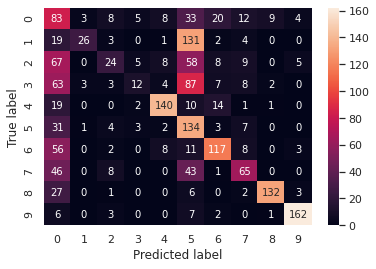

In [217]:
run_classification_hyper(OneVsRestClassifier(LinearSVC(C=10, class_weight='balanced', dual=True, 
                                                                 fit_intercept=True, intercept_scaling=1,
                                                                 loss='squared_hinge', max_iter=1000,
                                                                 multi_class='ovr', penalty='l2',
                                                                 random_state=None, tol=0.0001,
                                                                 verbose=0), 
                                             n_jobs=None), X_train, X_test, y_train, y_test, "Hypertuned LinearSVC-Glove & Agglomerative")

**SGD Classifier**

Estimator: SGDClassifier(alpha=0.0001, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='modified_huber',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l1',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 55.39%
Testing accuracy: 55.99%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.25      0.11      0.15       185
           1       0.65      0.80      0.72       186
           2       0.52      0.08      0.14       184
           3       0.26      0.41      0.32       189
           4       0.67      0.86      0.75       187
           5       0.35      0.42      0.38       185
           6       0.69      0.63      0.66       205
           7       0.50

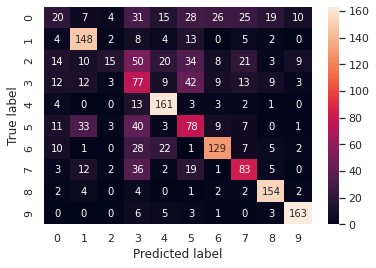

In [218]:
run_classification_hyper(SGDClassifier(alpha=0.0001, average=False, class_weight='balanced', 
                                       early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
                                       l1_ratio=0.15, learning_rate='optimal', loss='modified_huber',
                                       max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l1',
                                       power_t=0.5, random_state=None, shuffle=True, tol=0.001,
                                       validation_fraction=0.1, verbose=0, warm_start=False), X_train, X_test, y_train, y_test, "Hypertuned SGDClassifier-Glove & Agglomerative")

**Logistic Regression**

Estimator: LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 59.43%
Testing accuracy: 60.57%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.25      0.19      0.21       185
           1       0.71      0.72      0.72       186
           2       0.37      0.41      0.39       184
           3       0.46      0.34      0.39       189
           4       0.76      0.81      0.78       187
           5       0.53      0.38      0.44       185
           6       0.68      0.76      0.72       205
           7       0.46      0.69      0.56       163
           8       0.87      0.84      0.86       171
           9       0.90 

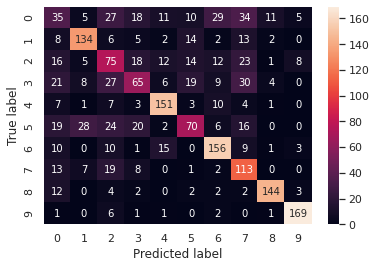

In [219]:
run_classification_hyper(LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
                                            intercept_scaling=1, l1_ratio=None, max_iter=100,
                                            multi_class='auto', n_jobs=None, penalty='l2',
                                            random_state=None, solver='newton-cg', tol=0.0001, verbose=0,
                                            warm_start=False), X_train, X_test, y_train, y_test, "Hypertuned LogisticRegression-Glove & Agglomerative")

**Random Forest Classifier**

Estimator: RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Training accuracy: 98.24%
Testing accuracy: 88.62%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.83      0.66      0.74       185
           1       0.85      0.80      0.82       186
           2       0.69      0.78      0.73       184
           3       0.81      0.86      0.83       189
           4       0.95      0.96      0.95       187
           5       0.9

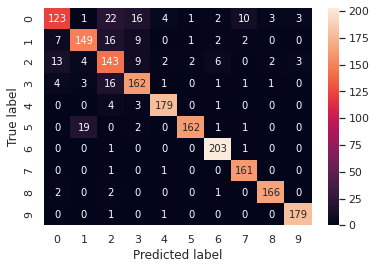

In [220]:
run_classification_hyper(RandomForestClassifier(bootstrap=True, class_weight=None,
                                                criterion='gini', max_depth=None, max_features='sqrt',
                                                max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None,
                                                min_samples_leaf=1, min_samples_split=2,
                                                min_weight_fraction_leaf=0.0, n_estimators=1000,
                                                n_jobs=None, oob_score=False, random_state=None,
                                                verbose=0, warm_start=False), X_train, X_test, y_train, y_test, "Hypertuned RandomForest-Glove & Agglomerative")

**Decision Tree Classifier**

Estimator: DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced', criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')
Training accuracy: 98.24%
Testing accuracy: 72.28%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.49      0.46      0.48       185
           1       0.74      0.77      0.76       186
           2       0.47      0.47      0.47       184
           3       0.51      0.50      0.51       189
           4       0.77      0.78      0.77       187
           5       0.78      0.76      0.77       185
           6       0.85      0.88      0.87       205
           7       0.76    

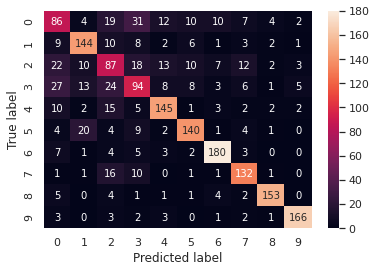

In [221]:
run_classification_hyper(DecisionTreeClassifier(class_weight='balanced', criterion='gini', 
                                                max_depth=None, max_features='auto', max_leaf_nodes=None,
                                                min_impurity_decrease=0.0, min_impurity_split=None,
                                                min_samples_leaf=1, min_samples_split=2,
                                                min_weight_fraction_leaf=0.0,
                                                random_state=None, splitter='best'), X_train, X_test, y_train, y_test, "Hypertuned DecisionTree-Glove & Agglomerative")

**K-Nearest Neighbours**

Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')
Training accuracy: 98.24%
Testing accuracy: 89.71%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.86      0.64      0.73       185
           1       0.82      0.82      0.82       186
           2       0.85      0.74      0.79       184
           3       0.82      0.92      0.87       189
           4       0.95      0.99      0.97       187
           5       0.89      0.90      0.89       185
           6       0.94      1.00      0.97       205
           7       0.88      1.00      0.94       163
           8       0.96      0.96      0.96       171
           9       0.98      0.99      0.99       181

    accuracy                           0.90      1836
   macro avg       0.90      0.90      0.89      1836
weig

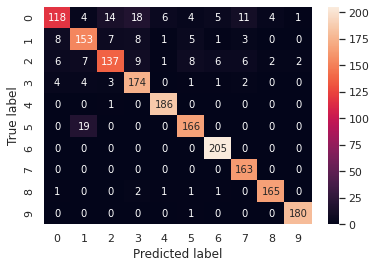

In [222]:
run_classification_hyper(KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                                              metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                                              weights='uniform'), X_train, X_test, y_train, y_test, "Hypertuned KNN-Glove & Agglomerative")

In [223]:
# add the hyper parameter details to the log table
                                     
log_hyper.loc[log_hyper['Classifier']=='Hypertuned RandomForest-Glove & Agglomerative','Best Hyper Parameters'] = 'max_features=sqrt, n_estimators=1000'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned DecisionTree-Glove & Agglomerative','Best Hyper Parameters'] = 'class_weight=balanced, criterion=entropy,max_features=auto'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned KNN-Glove & Agglomerative','Best Hyper Parameters'] = 'metric=manhattan, n_neighbors=1, weights=uniform'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned LinearSVC-Glove & Agglomerative','Best Hyper Parameters'] = 'C=10, class_weight=balanced, loss=squared_hinge, penalty=l2'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned SGDClassifier-Glove & Agglomerative','Best Hyper Parameters'] = 'class_weight=balanced, loss=modified_huber, penalty=l1'
log_hyper.loc[log_hyper['Classifier']=='Hypertuned LogisticRegression-Glove & Agglomerative','Best Hyper Parameters'] = 'C=100, penalty=l2, solver=newton-cg'

log_hyper.set_index(["Classifier"]).sort_values(by=['f1_score', 'Latency'])

,Precision,Recall,Accuracy,f1_score,Latency,Best Hyper Parameters
Classifier,,,,,,
Hypertuned LinearSVC-Glove & Agglomerative,0.610731,0.487473,0.487473,0.496323,Time taken: 79.743696s,"C=10, class_weight=balanced, loss=squared_hing..."
Hypertuned SGDClassifier-Glove & Agglomerative,0.635372,0.559913,0.559913,0.587783,Time taken: 17.057135s,"class_weight=balanced, loss=modified_huber, pe..."
Hypertuned LogisticRegression-Glove & Agglomerative,0.634445,0.605664,0.605664,0.614610,Time taken: 19.850514s,"C=100, penalty=l2, solver=newton-cg"
Hypertuned DecisionTree-Glove & Agglomerative,0.725370,0.722767,0.722767,0.723843,Time taken: 0.446603s,"class_weight=balanced, criterion=entropy,max_f..."
Hypertuned RandomForest-Glove & Agglomerative,0.891289,0.886166,0.886166,0.887131,Time taken: 161.669027s,"max_features=sqrt, n_estimators=1000"
Hypertuned KNN-Glove & Agglomerative,0.908455,0.897059,0.897059,0.900373,Time taken: 4.893574s,"metric=manhattan, n_neighbors=1, weights=uniform"


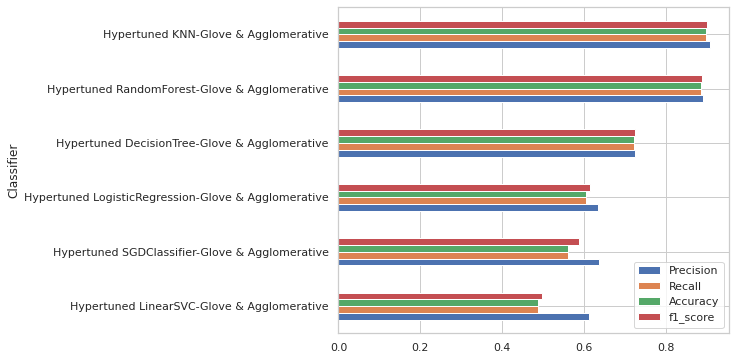

In [224]:
log_hyper.set_index(["Classifier"]).sort_values(by=['f1_score','Latency']).plot(kind='barh',figsize=[7,6])

In [225]:
tfidfk_log = pd.concat([log, log_hyper])
tfidfk_log = tfidfk_log.set_index(["Classifier"]).sort_values(by=['f1_score', 'Latency'])
pd.set_option('display.max_colwidth', None)
tfidfk_log

,Precision,Recall,Accuracy,f1_score,Latency,Best Hyper Parameters
Classifier,,,,,,
DecisionTree-TFIDF & K-Means,0.442992,0.315200,0.315200,0.364887,Time taken: 5.420702s,NaN
SGDClassifier-TFIDF & K-Means,0.560986,0.347200,0.347200,0.424513,Time taken: 2.609753s,NaN
KNN-TFIDF & K-Means,0.712125,0.380800,0.380800,0.493390,Time taken: 58.277513s,NaN
Hypertuned LinearSVC-Glove & Agglomerative,0.610731,0.487473,0.487473,0.496323,Time taken: 79.743696s,"C=10, class_weight=balanced, loss=squared_hinge, penalty=l2"
RandomForest-TFIDF & K-Means,0.814711,0.405600,0.405600,0.536639,Time taken: 14.429143s,NaN
LinearSVC-TFIDF & K-Means,0.858893,0.416000,0.416000,0.556881,Time taken: 1.469286s,NaN
SGDClassifier-Glove & Hierarchical,0.689956,0.506536,0.506536,0.573987,Time taken: 5.459641s,NaN
Hypertuned SGDClassifier-Glove & Agglomerative,0.635372,0.559913,0.559913,0.587783,Time taken: 17.057135s,"class_weight=balanced, loss=modified_huber, penalty=l1"
LogisticRegression-Glove & Hierarchical,0.616052,0.585512,0.585512,0.594379,Time taken: 2.405214s,NaN


As per above table, we can observe the hypertuned KNN and RandomForest models provide the best prediction performance. We will consider the hypertuned KNN model as our final prediction model.

In [226]:
knc_model = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan', metric_params=None, n_jobs=None, n_neighbors=1, p=2, weights='uniform')
knc_model.fit(X_train, y_train)

filename = 'finalized_model.pkl'
pickle.dump(knc_model, open(filename, 'wb'))

loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(X_test, y_test)
print(result)

0.894880174291939


##Prediction using Neural Network Models

### Classification using BERT model

BERT (Bidirectional Encoder Representations from Transformers) is a big neural network architecture, with a huge number of parameters, that can range from 100 million to over 300 million. So, training a BERT model from scratch on a small dataset would result in overfitting.
So, it is better to use a pre-trained BERT model that was trained on a huge dataset, as a starting point. We can then further train the model on our relatively smaller dataset and this process is known as model fine-tuning.
Different Fine-Tuning Techniques Train the entire architecture – We can further train the entire pre-trained model on our dataset and feed the output to a softmax layer. In this case, the error is back-propagated through the entire architecture and the pre-trained weights of the model are updated based on the new dataset. Train some layers while freezing others – Another way to use a pre-trained model is to train it partially. What we can do is keep the weights of initial layers of the model frozen while we retrain only the higher layers. We can try and test as to how many layers to be frozen and how many to be trained. Freeze the entire architecture – We can even freeze all the layers of the model and attach a few neural network layers of our own and train this new model. Note that the weights of only the attached layers will be updated during model training.


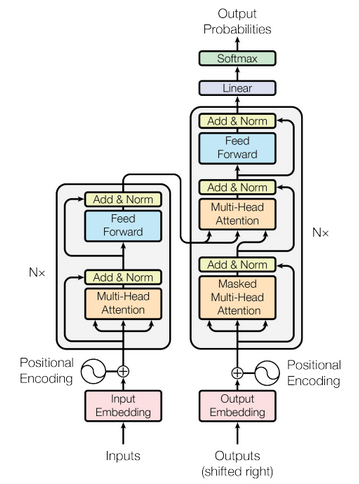

The Transformer – Model Architecture (Source: https://arxiv.org/abs/1706.03762

In [227]:
!wget https://storage.googleapis.com/bert_models/2018_10_18/uncased_L-12_H-768_A-12.zip

--2021-01-10 10:54:35--  https://storage.googleapis.com/bert_models/2018_10_18/uncased_L-12_H-768_A-12.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.126.128, 108.177.127.128, 172.217.218.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.126.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 407727028 (389M) [application/zip]
Saving to: ‘uncased_L-12_H-768_A-12.zip.3’

uncased_L-12_H-768_ 100%[===================>] 388.84M  64.2MB/s    in 6.1s    

2021-01-10 10:54:42 (63.3 MB/s) - ‘uncased_L-12_H-768_A-12.zip.3’ saved [407727028/407727028]



In [228]:
!unzip uncased_L-12_H-768_A-12.zip

Archive:  uncased_L-12_H-768_A-12.zip
   creating: uncased_L-12_H-768_A-12/
  inflating: uncased_L-12_H-768_A-12/bert_model.ckpt.meta  
  inflating: uncased_L-12_H-768_A-12/bert_model.ckpt.data-00000-of-00001  
  inflating: uncased_L-12_H-768_A-12/vocab.txt  
  inflating: uncased_L-12_H-768_A-12/bert_model.ckpt.index  
  inflating: uncased_L-12_H-768_A-12/bert_config.json  


In [229]:
os.makedirs('model', exist_ok=True)

In [230]:
!mv uncased_L-12_H-768_A-12/ model

In [231]:
bert_model_name = 'uncased_L-12_H-768_A-12'
bert_ckpt_dir = os.path.join('model/',bert_model_name)
bert_ckpt_file = os.path.join(bert_ckpt_dir, 'bert_model.ckpt')
bert_config_file = os.path.join(bert_ckpt_dir, 'bert_config.json')

In [232]:
bert_ckpt_file

'model/uncased_L-12_H-768_A-12/bert_model.ckpt'

1. The BERT model has been imported above.
2. We make use of the Bert FullTokenizer to generate embedding for our input tokens.
3. Next, we decide the model architecture and define the layers.
4. Lastly, we compile the BERT model with the optimizer and fit our training data.

In [233]:
tokenizer = FullTokenizer(vocab_file = os.path.join(bert_ckpt_dir, 'vocab.txt'))
tokens = tokenizer.tokenize("hello guys, my first project is great!")
tokenizer.convert_tokens_to_ids(tokens)

[7592, 4364, 1010, 2026, 2034, 2622, 2003, 2307, 999]

In [234]:
import tensorflow.compat.v1 as tf

In [235]:
class TicketAssgnData:
  DATA_COLUMN = 'tokens'
  LABEL_COLUMN = 'class'

  def __init__(self, train, test, tokenizer: FullTokenizer, classes, max_seq_len=350):
    self.tokenizer = tokenizer
    self.max_seq_len = 0
    self.classes = classes

    ((self.train_x, self.train_y), (self.test_x, self.test_y)) = map(self._prepare, [train, test])

    self.max_seq_len = min(self.max_seq_len, max_seq_len)
    self.train_x, self.test_x = map(self._pad, [self.train_x, self.test_x])

  def _prepare(self, df):
    x, y = [], []

    for _, row in tqdm(df.iterrows()):
      text, label = row[TicketAssgnData.DATA_COLUMN], row[TicketAssgnData.LABEL_COLUMN]
      tokens = self.tokenizer.tokenize(text)
      tokens = ["[CLS]"] + tokens + ["[SEP]"]
      token_ids = self.tokenizer.convert_tokens_to_ids(tokens)
      self.max_seq_len = max(self.max_seq_len, len(token_ids))
      
      x.append(token_ids)
      y.append(self.classes.index(label))
    return np.array(x), np.array(y)

  def _pad(self, ids):
    x= []
    for input_ids in ids:
      cut_point = min(len(input_ids), self.max_seq_len - 2)
      input_ids = input_ids[:cut_point]
      
      input_ids = input_ids + [0] * (self.max_seq_len - len(input_ids))
      x.append(np.array(input_ids))
    return np.array(x)


In [236]:
def create_model(max_seq_len, bert_config_file, bert_ckpt_file):

  with tf.gfile.GFile(bert_config_file, 'r') as reader:
    bc = StockBertConfig.from_json_string(reader.read())
    bert_params = map_stock_config_to_params(bc)
    bert_params.adapter_size = None
    bert = BertModelLayer.from_params(bert_params, name='bert')

  input_ids = keras.layers.Input(shape=(max_seq_len,),dtype='int32',name='input_ids')
  bert_output = bert(input_ids)

  print('bert shape', bert_output.shape)
 
  cls_out = keras.layers.Lambda(lambda seq: seq[:, 0, :])(bert_output)
  cls_out = keras.layers.Dropout(0.5)(cls_out)
  logits = keras.layers.Dense(units=768, activation='tanh')(cls_out)
  logits = keras.layers.Dropout(0.5)(logits)
  logits = keras.layers.Dense(units=len(classes), activation='softmax')(logits)

  model = keras.Model(inputs=input_ids, outputs=logits)
  model.build(input_shape=(None, max_seq_len))

  load_stock_weights(bert, bert_ckpt_file)

  return model


In [ ]:
train, test = train_test_split(incidents_cosine[['tokens','class']], test_size=0.25, random_state=10)

train.reset_index(drop=True,inplace=True)
test.reset_index(drop=True,inplace=True)

In [ ]:
classes = train['class'].unique().tolist()

data = TicketAssgnData(train, test, tokenizer, classes, max_seq_len=350)

3237it [00:01, 1691.15it/s]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
1079it [00:00, 1799.99it/s]


In [ ]:
pip install pandas_datareader

In [ ]:
model = create_model(data.max_seq_len, bert_config_file, bert_ckpt_file)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

bert shape (None, 350, 768)


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


Done loading 196 BERT weights from: model/uncased_L-12_H-768_A-12/bert_model.ckpt into <bert.model.BertModelLayer object at 0x7f8c0b9c5b00> (prefix:bert). Count of weights not found in the checkpoint was: [0]. Count of weights with mismatched shape: [0]
Unused weights from checkpoint: 
	bert/embeddings/token_type_embeddings
	bert/pooler/dense/bias
	bert/pooler/dense/kernel
	cls/predictions/output_bias
	cls/predictions/transform/LayerNorm/beta
	cls/predictions/transform/LayerNorm/gamma
	cls/predictions/transform/dense/bias
	cls/predictions/transform/dense/kernel
	cls/seq_relationship/output_bias
	cls/seq_relationship/output_weights


In [ ]:
data.train_x.shape

(3237, 350)

In [ ]:
data.train_y[50]

1

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_ids (InputLayer)       [(None, 350)]             0         
_________________________________________________________________
bert (BertModelLayer)        (None, 350, 768)          108890112 
_________________________________________________________________
lambda (Lambda)              (None, 768)               0         
_________________________________________________________________
dropout (Dropout)            (None, 768)               0         
_________________________________________________________________
dense (Dense)                (None, 768)               590592    
_________________________________________________________________
dropout_1 (Dropout)          (None, 768)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                7690  

In [ ]:
model.compile(
    optimizer=keras.optimizers.Adam(1e-5),
    loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name='acc')]
)

In [ ]:
log_dir = 'log/ticket_classif' + datetime.datetime.now().strftime("%Y%m%d-%H%M%s")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir)

history = model.fit(
    x=data.train_x,
    y=data.train_y,
    validation_split=0.1,
    batch_size=16,
    shuffle=True,
    epochs=5,
    callbacks=[tensorboard_callback]
)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


Epoch 1/5


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

183/183 [==============================] - ETA: 0s - loss: 2.0028 - acc: 0.4689

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

183/183 [==============================] - 306s 2s/step - loss: 2.0028 - acc: 0.4689 - val_loss: 1.9163 - val_acc: 0.5432
Epoch 2/5
183/183 [==============================] - ETA: 0s - loss: 1.9184 - acc: 0.5448

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


183/183 [==============================] - 301s 2s/step - loss: 1.9184 - acc: 0.5448 - val_loss: 1.9124 - val_acc: 0.5494
Epoch 3/5
183/183 [==============================] - ETA: 0s - loss: 1.9169 - acc: 0.5451

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


183/183 [==============================] - 300s 2s/step - loss: 1.9169 - acc: 0.5451 - val_loss: 1.9073 - val_acc: 0.5525
Epoch 4/5
183/183 [==============================] - ETA: 0s - loss: 1.9150 - acc: 0.5472

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


183/183 [==============================] - 300s 2s/step - loss: 1.9150 - acc: 0.5472 - val_loss: 1.9120 - val_acc: 0.5494
Epoch 5/5
183/183 [==============================] - ETA: 0s - loss: 1.9121 - acc: 0.5496

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


183/183 [==============================] - 299s 2s/step - loss: 1.9121 - acc: 0.5496 - val_loss: 1.9089 - val_acc: 0.5525


In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir log

<IPython.core.display.Javascript object>

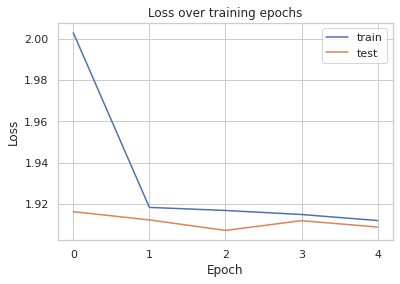

In [ ]:
ax = plt.figure().gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

ax.plot(history.history['loss'])
ax.plot(history.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'test'])
plt.title('Loss over training epochs')
plt.show();

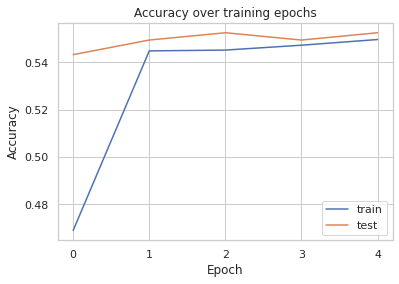

In [ ]:
ax = plt.figure().gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

ax.plot(history.history['acc'])
ax.plot(history.history['val_acc'])
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'test'])
plt.title('Accuracy over training epochs')
plt.show();

In [ ]:
_, train_acc = model.evaluate(data.train_x, data.train_y)
_, test_acc = model.evaluate(data.test_x, data.test_y)

print("train acc", train_acc)
print("test acc", test_acc)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


102/102 [==============================] - 97s 949ms/step - loss: 1.9085 - acc: 0.5527


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


34/34 [==============================] - 32s 930ms/step - loss: 1.8955 - acc: 0.5663
train acc 0.5526722073554993
test acc 0.5662650465965271


In [ ]:
y_pred = model.predict(data.test_x).argmax(axis=1)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

In [ ]:
res = " ".join([str(i) for i in classes])

In [ ]:
print(classification_report(data.test_y, y_pred, labels=classes))

              precision    recall  f1-score   support

           2       0.44      0.98      0.61       351
           1       0.88      0.81      0.85       321
           0       0.86      0.03      0.05       215
           3       0.00      0.00      0.00        57
           4       0.00      0.00      0.00        39
           5       0.00      0.00      0.00        32
           6       0.00      0.00      0.00        17
           7       0.00      0.00      0.00        14
           9       0.00      0.00      0.00        19
           8       0.00      0.00      0.00        14

    accuracy                           0.57      1079
   macro avg       0.22      0.18      0.15      1079
weighted avg       0.58      0.57      0.46      1079



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [ ]:
cm = confusion_matrix(data.test_y, y_pred)
df_cm = pd.DataFrame(cm, index=classes, columns=classes)

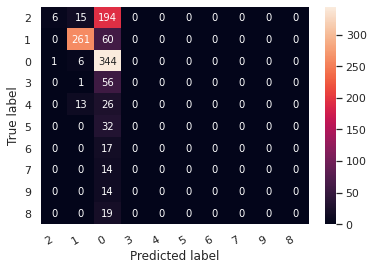

In [ ]:
hmap = sns.heatmap(df_cm, annot=True, fmt="d")
hmap.yaxis.set_ticklabels(hmap.yaxis.get_ticklabels(), rotation=0, ha='right')
hmap.xaxis.set_ticklabels(hmap.xaxis.get_ticklabels(), rotation=30, ha='right')
plt.ylabel('True label')
plt.xlabel('Predicted label');

Clearly, the prediction is dominated by classes 0 and 1 due to imbalanced input data. We need to train our model with a fairly balanced data.

In [ ]:
sentences = [
"verified user details employee manager name checked the user name in ad and reset the password advised the user to login and check caller confirmed that he was able to login issue resolved"
]

pred_tokens = map(tokenizer.tokenize, sentences)
pred_tokens = map(lambda tok: ["[CLS]"] + tok + ["[SEP]"], pred_tokens)
pred_token_ids = list(map(tokenizer.convert_tokens_to_ids, pred_tokens))

pred_token_ids = map(lambda tids: tids +[0]*(data.max_seq_len-len(tids)),pred_token_ids)
pred_token_ids = np.array(list(pred_token_ids))

predictions = model.predict(pred_token_ids).argmax(axis=-1)

for text, label in zip(sentences, predictions):
  print("ticket:", text, "\nassignment group:", classes[label])
  print()

ticket: verified user details employee manager name checked the user name in ad and reset the password advised the user to login and check caller confirmed that he was able to login issue resolved 
assignment group: 0



/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


###BiDirectional LSTM for prediction

#### Prediction using Word2Vec embedding and LSTM architecture

In [ ]:
sentences = [line.split(' ') for line in incidents_cosine['tokens']]
word2vec = Word2Vec(sentences=sentences,min_count=1)
word2vec.wv.save_word2vec_format(project_path+ 'word2vec_vector.txt')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:471: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)


In [ ]:
embeddings_index = dict()
f = open(project_path+'word2vec_vector.txt')

for line in f:
	values = line.split()
	word = values[0]
	coefs = np.asarray(values[1:], dtype='float32')
	embeddings_index[word] = coefs
f.close()
print('Loaded %s word vectors.' % len(embeddings_index))

Loaded 9277 word vectors.


In [ ]:
class LstmModel:
  model= Model()
  X_test=[]
  y_test=[]
  embedding_matrix=[]

  def wordTokenizer(self, dataframe):
    tokenizer = Tokenizer(num_words=numWords,filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',lower=True,split=' ', char_level=False)
    tokenizer.fit_on_texts(dataframe)
    dataframe = tokenizer.texts_to_sequences(dataframe)
    return tokenizer,dataframe
  
  def splitData(self,X,y):

    print("Number of Samples:", len(X))
    print("Number of Labels: ", len(y))
    X_train, self.X_test, y_train, self.y_test = train_test_split(X, y, test_size=0.2, random_state=10)
    X_train, X_Val, y_train, y_Val = train_test_split(X, y, test_size=0.2, random_state=10)
    print("Number of train Samples:", len(X_train))
    print("Number of val Samples:", len(X_Val))

    return X_train, self.X_test, y_train, self.y_test, X_Val, y_Val

  def tokenizeAndEmbedding(self,dataframe):
    
    tokenizer,X = self.wordTokenizer(dataframe['tokens'])
    y = np.asarray(dataframe['class'])
    X = pad_sequences(X, maxlen = maxlen)

    self.embedding_matrix = np.zeros((numWords+1, 100))
    for i,word in tokenizer.index_word.items():
      if i<numWords+1:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            self.embedding_matrix[i] = embedding_vector
    return X,y

  def train(self, dataframe, batch_size, epochs):
   
    X,y = self.tokenizeAndEmbedding(dataframe)
    X_train, _, y_train, _, X_Val, y_Val = self.splitData(X,y)
    model_history = self.fitModel(X_train,y_train,X_Val,y_Val,batch_size, epochs)
    return model_history

  def fitModel(self,X_train,y_train,X_Val,y_Val,batch_size, epochs):
    
    input_layer = Input(shape=(maxlen,),dtype=tf.int64)
    embed = Embedding(numWords+1,output_dim=100,input_length=maxlen,weights=[self.embedding_matrix], trainable=True)(input_layer)
    lstm=Bidirectional(LSTM(128))(embed)
    drop=Dropout(0.3)(lstm)
    dense =Dense(100,activation='relu')(drop)
    out=Dense(len((pd.Series(y_train)).unique()),activation='softmax')(dense)   

    self.model = Model(input_layer,out)
    self.model.compile(loss='sparse_categorical_crossentropy',optimizer="adam",metrics=['accuracy'])

    self.model.summary()
    plot_model(self.model,to_file="LSTM_Model.jpg")

    checkpoint = ModelCheckpoint('model-{epoch:03d}-{val_accuracy:03f}.h5', verbose=1, monitor='val_accuracy',save_best_only=True, mode='auto') 
    reduceLoss = ReduceLROnPlateau(monitor='val_loss', factor=0.2,patience=2, min_lr=0.0001)
    model_history = self.model.fit(X_train,y_train,batch_size=batch_size, epochs=epochs, callbacks=[checkpoint,reduceLoss], validation_data=(X_Val,y_Val))

    return model_history,self.model

  def prediction(self):
      
     pred = self.model.predict(self.X_test)
     pred = [i.argmax() for i in pred]
     accuracy = metrics.accuracy_score(self.y_test, pred)
     print("Precision:",metrics.precision_recall_fscore_support(self.y_test, pred, average='weighted'))
     print(classification_report(self.y_test, pred))
     print("Accuracy of the model :",metrics.accuracy_score(self.y_test, pred))
     return accuracy

  def plotModelAccuracy(self, history, modelname):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])

    plt.title(modelname+' model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])

    plt.title(modelname+' model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

In [ ]:
maxlen = 300
numWords=9000
epochs = 10

lstmModel = LstmModel()
lstmModel_history, model = lstmModel.train(incidents_clust,100,epochs)
lstm_accuracy = lstmModel.prediction()

Number of Samples: 8063
Number of Labels:  8063
Number of train Samples: 6450
Number of val Samples: 1613


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 300)]             0         
_________________________________________________________________
embedding (Embedding)        (None, 300, 100)          900100    
_________________________________________________________________
bidirectional (Bidirectional (None, 256)               234496    
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               25700     
_________________________________________________________________
dense_3 (Dense)              (None, 10)                1010      
Total params: 1,161,306
Trainable params: 1,161,306
Non-trainable params: 0
_________________________________________________

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

Epoch 1/10


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

64/65 [============================>.] - ETA: 0s - loss: 1.0932 - accuracy: 0.7242

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t


Epoch 00001: val_accuracy improved from -inf to 0.75945, saving model to model-001-0.759454.h5
65/65 [==============================] - 5s 71ms/step - loss: 1.0919 - accuracy: 0.7245 - val_loss: 0.8678 - val_accuracy: 0.7595 - lr: 0.0010
Epoch 2/10
64/65 [============================>.] - ETA: 0s - loss: 0.8729 - accuracy: 0.7608

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00002: val_accuracy improved from 0.75945 to 0.76813, saving model to model-002-0.768134.h5
65/65 [==============================] - 4s 60ms/step - loss: 0.8716 - accuracy: 0.7611 - val_loss: 0.8027 - val_accuracy: 0.7681 - lr: 0.0010
Epoch 3/10
64/65 [============================>.] - ETA: 0s - loss: 0.7609 - accuracy: 0.7887

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00003: val_accuracy improved from 0.76813 to 0.79479, saving model to model-003-0.794792.h5
65/65 [==============================] - 4s 60ms/step - loss: 0.7608 - accuracy: 0.7887 - val_loss: 0.7488 - val_accuracy: 0.7948 - lr: 0.0010
Epoch 4/10
64/65 [============================>.] - ETA: 0s - loss: 0.6574 - accuracy: 0.8178

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00004: val_accuracy improved from 0.79479 to 0.80285, saving model to model-004-0.802852.h5
65/65 [==============================] - 4s 61ms/step - loss: 0.6593 - accuracy: 0.8171 - val_loss: 0.6628 - val_accuracy: 0.8029 - lr: 0.0010
Epoch 5/10
64/65 [============================>.] - ETA: 0s - loss: 0.5661 - accuracy: 0.8384

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00005: val_accuracy improved from 0.80285 to 0.81773, saving model to model-005-0.817731.h5
65/65 [==============================] - 4s 62ms/step - loss: 0.5655 - accuracy: 0.8388 - val_loss: 0.6359 - val_accuracy: 0.8177 - lr: 0.0010
Epoch 6/10
64/65 [============================>.] - ETA: 0s - loss: 0.4519 - accuracy: 0.8678

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00006: val_accuracy improved from 0.81773 to 0.82393, saving model to model-006-0.823931.h5
65/65 [==============================] - 4s 61ms/step - loss: 0.4529 - accuracy: 0.8678 - val_loss: 0.6539 - val_accuracy: 0.8239 - lr: 0.0010
Epoch 7/10
64/65 [============================>.] - ETA: 0s - loss: 0.3857 - accuracy: 0.8867

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00007: val_accuracy improved from 0.82393 to 0.82827, saving model to model-007-0.828270.h5
65/65 [==============================] - 4s 61ms/step - loss: 0.3865 - accuracy: 0.8865 - val_loss: 0.6310 - val_accuracy: 0.8283 - lr: 0.0010
Epoch 8/10
64/65 [============================>.] - ETA: 0s - loss: 0.3373 - accuracy: 0.9011

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00008: val_accuracy did not improve from 0.82827
65/65 [==============================] - 4s 60ms/step - loss: 0.3373 - accuracy: 0.9014 - val_loss: 0.6904 - val_accuracy: 0.8128 - lr: 0.0010
Epoch 9/10
64/65 [============================>.] - ETA: 0s - loss: 0.2906 - accuracy: 0.9114

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00009: val_accuracy did not improve from 0.82827
65/65 [==============================] - 4s 59ms/step - loss: 0.2908 - accuracy: 0.9113 - val_loss: 0.8120 - val_accuracy: 0.8053 - lr: 0.0010
Epoch 10/10
64/65 [============================>.] - ETA: 0s - loss: 0.2337 - accuracy: 0.9308

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00010: val_accuracy did not improve from 0.82827
65/65 [==============================] - 4s 58ms/step - loss: 0.2339 - accuracy: 0.9307 - val_loss: 0.7795 - val_accuracy: 0.8202 - lr: 2.0000e-04


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

Precision: (0.8077613880532639, 0.8202107873527589, 0.8115974576712972, None)
              precision    recall  f1-score   support

           0       0.86      0.92      0.89      1011
           1       0.90      0.88      0.89       257
           2       0.60      0.49      0.54       179
           3       0.80      0.78      0.79        51
           4       0.34      0.35      0.35        31
           5       0.42      0.25      0.31        40
           6       0.28      0.42      0.33        12
           7       1.00      0.50      0.67        12
           8       0.88      0.88      0.88         8
           9       0.00      0.00      0.00        12

    accuracy                           0.82      1613
   macro avg       0.61      0.55      0.57      1613
weighted avg       0.81      0.82      0.81      1613

Accuracy of the model : 0.8202107873527589


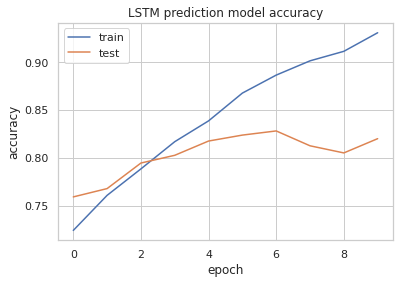

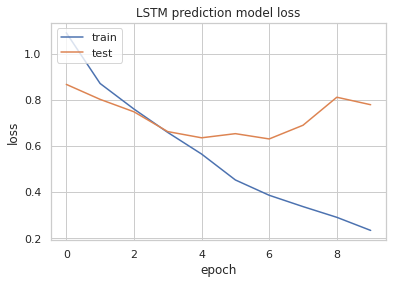

In [ ]:
lstmModel.plotModelAccuracy(lstmModel_history, 'LSTM prediction')

As we can observe, the LSTM model has not improved over 80% accuracy as it trained.

#### Prediction using Glove embedding and LSTM architecture

In [ ]:
class LstmGloveModel:
  model= Model()
  X_test=[]
  y_test=[]
  embedding_matrix=[]

  def wordTokenizer(self, dataframe):
    tokenizer = Tokenizer(num_words=numWords,filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',lower=True,split=' ', char_level=False)
    tokenizer.fit_on_texts(dataframe)
    dataframe = tokenizer.texts_to_sequences(dataframe)
    return tokenizer,dataframe
  
  def splitData(self,X,y):

    print("Number of Samples:", len(X))
    print("Number of Labels: ", len(y))
    X_train, self.X_test, y_train, self.y_test = train_test_split(X, y, test_size=0.2, random_state=10) # changed by Abraham
    X_train, X_Val, y_train, y_Val = train_test_split(X, y, test_size=0.2, random_state=10)
    print("Number of train Samples:", len(X_train))
    print("Number of val Samples:", len(X_Val))

    return X_train, self.X_test, y_train, self.y_test, X_Val, y_Val

  def tokenizeAndEmbedding(self,dataframe):
    
    tokenizer,X = self.wordTokenizer(dataframe['tokens'])
    y = np.asarray(dataframe['class'])
    X = pad_sequences(X, maxlen = maxlen)

    self.embedding_matrix = np.zeros((numWords+1, 300))
    for i,word in tokenizer.index_word.items():
      if i<numWords+1:
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            self.embedding_matrix[i] = embedding_vector
    return X,y

  def train(self, dataframe, batch_size, epochs):
   
    X,y = self.tokenizeAndEmbedding(dataframe)
    X_train, _, y_train, _, X_Val, y_Val = self.splitData(X,y)
    model_history = self.fitModel(X_train,y_train,X_Val,y_Val,batch_size, epochs)
    return model_history

  def fitModel(self,X_train,y_train,X_Val,y_Val,batch_size, epochs):
    
    input_layer = Input(shape=(maxlen,),dtype=tf.int64)
    embed = Embedding(numWords+1,output_dim=300,input_length=maxlen,weights=[self.embedding_matrix], trainable=True)(input_layer)
    lstm=Bidirectional(LSTM(128))(embed)
    drop=Dropout(0.3)(lstm)
    dense =Dense(100,activation='relu')(drop)
    out=Dense(len((pd.Series(y_train)).unique()),activation='softmax')(dense)   

    self.model = Model(input_layer,out)
    self.model.compile(loss='sparse_categorical_crossentropy',optimizer="adam",metrics=['accuracy'])

    checkpoint = ModelCheckpoint('model-{epoch:03d}-{val_accuracy:03f}.h5', verbose=1, monitor='val_accuracy',save_best_only=True, mode='auto') 
    reduceLoss = ReduceLROnPlateau(monitor='val_loss', factor=0.2,patience=2, min_lr=0.0001)
    model_history = self.model.fit(X_train,y_train,batch_size=batch_size, epochs=epochs, callbacks=[checkpoint,reduceLoss], validation_data=(X_Val,y_Val))
    return model_history,self.model

  def prediction(self):
      
     pred = self.model.predict(self.X_test)
     pred = [i.argmax() for i in pred]
     print("Precision:",metrics.precision_recall_fscore_support(self.y_test, pred, average='weighted'))
     print(classification_report(self.y_test, pred))
     accuracy = metrics.accuracy_score(self.y_test, pred)
     print("Accuracy of the model :",accuracy)
     return accuracy

  def plotModelAccuracy(self, history, modelname):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])

    plt.title(modelname+' model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])

    plt.title(modelname+' model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

In [ ]:
maxlen = 300
numWords=9000
epochs = 10

lstmModel2 = LstmGloveModel()
lstmModel2_history, model = lstmModel2.train(incidents_clust,100,epochs)
lstm2_accuracy = lstmModel2.prediction()

Number of Samples: 8063
Number of Labels:  8063
Number of train Samples: 6450
Number of val Samples: 1613


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

Epoch 1/10


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

65/65 [==============================] - ETA: 0s - loss: 1.0227 - accuracy: 0.7366

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t


Epoch 00001: val_accuracy improved from -inf to 0.77743, saving model to model-001-0.777433.h5
65/65 [==============================] - 7s 105ms/step - loss: 1.0227 - accuracy: 0.7366 - val_loss: 0.7513 - val_accuracy: 0.7774 - lr: 0.0010
Epoch 2/10
65/65 [==============================] - ETA: 0s - loss: 0.6858 - accuracy: 0.8022

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00002: val_accuracy improved from 0.77743 to 0.80037, saving model to model-002-0.800372.h5
65/65 [==============================] - 6s 95ms/step - loss: 0.6858 - accuracy: 0.8022 - val_loss: 0.6326 - val_accuracy: 0.8004 - lr: 0.0010
Epoch 3/10
65/65 [==============================] - ETA: 0s - loss: 0.5240 - accuracy: 0.8456

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00003: val_accuracy improved from 0.80037 to 0.82269, saving model to model-003-0.822691.h5
65/65 [==============================] - 6s 95ms/step - loss: 0.5240 - accuracy: 0.8456 - val_loss: 0.5772 - val_accuracy: 0.8227 - lr: 0.0010
Epoch 4/10
65/65 [==============================] - ETA: 0s - loss: 0.3953 - accuracy: 0.8825

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00004: val_accuracy did not improve from 0.82269
65/65 [==============================] - 6s 94ms/step - loss: 0.3953 - accuracy: 0.8825 - val_loss: 0.6036 - val_accuracy: 0.8177 - lr: 0.0010
Epoch 5/10
65/65 [==============================] - ETA: 0s - loss: 0.3201 - accuracy: 0.9079

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00005: val_accuracy did not improve from 0.82269
65/65 [==============================] - 6s 93ms/step - loss: 0.3201 - accuracy: 0.9079 - val_loss: 0.6152 - val_accuracy: 0.8184 - lr: 0.0010
Epoch 6/10
65/65 [==============================] - ETA: 0s - loss: 0.2127 - accuracy: 0.9426

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00006: val_accuracy improved from 0.82269 to 0.82765, saving model to model-006-0.827650.h5
65/65 [==============================] - 6s 95ms/step - loss: 0.2127 - accuracy: 0.9426 - val_loss: 0.6301 - val_accuracy: 0.8277 - lr: 2.0000e-04
Epoch 7/10
65/65 [==============================] - ETA: 0s - loss: 0.1846 - accuracy: 0.9512

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00007: val_accuracy improved from 0.82765 to 0.82827, saving model to model-007-0.828270.h5
65/65 [==============================] - 7s 101ms/step - loss: 0.1846 - accuracy: 0.9512 - val_loss: 0.6826 - val_accuracy: 0.8283 - lr: 2.0000e-04
Epoch 8/10
65/65 [==============================] - ETA: 0s - loss: 0.1660 - accuracy: 0.9561

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00008: val_accuracy improved from 0.82827 to 0.82889, saving model to model-008-0.828890.h5
65/65 [==============================] - 6s 95ms/step - loss: 0.1660 - accuracy: 0.9561 - val_loss: 0.6820 - val_accuracy: 0.8289 - lr: 1.0000e-04
Epoch 9/10
65/65 [==============================] - ETA: 0s - loss: 0.1592 - accuracy: 0.9589

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00009: val_accuracy improved from 0.82889 to 0.83013, saving model to model-009-0.830130.h5
65/65 [==============================] - 6s 95ms/step - loss: 0.1592 - accuracy: 0.9589 - val_loss: 0.7020 - val_accuracy: 0.8301 - lr: 1.0000e-04
Epoch 10/10
65/65 [==============================] - ETA: 0s - loss: 0.1469 - accuracy: 0.9629

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00010: val_accuracy did not improve from 0.83013
65/65 [==============================] - 6s 93ms/step - loss: 0.1469 - accuracy: 0.9629 - val_loss: 0.7217 - val_accuracy: 0.8283 - lr: 1.0000e-04


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

Precision: (0.8167969532785888, 0.8282703037817731, 0.8198575674095866, None)
              precision    recall  f1-score   support

           0       0.87      0.92      0.89      1011
           1       0.88      0.91      0.90       257
           2       0.61      0.46      0.53       179
           3       0.80      0.76      0.78        51
           4       0.44      0.45      0.44        31
           5       0.48      0.35      0.41        40
           6       0.62      0.42      0.50        12
           7       1.00      0.83      0.91        12
           8       1.00      0.88      0.93         8
           9       0.50      0.17      0.25        12

    accuracy                           0.83      1613
   macro avg       0.72      0.62      0.65      1613
weighted avg       0.82      0.83      0.82      1613

Accuracy of the model : 0.8282703037817731


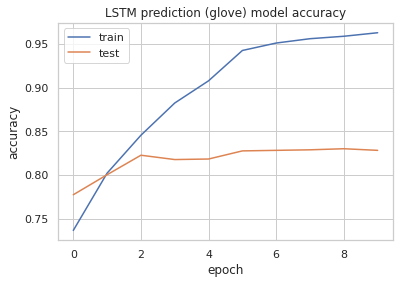

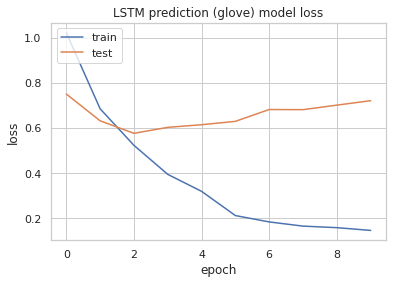

In [ ]:
lstmModel2.plotModelAccuracy(lstmModel2_history, 'LSTM prediction (glove)')

The same case is observed when using the GLOVE embeddings for training with LSTM.

### Prediction using GRU model

In [ ]:
class GruGloveModel:
  model= Model()
  X_test=[]
  y_test=[]
  embedding_matrix=[]

  def wordTokenizer(self, dataframe):
    tokenizer = Tokenizer(num_words=numWords,filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',lower=True,split=' ', char_level=False)
    tokenizer.fit_on_texts(dataframe)
    dataframe = tokenizer.texts_to_sequences(dataframe)
    return tokenizer,dataframe
  
  def splitData(self,X,y):

    print("Number of Samples:", len(X))
    print("Number of Labels: ", len(y))
    X_train, self.X_test, y_train, self.y_test = train_test_split(X, y, test_size=0.2, random_state=10)
    X_train, X_Val, y_train, y_Val = train_test_split(X, y, test_size=0.2, random_state=10)
    print("Number of train Samples:", len(X_train))
    print("Number of val Samples:", len(X_Val))

    return X_train, self.X_test, y_train, self.y_test, X_Val, y_Val

  def tokenizeAndEmbedding(self,dataframe):
    
    tokenizer,X = self.wordTokenizer(dataframe['tokens'])
    y = np.asarray(dataframe['class'])
    X = pad_sequences(X, maxlen = maxlen)

    self.embedding_matrix = np.zeros((numWords+1, 100))
    for i,word in tokenizer.index_word.items():
      if i<numWords+1:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            self.embedding_matrix[i] = embedding_vector
    return X,y

  def train(self, dataframe, batch_size, epochs):
   
    X,y = self.tokenizeAndEmbedding(dataframe)
    X_train, _, y_train, _, X_Val, y_Val = self.splitData(X,y)
    model_history = self.fitModel(X_train,y_train,X_Val,y_Val,batch_size, epochs)
    return model_history

  def fitModel(self,X_train,y_train,X_Val,y_Val,batch_size, epochs):
    
    input_layer = Input(shape=(maxlen,),dtype=tf.int64)
    embed = Embedding(numWords+1,output_dim=100,input_length=maxlen,weights=[self.embedding_matrix], trainable=True)(input_layer)
    gru=GRU(128)(embed)
    drop=Dropout(0.3)(gru)
    dense =Dense(100,activation='relu')(drop)
    out=Dense(len((pd.Series(y_train)).unique()),activation='softmax')(dense)   

    self.model = Model(input_layer,out)
    self.model.compile(loss='sparse_categorical_crossentropy',optimizer="adam",metrics=['accuracy'])

    checkpoint = ModelCheckpoint('model-{epoch:03d}-{val_accuracy:03f}.h5', verbose=1, monitor='val_accuracy',save_best_only=True, mode='auto') 
    reduceLoss = ReduceLROnPlateau(monitor='val_loss', factor=0.2,patience=2, min_lr=0.0001)
    model_history = self.model.fit(X_train,y_train,batch_size=batch_size, epochs=epochs, callbacks=[checkpoint,reduceLoss], validation_data=(X_Val,y_Val))
    return model_history,self.model

  def prediction(self):
      
     pred = self.model.predict(self.X_test)
     pred = [i.argmax() for i in pred]
     print("Precision:",metrics.precision_recall_fscore_support(self.y_test, pred, average='weighted'))
     print(classification_report(self.y_test, pred))
     accuracy=metrics.accuracy_score(self.y_test, pred)
     print("Accuracy of the model :",accuracy)
     return accuracy

  def plotModelAccuracy(self, history, modelname):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])

    plt.title(modelname+' model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])

    plt.title(modelname+' model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

  def plotModel(self):
    self.model.summary()

In [ ]:
gruModel = GruGloveModel()
gruModel_history, model = gruModel.train(incidents_clust,100,epochs)
gru_accuracy = gruModel.prediction()

Number of Samples: 8063
Number of Labels:  8063
Number of train Samples: 6450
Number of val Samples: 1613


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

Epoch 1/10


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

65/65 [==============================] - ETA: 0s - loss: 1.1091 - accuracy: 0.7102

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t


Epoch 00001: val_accuracy improved from -inf to 0.75883, saving model to model-001-0.758834.h5
65/65 [==============================] - 3s 41ms/step - loss: 1.1091 - accuracy: 0.7102 - val_loss: 0.8660 - val_accuracy: 0.7588 - lr: 0.0010
Epoch 2/10
65/65 [==============================] - ETA: 0s - loss: 0.8571 - accuracy: 0.7654
Epoch 00002: val_accuracy improved from 0.75883 to 0.77433, saving model to model-002-0.774334.h5


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


65/65 [==============================] - 2s 34ms/step - loss: 0.8571 - accuracy: 0.7654 - val_loss: 0.7807 - val_accuracy: 0.7743 - lr: 0.0010
Epoch 3/10
65/65 [==============================] - ETA: 0s - loss: 0.7234 - accuracy: 0.7984

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00003: val_accuracy improved from 0.77433 to 0.80719, saving model to model-003-0.807192.h5
65/65 [==============================] - 2s 35ms/step - loss: 0.7234 - accuracy: 0.7984 - val_loss: 0.7067 - val_accuracy: 0.8072 - lr: 0.0010
Epoch 4/10
65/65 [==============================] - ETA: 0s - loss: 0.5649 - accuracy: 0.8488

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00004: val_accuracy improved from 0.80719 to 0.81401, saving model to model-004-0.814011.h5
65/65 [==============================] - 2s 35ms/step - loss: 0.5649 - accuracy: 0.8488 - val_loss: 0.6667 - val_accuracy: 0.8140 - lr: 0.0010
Epoch 5/10
65/65 [==============================] - ETA: 0s - loss: 0.4566 - accuracy: 0.8721
Epoch 00005: val_accuracy did not improve from 0.81401
65/65 [==============================] - 2s 34ms/step - loss: 0.4566 - accuracy: 0.8721 - val_loss: 0.7111 - val_accuracy: 0.7979 - lr: 0.0010


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


Epoch 6/10
64/65 [============================>.] - ETA: 0s - loss: 0.3858 - accuracy: 0.8891

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00006: val_accuracy improved from 0.81401 to 0.81463, saving model to model-006-0.814631.h5
65/65 [==============================] - 2s 36ms/step - loss: 0.3863 - accuracy: 0.8890 - val_loss: 0.7632 - val_accuracy: 0.8146 - lr: 0.0010
Epoch 7/10
65/65 [==============================] - ETA: 0s - loss: 0.3207 - accuracy: 0.9068
Epoch 00007: val_accuracy did not improve from 0.81463
65/65 [==============================] - 2s 34ms/step - loss: 0.3207 - accuracy: 0.9068 - val_loss: 0.7800 - val_accuracy: 0.8103 - lr: 2.0000e-04


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()


Epoch 8/10
65/65 [==============================] - ETA: 0s - loss: 0.2891 - accuracy: 0.9161

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00008: val_accuracy did not improve from 0.81463
65/65 [==============================] - 2s 34ms/step - loss: 0.2891 - accuracy: 0.9161 - val_loss: 0.7899 - val_accuracy: 0.8115 - lr: 2.0000e-04
Epoch 9/10
65/65 [==============================] - ETA: 0s - loss: 0.2757 - accuracy: 0.9178

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00009: val_accuracy improved from 0.81463 to 0.81587, saving model to model-009-0.815871.h5
65/65 [==============================] - 2s 35ms/step - loss: 0.2757 - accuracy: 0.9178 - val_loss: 0.8350 - val_accuracy: 0.8159 - lr: 1.0000e-04
Epoch 10/10
65/65 [==============================] - ETA: 0s - loss: 0.2666 - accuracy: 0.9220

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00010: val_accuracy improved from 0.81587 to 0.81711, saving model to model-010-0.817111.h5
65/65 [==============================] - 2s 36ms/step - loss: 0.2666 - accuracy: 0.9220 - val_loss: 0.8398 - val_accuracy: 0.8171 - lr: 1.0000e-04


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

Precision: (0.7970009157091332, 0.8171109733415995, 0.8001945551644006, None)
              precision    recall  f1-score   support

           0       0.85      0.93      0.89      1011
           1       0.90      0.90      0.90       257
           2       0.52      0.47      0.50       179
           3       0.69      0.71      0.70        51
           4       0.67      0.32      0.43        31
           5       0.50      0.07      0.13        40
           6       0.60      0.25      0.35        12
           7       0.75      0.50      0.60        12
           8       1.00      0.88      0.93         8
           9       0.00      0.00      0.00        12

    accuracy                           0.82      1613
   macro avg       0.65      0.50      0.54      1613
weighted avg       0.80      0.82      0.80      1613

Accuracy of the model : 0.8171109733415995


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


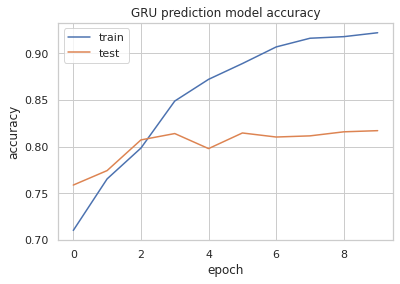

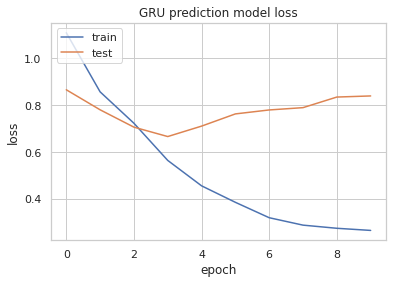

In [ ]:
gruModel.plotModelAccuracy(gruModel_history, 'GRU prediction')

### Prediction using RNN model

In [ ]:
class RNNGloveModel:
  X_test=[]
  y_test=[]
  embedding_matrix=[]

  def wordTokenizer(self, dataframe):
    tokenizer = Tokenizer(num_words=numWords,filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',lower=True,split=' ', char_level=False)
    tokenizer.fit_on_texts(dataframe)
    dataframe = tokenizer.texts_to_sequences(dataframe)
    return tokenizer,dataframe

  def tokenizeAndEmbedding(self,dataframe):
    
    tokenizer,X = self.wordTokenizer(dataframe['tokens'])
    y = np.asarray(dataframe['class'])
    X = pad_sequences(X, maxlen = maxlen)

    self.embedding_matrix = np.zeros((numWords+1, 300))
    for i,word in tokenizer.index_word.items():
      if i<numWords+1:
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            self.embedding_matrix[i] = embedding_vector
    return X,y

  def splitData(self,X,y):

    print("Number of Samples:", len(X))
    print("Number of Labels: ", len(y))
    X_train, self.X_test, y_train, self.y_test = train_test_split(X, y, test_size=0.2, random_state=10)
    X_train, X_Val, y_train, y_Val = train_test_split(X, y, test_size=0.2, random_state=10)
    print("Number of train Samples:", len(X_train))
    print("Number of val Samples:", len(X_Val))

    return X_train, self.X_test, y_train, self.y_test, X_Val, y_Val

  def train(self, dataframe, batch_size, epochs):
    X,y = self.tokenizeAndEmbedding(dataframe)
    X_train, _, y_train, _, X_Val, y_Val = self.splitData(X,y)

    embed = Embedding(numWords+1,output_dim=300,input_length=maxlen,weights=[self.embedding_matrix], trainable=True)
    model=Sequential()
    model.add(Input(shape=(maxlen,),dtype=tf.int64))
    model.add(embed)
    model.add(Conv1D(100,10,activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Dropout(0.3))
    model.add(Conv1D(100,10,activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Bidirectional(LSTM(128)))
    model.add(Dropout(0.3))
    model.add(Dense(100,activation='relu'))
    model.add(Dense(len((pd.Series(y_train)).unique()),activation='softmax'))
    model.compile(loss='sparse_categorical_crossentropy',optimizer="adam",metrics=['accuracy'])

    model.summary()

    checkpoint = ModelCheckpoint('model-{epoch:03d}-{val_accuracy:03f}.h5', verbose=1, monitor='val_accuracy',save_best_only=True, mode='auto') 
    reduceLoss = ReduceLROnPlateau(monitor='val_loss', factor=0.2,patience=2, min_lr=0.0001)
    model_history = model.fit(X_train,y_train,batch_size=batch_size, epochs=epochs, callbacks=[checkpoint,reduceLoss], validation_data=(X_Val, y_Val))
    return model_history, model

  def prediction(self,model):
      
     pred = model.predict(self.X_test)
     pred = [i.argmax() for i in pred]
     print("Precision:",metrics.precision_recall_fscore_support(self.y_test, pred, average='weighted'))
     print(classification_report(self.y_test, pred))
     accuracy = metrics.accuracy_score(self.y_test, pred)
     print("Accuracy of the model :",accuracy)
     return accuracy

  def plotModelAccuracy(self, history, modelname):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])

    plt.title(modelname+' model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])

    plt.title(modelname+' model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train','test'], loc='upper left')
    plt.show()

In [ ]:
RNNModel = RNNGloveModel()
RNNModel_history, model = RNNModel.train(incidents_clust,100,epochs)
RNNModel_accuracy = RNNModel.prediction(model)


Number of Samples: 8063
Number of Labels:  8063
Number of train Samples: 6450
Number of val Samples: 1613


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 300, 300)          2700300   
_________________________________________________________________
conv1d (Conv1D)              (None, 291, 100)          300100    
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 145, 100)          0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 145, 100)          0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 136, 100)          100100    
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 68, 100)           0         
_________________________________________________________________
bidirectional_2 (Bidirection (None, 256)               2

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

65/65 [==============================] - ETA: 0s - loss: 1.0877 - accuracy: 0.7164

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t


Epoch 00001: val_accuracy improved from -inf to 0.76007, saving model to model-001-0.760074.h5
65/65 [==============================] - 5s 83ms/step - loss: 1.0877 - accuracy: 0.7164 - val_loss: 0.8488 - val_accuracy: 0.7601 - lr: 0.0010
Epoch 2/10
64/65 [============================>.] - ETA: 0s - loss: 0.8037 - accuracy: 0.7708

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00002: val_accuracy improved from 0.76007 to 0.78921, saving model to model-002-0.789213.h5
65/65 [==============================] - 5s 71ms/step - loss: 0.8033 - accuracy: 0.7707 - val_loss: 0.7277 - val_accuracy: 0.7892 - lr: 0.0010
Epoch 3/10
64/65 [============================>.] - ETA: 0s - loss: 0.6348 - accuracy: 0.8233

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00003: val_accuracy improved from 0.78921 to 0.79975, saving model to model-003-0.799752.h5
65/65 [==============================] - 5s 70ms/step - loss: 0.6357 - accuracy: 0.8228 - val_loss: 0.6808 - val_accuracy: 0.7998 - lr: 0.0010
Epoch 4/10
64/65 [============================>.] - ETA: 0s - loss: 0.4930 - accuracy: 0.8633

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00004: val_accuracy improved from 0.79975 to 0.80657, saving model to model-004-0.806572.h5
65/65 [==============================] - 5s 73ms/step - loss: 0.4947 - accuracy: 0.8628 - val_loss: 0.7226 - val_accuracy: 0.8066 - lr: 0.0010
Epoch 5/10
65/65 [==============================] - ETA: 0s - loss: 0.3859 - accuracy: 0.8912

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00005: val_accuracy improved from 0.80657 to 0.80719, saving model to model-005-0.807192.h5
65/65 [==============================] - 5s 72ms/step - loss: 0.3859 - accuracy: 0.8912 - val_loss: 0.7136 - val_accuracy: 0.8072 - lr: 0.0010
Epoch 6/10
64/65 [============================>.] - ETA: 0s - loss: 0.2912 - accuracy: 0.9217

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00006: val_accuracy did not improve from 0.80719
65/65 [==============================] - 5s 70ms/step - loss: 0.2912 - accuracy: 0.9214 - val_loss: 0.7679 - val_accuracy: 0.8060 - lr: 2.0000e-04
Epoch 7/10
65/65 [==============================] - ETA: 0s - loss: 0.2474 - accuracy: 0.9336

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00007: val_accuracy improved from 0.80719 to 0.80905, saving model to model-007-0.809051.h5
65/65 [==============================] - 5s 73ms/step - loss: 0.2474 - accuracy: 0.9336 - val_loss: 0.8248 - val_accuracy: 0.8091 - lr: 2.0000e-04
Epoch 8/10
64/65 [============================>.] - ETA: 0s - loss: 0.2199 - accuracy: 0.9441

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00008: val_accuracy did not improve from 0.80905
65/65 [==============================] - 5s 69ms/step - loss: 0.2191 - accuracy: 0.9440 - val_loss: 0.8609 - val_accuracy: 0.8066 - lr: 1.0000e-04
Epoch 9/10
64/65 [============================>.] - ETA: 0s - loss: 0.2104 - accuracy: 0.9466

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00009: val_accuracy did not improve from 0.80905
65/65 [==============================] - 4s 69ms/step - loss: 0.2106 - accuracy: 0.9465 - val_loss: 0.8674 - val_accuracy: 0.8060 - lr: 1.0000e-04
Epoch 10/10
64/65 [============================>.] - ETA: 0s - loss: 0.2051 - accuracy: 0.9472

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()



Epoch 00010: val_accuracy did not improve from 0.80905
65/65 [==============================] - 4s 69ms/step - loss: 0.2058 - accuracy: 0.9471 - val_loss: 0.8791 - val_accuracy: 0.8047 - lr: 1.0000e-04


/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.tensor_content = nparray.tostring()
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  tensor_proto.t

Precision: (0.7885234081623794, 0.8047117172969622, 0.7952353814625616, None)
              precision    recall  f1-score   support

           0       0.86      0.91      0.88      1011
           1       0.92      0.88      0.90       257
           2       0.51      0.45      0.48       179
           3       0.73      0.73      0.73        51
           4       0.32      0.39      0.35        31
           5       0.33      0.23      0.27        40
           6       0.00      0.00      0.00        12
           7       0.75      0.50      0.60        12
           8       1.00      0.88      0.93         8
           9       0.00      0.00      0.00        12

    accuracy                           0.80      1613
   macro avg       0.54      0.49      0.51      1613
weighted avg       0.79      0.80      0.80      1613

Accuracy of the model : 0.8047117172969622


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


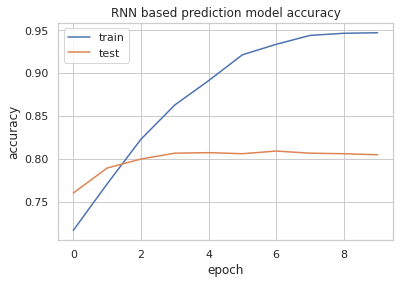

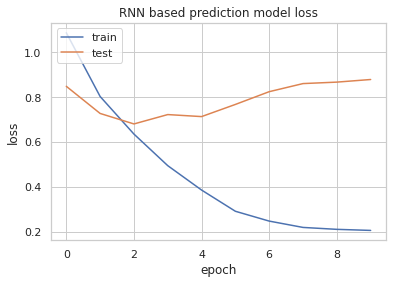

In [ ]:
RNNModel.plotModelAccuracy(RNNModel_history, 'RNN based prediction')

We observe that the machine learning models are performing better when comparing the prediction performance and training latency. One possible reason is that we train the Neural network models with the text data where there is a huge imbalance and there is overfitting clearly visible. On the other hand, we have smoothened the input class distribution to Machine learning model using SMOTE so there is a better performance.

### Text Classification With Hugging Face Transformers in TensorFlow Using [ktrain](https://github.com/amaiya/ktrain)


In [ ]:
pip install transformers

In [ ]:
!pip3 install ktrain

In [ ]:
from ktrain import text

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(incidents_clust['tokens'].values, incidents_clust['class'].values, test_size=0.15, random_state=10)

In [ ]:
!pip3 install -q git+https://github.com/amaiya/eli5@tfkeras_0_10_1

In [ ]:
MODEL_NAME = 'distilbert-base-uncased'
t = text.Transformer(MODEL_NAME, maxlen=500, classes=incidents_clust['class'].unique().tolist())
trn = t.preprocess_train(X_train, y_train)
val = t.preprocess_test(X_test, y_test)
model = t.get_classifier()

/usr/local/lib/python3.6/dist-packages/ktrain/text/preprocessor.py:399: UserWarning: The class_names argument is replacing the classes argument. Please update your code.
  warnings.warn('The class_names argument is replacing the classes argument. Please update your code.')


preprocessing train...
language: en
train sequence lengths:
	mean : 19
	95percentile : 69
	99percentile : 124


Is Multi-Label? False
preprocessing test...
language: en
test sequence lengths:
	mean : 19
	95percentile : 53
	99percentile : 120


Some layers from the model checkpoint at distilbert-base-uncased were not used when initializing TFDistilBertForSequenceClassification: ['vocab_projector', 'vocab_layer_norm', 'vocab_transform', 'activation_13']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFDistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['pre_classifier', 'classifier', 'dropout_59']
You should probably TRAIN this model on a down-stream task to be able to use i

In [ ]:
pip install tensorflow

In [ ]:
import ktrain

In [ ]:
learner=ktrain.get_learner(model,train_data=trn,val_data=val,batch_size=6)

simulating training for different learning rates... this may take a few moments...
Epoch 1/3


The parameters `output_attentions`, `output_hidden_states` and `use_cache` cannot be updated when calling a model.They have to be set to True/False in the config object (i.e.: `config=XConfig.from_pretrained('name', output_attentions=True)`).
The parameter `return_dict` cannot be set in graph mode and will always be set to `True`.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tens

1142/1142 [==============================] - 412s 361ms/step - loss: 1.5254 - accuracy: 0.5836
Epoch 2/3
1142/1142 [==============================] - 416s 365ms/step - loss: 1.2242 - accuracy: 0.6704
Epoch 3/3
1142/1142 [==============================] - 408s 357ms/step - loss: 1.7379 - accuracy: 0.6004


Some layers from the model checkpoint at /tmp/tmpqzuq0xkn were not used when initializing TFDistilBertForSequenceClassification: ['dropout_59']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFDistilBertForSequenceClassification were not initialized from the model checkpoint at /tmp/tmpqzuq0xkn and are newly initialized: ['dropout_79']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.




done.
Visually inspect loss plot and select learning rate associated with falling loss


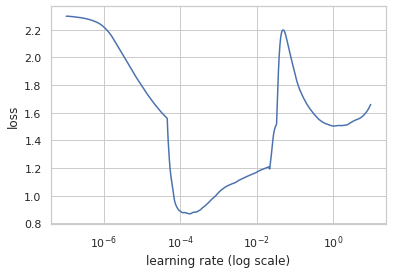

In [ ]:
learner.lr_find(show_plot=True, max_epochs=3)

In [ ]:
learner.fit_onecycle(5e-5, 7)



begin training using onecycle policy with max lr of 5e-05...
Epoch 1/7


The parameters `output_attentions`, `output_hidden_states` and `use_cache` cannot be updated when calling a model.They have to be set to True/False in the config object (i.e.: `config=XConfig.from_pretrained('name', output_attentions=True)`).
The parameter `return_dict` cannot be set in graph mode and will always be set to `True`.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tens

1143/1143 [==============================] - ETA: 0s - loss: 0.9417 - accuracy: 0.7582

The parameters `output_attentions`, `output_hidden_states` and `use_cache` cannot be updated when calling a model.They have to be set to True/False in the config object (i.e.: `config=XConfig.from_pretrained('name', output_attentions=True)`).
The parameter `return_dict` cannot be set in graph mode and will always be set to `True`.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:523: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.6/dist-packages/tens

1143/1143 [==============================] - 440s 385ms/step - loss: 0.9417 - accuracy: 0.7582 - val_loss: 0.6350 - val_accuracy: 0.8149
Epoch 2/7
1143/1143 [==============================] - 439s 384ms/step - loss: 0.6070 - accuracy: 0.8252 - val_loss: 0.5683 - val_accuracy: 0.8157
Epoch 3/7
1143/1143 [==============================] - 439s 384ms/step - loss: 0.4676 - accuracy: 0.8606 - val_loss: 0.5616 - val_accuracy: 0.8380
Epoch 4/7
1143/1143 [==============================] - 439s 384ms/step - loss: 0.3564 - accuracy: 0.9002 - val_loss: 0.5542 - val_accuracy: 0.8298
Epoch 5/7
1143/1143 [==============================] - 439s 384ms/step - loss: 0.2274 - accuracy: 0.9365 - val_loss: 0.6017 - val_accuracy: 0.8397
Epoch 6/7
1143/1143 [==============================] - 439s 384ms/step - loss: 0.1329 - accuracy: 0.9661 - val_loss: 0.6770 - val_accuracy: 0.8496
Epoch 7/7
1143/1143 [==============================] - 439s 384ms/step - loss: 0.0772 - accuracy: 0.9819 - val_loss: 0.6996 - va

The prediction has reported worst losses, we can see the model has intepreted many non-zero records as zero classes. As already explained above, the imbalance is a main reason. Also, the model reports record 65 as the prediction with the worst loss, we can use the explain utility provided by the library to understand why this prediction occurred.

In [ ]:
predictor = ktrain.get_predictor(learner.model, preproc=t)
print(X_test[65])

sid user lock


From the above prediction, we can see which words have contributed to the model's understanding of the data and subsequent prediction. The more darker green the text is highlighted, it influences the model more to predict the respective class.

## Group classification (Secondary layer)

Till this point, we have attempted to predict the cluster class that relates to different assignment group. So, this doesn't make a complete solution. As a precursor to the full model, the below sample shows a secondary layer classification that tries to predict the assignment group to which the ticket needs to be assigned. Through a similar approach and more balanced data, it is possible to scale it to accomodate multiple classification labels for prediction.

In [175]:
incidents_clus0 = incidents_cosine[incidents_cosine['class']==0]
incidents_clus0['Group id'].value_counts()

18    215
2     200
0     192
12    145
13    118
25    116
29     97
17     88
39     45
28     44
40     40
20     36
10     30
21     28
50      8
Name: Group id, dtype: int64

In [176]:
incidents_clus0 = incidents_clus0[['embedding','Group id']]
incidents_clus0

,embedding,Group id
0,"[-0.31042483377016405, -0.13657435978000815, -...",0
1,"[-0.17769833467900753, 0.17365873555342357, -0...",0
2,"[-0.30098866009049946, 0.11160105839371681, -0...",0
3,"[-0.17625676369404092, 0.05549770812777912, -0...",0
4,"[-0.19684508466161788, 0.16901071688958577, -0...",0
...,...,...
8469,"[-0.18105648648572945, -0.009040686826245124, ...",17
8487,"[-0.22685095268017708, 0.02656197896312575, -0...",2
8490,"[-0.22241373239615578, 0.022954420292679266, -...",29
8494,"[-0.26601989727978614, 0.07868339501175226, -0...",2


In [177]:
incidents_clus0['Group id'] = incidents_clus0['Group id'].map({18:0,2:1,0:2,12:3,13:4,25:5,29:6,17:7,39:8,28:9,40:10,20:11,10:12,21:13,50:14})

In [178]:
incidents_clus0['Group id'].unique()

array([ 2,  1, 12,  3,  4,  7,  0, 11, 13,  5,  9,  6,  8, 10, 14])

In [179]:
X1 = incidents_clus0['embedding'].values.tolist()
y1 = incidents_clus0['Group id']
X1 = np.array(X1)
y1 = np.array(y1)

In [180]:
oversample = SMOTE(k_neighbors=5)
X1, y1 = oversample.fit_resample(X1, y1)

undersample = RandomUnderSampler(random_state=42)
incidents_clus0_smd, incidents_clus0_sml = undersample.fit_resample(X1, y1)

In [181]:
X_train, X_test, y_train, y_test = train_test_split(incidents_clus0_smd, incidents_clus0_sml, test_size=0.15, random_state=10)

In [182]:
knn = KNeighborsClassifier(n_neighbors=5 , weights = 'distance')
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='distance')

In [183]:
print('Training accuracy: %.2f%%' % (accuracy_score(y_train,knn.predict(X_train)) * 100))
print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, knn.predict(X_test)) * 100))
print('Confusion matrix:\n %s' % (confusion_matrix(y_test, knn.predict(X_test))))
print('Classification report:\n %s' % (classification_report(y_test, knn.predict(X_test))))

Training accuracy: 99.78%
Testing accuracy: 73.97%
Confusion matrix:
 [[ 4  1  1  2  0  6  3  1  4  3  2  4  2  0  2]
 [ 1  9  0  0  0  3  3  1  4  4  2  1  3  1  6]
 [ 5  2  8  1  1  1  1  2  0  2  1  0  0  0  0]
 [ 0  0  0 22  1  0  1  1  3  1  0  2  1  0  0]
 [ 0  0  0  1 33  0  0  3  0  0  2  0  1  0  1]
 [ 1  1  0  3  1 26  1  1  0  2  2  2  2  0  2]
 [ 0  0  0  1  0  0 26  4  0  0  1  0  0  1  0]
 [ 0  0  0  2  1  0  0 33  0  0  0  0  0  1  0]
 [ 0  0  0  0  0  0  0  0 27  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0 26  0  0  0  0  0]
 [ 0  1  0  0  0  0  0  0  0  0 32  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  1  0 29  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0 23  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0 30  0]
 [ 0  0  0  0  0  0  0  0  0  0  1  0  0  0 30]]
Classification report:
               precision    recall  f1-score   support

           0       0.36      0.11      0.17        35
           1       0.64      0.24      0.35        38
           2       0.8

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Estimator: OneVsRestClassifier(estimator=LinearSVC(C=1.0, class_weight='balanced',
                                        dual=True, fit_intercept=True,
                                        intercept_scaling=1, loss='hinge',
                                        max_iter=1000, multi_class='ovr',
                                        penalty='l2', random_state=42,
                                        tol=0.0001, verbose=0),
                    n_jobs=None)
Training accuracy: 36.56%
Testing accuracy: 33.88%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.08      0.03      0.04        35
           1       0.42      0.13      0.20        38
           2       0.50      0.08      0.14        24
           3       0.29      0.22      0.25        32
           4       0.26      0.27      0.27        41
           5       0.35      0.32      0.33        44
           6       0.32      0.36      0.34        33
  

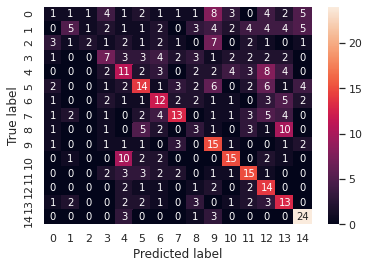

In [184]:
run_classification(OneVsRestClassifier(LinearSVC(loss='hinge',random_state=42,class_weight='balanced')), X_train, X_test, y_train, y_test, "LinearSVC-Glove & Hierarchical")

**SGD CLASSIFIER**

Estimator: SGDClassifier(alpha=0.001, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=100, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=42, shuffle=True, tol=None,
              validation_fraction=0.1, verbose=0, warm_start=False)
Training accuracy: 13.68%
Testing accuracy: 11.36%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        35
           1       0.07      0.79      0.13        38
           2       0.34      0.42      0.38        24
           3       0.00      0.00      0.00        32
           4       0.00      0.00      0.00        41
           5       0.50      0.02      0.04        44
           6       0.50      0.03      0.06        33
           7       0.43      0.16    

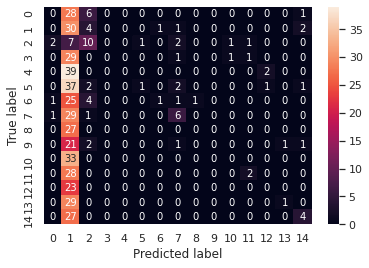

In [187]:
run_classification(SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=100, tol=None,class_weight='balanced'), 
                   X_train, X_test, y_train, y_test, "SGDClassifier-Glove & Hierarchical")

Logistic Regression

Estimator: LogisticRegression(C=100000.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=1, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy: 43.78%
Testing accuracy: 37.81%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        35
           1       0.21      0.11      0.14        38
           2       0.23      0.29      0.25        24
           3       0.25      0.22      0.23        32
           4       0.48      0.32      0.38        41
           5       0.53      0.39      0.45        44
           6       0.28      0.33      0.31        33
           7       0.41      0.30      0.34        37
           8       0.30      0.30      0.30        27
           9       0.

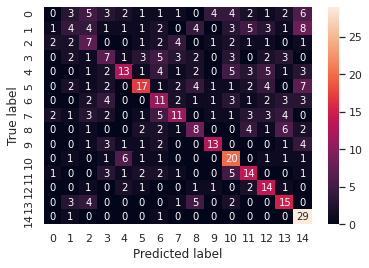

In [188]:
run_classification(LogisticRegression(n_jobs=1, C=1e5,class_weight='balanced'), X_train, X_test, y_train, y_test, "LogisticRegression-Glove & Hierarchical")


Random Forest Classifier

Estimator: RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=0, verbose=0, warm_start=False)
Training accuracy: 99.60%
Testing accuracy: 67.36%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.39      0.26      0.31        35
           1       0.29      0.18      0.23        38
           2       0.47      0.62      0.54        24
           3       0.47      0.47      0.47        32
           4       0.62      0.61      0.62        41
           5       0.66      0.52      0.58        44
           6       0.57  

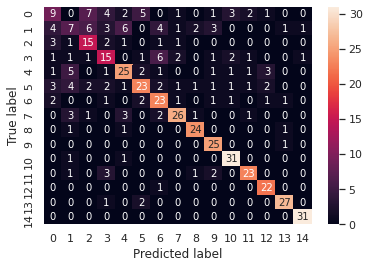

In [189]:
run_classification(RandomForestClassifier(max_depth=15, random_state=0, class_weight="balanced"), X_train, X_test, y_train, y_test, "RandomForest-Glove & Hierarchical")

**Decision Tree Classifier**

Estimator: DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
Training accuracy: 99.85%
Testing accuracy: 57.02%
Confusion matrix:

Classification report:
               precision    recall  f1-score   support

           0       0.23      0.20      0.22        35
           1       0.39      0.24      0.30        38
           2       0.27      0.33      0.30        24
           3       0.41      0.41      0.41        32
           4       0.58      0.54      0.56        41
           5       0.58      0.43      0.49        44
           6       0.64      0.64      0.64        33
           7       0.58      0.59      0.59        37
   

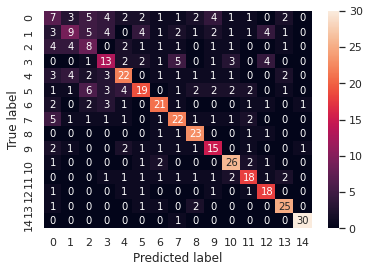

In [190]:
run_classification(DecisionTreeClassifier(), X_train, X_test, y_train, y_test, "DecisionTree-Glove & Hierarchical")

In [186]:
import warnings
warnings.filterwarnings('ignore')

## **Final Conclusion**
We first analysed the dataset provided to us, undestood the structure of the data provided - number of columns, field , datatypes etc.

> We first analysed the dataset provided to us, undestood the structure of the data provided - number of columns, field , datatypes etc.

> We did Exploratory Data Analysis to derive further insights from this data set and we found that
*   Data is very much imbalanced, there are around ~45% of the Groups with less than 20 tickets.
*   Few of the tickets are in foreign language like German
*   The data has lot of noise in it, for eg- few tickets related to account setup are spread across multiple assignment groups.

> We performed the data cleaning and preprocessing:
*   Translation: A small number of tickets were written in German. Hence, we used the Google translate to convert German to English to generate the input data for the next steps. 
*   Make text all lowercase so that the algorithm does not treat the same words in different cases as different
*   Removing Noise i.e everything that isn’t in a standard number or letter i.e Punctuation, Numerical values
*   Removing extra spaces
*   Removed punctuations
*   Removed words containing numbers
*   Stopword Removal: Sometimes, some extremely common words which would appear to be of little value in helping select documents matching a user need are excluded from the vocabulary entirely. These words are called stop words
*   Lemmatization
*   Tokenization: Tokenization is just the term used to describe the process of converting the normal text strings into a list of tokens i.e words that we actually want. Sentence tokenizer can be used to find the list of sentences and Word tokenizer can be used to find the list of words in strings.

> In the process of analysing the dataset, we used Analysis Of Variance (ANOVA) hypothesis testing algorithm to conclude that the some words have strong relevance to specific assignment groups at a 0.05 significance level.

> We then explored unsupervised learning techniques including topic modeling using Latent Dirichlet Allocation (LDA) and Non-Negative Matrix Factorization (NMF) methods, in an attempt to identify major topics for which tickets were raised. It was observed that NMF was able to identify fine grained topics.

> Dimensionality reduction by t-distributed stochastic neighbor embedding (T-sNE) was performed to visualize clusters of ticket groups. Since there were many different clusters, we proceeded to other clustering approaches.

> Clustering using hierarchical agglomerative clustering was performed to arrive at the different clusters and pseudo group of the assignment groups.

> We also attempted to cluster the group data into clusters using the KMeans algorithm and tf-idf vectors.

> We then trained various supervised machine learning models using the cleaned and preprocessed dataset, focusing only on the 37 groups above clustered into 10 classes. Other assignment groups have very less number of records for our model to understand and predict.

> We trained the Bag of Words embedding data using below models:
*   Multinomial NB
*   Linear Support vector Machine
*   SGD Classifier
*   Random Forest
*   Decision Tree
*   Logistic regression
*   K Nearest Neighbors   
  We achieved 79% accuracy with Multinomial Naive Bayes model, clearly the performance was low due to vast imbalance between different classes. Imbalance causes two problems:
1) Training is inefficient as most samples are easy examples that contribute no useful learning signal
2) The easy examples can overwhelm training and lead to degenerate models. A common solution is to perform some form of hard negative mining that samples hard examples during training or more complex sampling/re weighing schemes.In order to handle the imbalance problem we used class_weight=balanced hyperparameter while training the model, which tells the model to "pay more attention" to samples from an under-represented class although it brought down the accuracy and f1_score.

> Using cosine distance and SMOTE algorithm, we shortened the dataset and brought all classes to the same range. Training the same models using the glove embedding this time, we are able to achieve 84.53% accuracy with 86.18 f1 score using the K Nearest Neighbors classifier.

> We performed hyper paramater tuning using GridSearchCV to determine the best hyperparameters for each model. kNN and Random Forest algorithm produced the best results with 87% accuracy and f1 score, although the kNN trained quicker.

> We attempted utilising Neural network architectures:
* Bidirectional Encoder Representations from Transformers (BERT)
* Long Short Term Memory (LSTM)
* Gated Recurrent Unit (GRU)
* Recurrent Neural Network (RNN)
* Transformers (ktrain)   
   In this case, we trained on original text data which is imbalanced so overfitting is more prevalent and the common pattern was that test accuracy flatted early on where the training accuracy is increasing rapidly. We are able to achieve 80% accuracy on the test data.

> We demonstrated a second layer of classification to predict the assignment group within a single cluster using the K Nearest Neighbors algorithm, it was achieved with 73% accuracy. This approach can be extended to other clusters given the data is sufficiently large.

In [ ]:
# Savig th RNN model
filename = 'finalized_model.sav''
pickle.dump(RNNModel, open(filename, 'wb'))